In [25]:
import pandas as pd
import os
import numpy as np

import get_votos

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.manifold import TSNE

import chart_studio
import plotly.graph_objs as go
chart_studio.tools.set_credentials_file(username='felipe84zt',api_key='F03ELIAc0CCcvrQ3cdXx')

import altair as alt
alt.renderers.enable('notebook')

from selenium import webdriver
from selenium.webdriver.firefox.options import Options

import networkx as nx
import chart_studio
import plotly.graph_objs as go
chart_studio.tools.set_credentials_file(username='felipe84zt',api_key='F03ELIAc0CCcvrQ3cdXx')



In [2]:
path='C:/Users/Felipe/Documents/GitHub/IntroDS-Projeto-Final/Data2/'
options_ = Options()
options_.set_preference("browser.download.folderList",2)
options_.set_preference("browser.download.manager.showWhenStarting", False)
options_.set_preference("browser.download.dir",path)
options_.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/pdf")
options_.set_preference("pdfjs.disabled", "true")
browser = webdriver.Firefox(options=options_)

In [3]:
rootPath1=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Fevereiro19'
rootPath2=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Março19'
rootPath3=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Abril19'
rootPath4=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Maio19'
rootPath5=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Junho19'
rootPath6=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Julho19'
rootPath7=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\56-LEG-PRIMEIRA-SESSAO-LEGISLATIVA-Agosto19'
rootPath8=r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\Todos os meses'

arquivo='Abril2019.csv'
arquivo2='Maio2019.csv'

arquivo2='votos2011.csv'

#filename=os.path.join(rootPath,arquivo)
#filename2=os.path.join(rootPath2,arquivo2)

#df_abril=get_votos.votos(rootPath)
#df_maio=get_votos.votos(rootPath2)
#df_marco=get_votos.votos(rootPath3)
#df_junho=get_votos.votos(rootPath4)
#df_julho=get_votos.votos(rootPath5)

vt_todos=get_votos.votos(rootPath8)

In [4]:
vt_todos['Estado'].unique()
#df_pp.to_csv(r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Site\parlamentares_por_partido.csv')

array(['Roraima', 'Amapá', 'Pará', 'Amazonas', 'Rondonia', 'Acre',
       'Tocantins', 'Maranhão', 'Ceará', 'Piauí', 'Rio Grande do Norte',
       'Paraíba', 'Pernambuco', 'Alagoas', 'Sergipe', 'Bahia',
       'Minas Gerais', 'Espírito Santo', 'Rio de Janeiro', 'São Paulo',
       'Mato Grosso', 'Distrito Federal', 'Goiás', 'Mato Grosso do Sul',
       'Paraná', 'Santa Catarina', 'Rio Grande do Sul'], dtype=object)

In [682]:
vt_ago[vt_ago['Estado']=='17 Rio de Janeiro']

,Nome,Partido,Estado,Codigo,CD01O206E008995,CD01O206E008996,CD01O206E008997,CD01O207E008998,CD01O207E008999,CD01O207E009000,...,CD01O216E009014,CD01O216E009015,CD01O216E009016,CD01O218E009018,CD01O218E009019,CD01O218E009021,CD01O218E009022,CD01O218E009023,CD01O218E009024,CD01O218E009025


In [681]:
vt_ago['Estado'].iloc[310]='Rio de Janeiro'
#vt_jul['Nome'].iloc[236]='LUIS TIBÉ'
#vt_jul['Partido'].iloc[236]='PTdoB'

In [7]:
def lado_partido(df_mes):
    
    GOVERNO=['PSL','PP','PSD','MDB','PR','PRB','DEM','PSDB','PTB','PMN','PSC','NOVO','PTC','PHS']
    MINORIA=['PDT','AVANTE','Avate','PATRI','PV','PROS','PPS','CIDADANIA','SOLIDARIEDADE','Solidariedade',\
             'PODE','PL','DC','PRP','PATRIOTA','Patriota','Podemos','S.Part.']
    OPOSICAO=['PT','PSOL','PSB','REDE','PCdoB','PPL']
    df_mes['Lado']=0
    for i in range(len(df_mes['Partido'])):
        if df_mes['Partido'].iloc[i] in GOVERNO:
            df_mes['Lado'].iloc[i]='GOVERNO'
        elif df_mes['Partido'].iloc[i] in OPOSICAO:
            df_mes['Lado'].iloc[i]='OPOSIÇÃO'
        elif df_mes['Partido'].iloc[i] in MINORIA:
            df_mes['Lado'].iloc[i]='MINORIA'
        else:
            print(df_mes['Partido'].iloc[i])
            print(i)

In [8]:
lado_partido(vt_todos)

C:\Users\Felipe\Anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [399]:
def matriz_votos(df_mes):
    
    mat_vts=np.zeros((len(df_mes),len(df_mes.iloc[:,4:-1].columns)))
    num_votes_in_row=np.zeros(len(df_mes))
    
    for linha in range(len(df_mes)):
        num_votes = 0
        votos = df_mes.loc[[linha]].iloc[:,4:-1]
        roll_array = np.zeros(len(votos.columns))
        for idx,vt in enumerate(votos.columns):
        
            if votos[vt].iloc[0]=='Sim':
                roll_array[idx] = 1
                num_votes = num_votes + 1
            elif votos[vt].iloc[0]=='Não':
                roll_array[idx] = -1
                num_votes = num_votes + 1
            elif votos[vt].iloc[0]=='Obstrução':
                roll_array[idx] = -1
                num_votes = num_votes + 1  
            elif votos[vt].iloc[0]=='Abstenção':
                roll_array[idx] = 0
                num_votes = num_votes + 1
            else:
                roll_array[idx] = 0
        num_votes_in_row[linha] = num_votes

        mat_vts[linha] = roll_array
    
    return mat_vts,num_votes_in_row

In [694]:
matriz,arr=matriz_votos(vt_todos)

In [628]:
def tsne_camara(matriz,df_mes):
    
    tsne=TSNE()
    tsne_vt=tsne.fit_transform(matriz)
    df_mes['tsne-1d-one']=tsne_vt[:,0]
    df_mes['tsne-2d-two']=tsne_vt[:,1]

    sns.set(rc={'axes.facecolor':'#e9ecbf', 'figure.facecolor':'#e9ecbf'})
    plt.figure(figsize=(16,10))

    sns.scatterplot(data=df_mes,hue='Lado',x='tsne-1d-one',y='tsne-2d-two',marker='s',\
                    palette=['b','g','r'],sizes=[10])

    leg = plt.legend()
    leg.get_frame().set_alpha(1)
    plt.tick_params(direction='out', length=6, width=2, colors='r',
                   grid_color='r', grid_alpha=0.5)
    
    

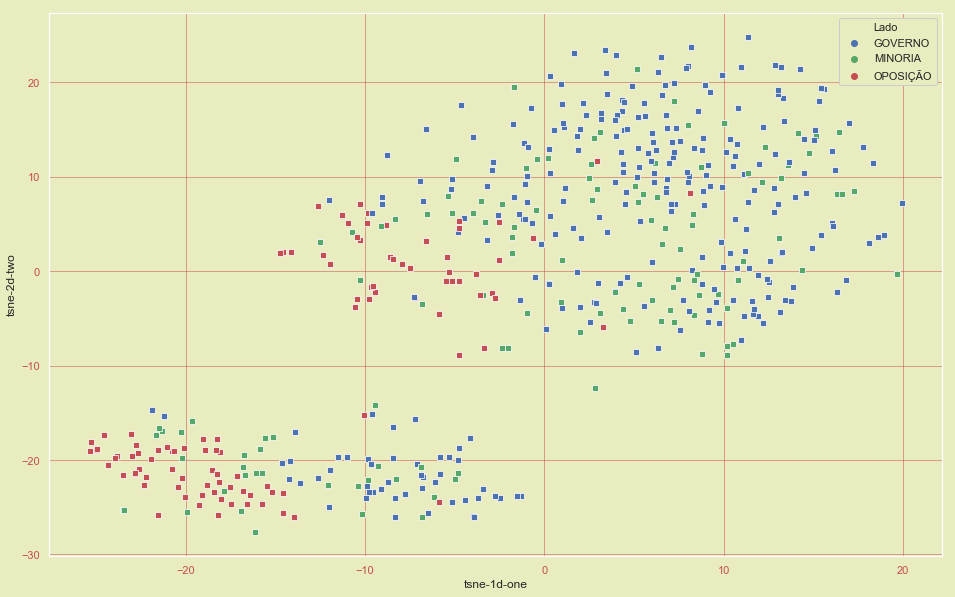

In [695]:
tsne_camara(matriz,vt_todos)

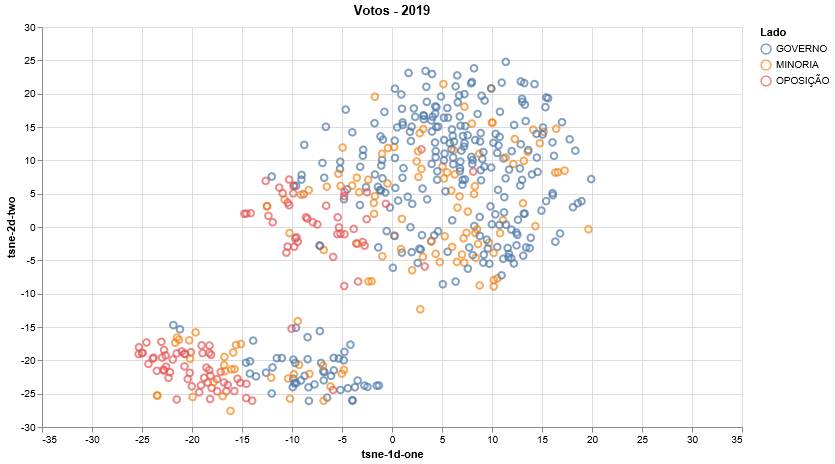

In [696]:
xscale = alt.Scale(domain=(-35, 35))
yscale = alt.Scale(domain=(-30, 30))

chart=alt.Chart(vt_todos,width=700,\
          height=400).mark_point(size=45).encode(alt.X('tsne-1d-one',scale=xscale),\
                                                 alt.Y('tsne-2d-two',scale=yscale),color='Lado',\
                                                 tooltip=['Nome','Partido','Estado']).properties(title='Votos - 2019')

chart.save('chart_todos.html')
chart

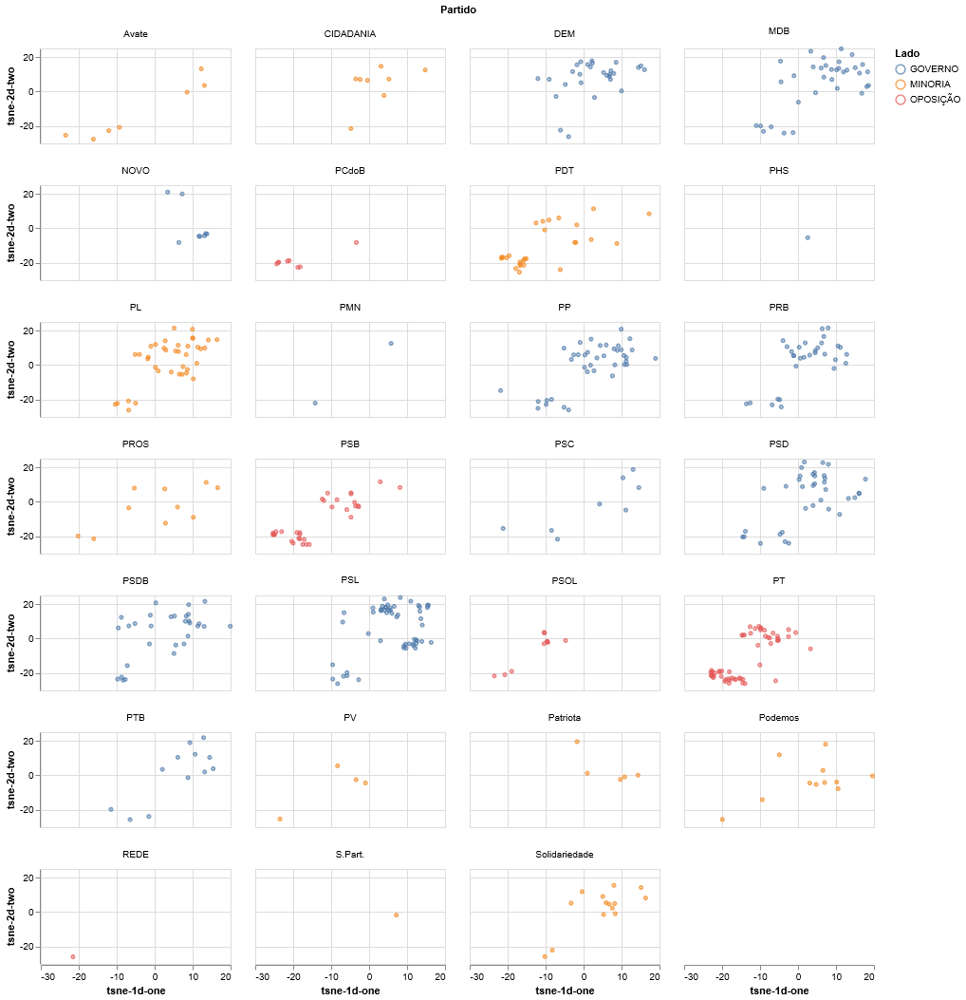

In [697]:

chart_part=alt.Chart(vt_todos,width=250,height=100).mark_point(size=10).encode(x='tsne-1d-one:Q',y='tsne-2d-two:Q'\
                                                                  ,color='Lado:N',\
                             
                                                                  tooltip=['Nome','Partido','Estado'],\
                                                                  facet='Partido:O').properties(columns=4,width=200,height=100)
chart_part.save('chart_part_todos.html')
chart_part

In [698]:
vt_todos.to_csv(r'C:\Users\Felipe\Documents\GitHub\IntroDS-Projeto-Final\Data3\votos_todos.csv',sep=';',index=False)

In [9]:
def rede_est_part(df_pe):
    print('Fase 0')
    deputados = df_pe['Nome']
    pesos= {dep:{ped: 0 for ped in deputados if ped!=dep} for dep in deputados}
    print('Fase 1')
    
    for a in range(len(df_pe)):
        estado1=df_pe['Estado'].iloc[a]
        for b in range(a+1,len(df_pe)):
            estado2=df_pe['Estado'].iloc[b]
            if estado1==estado2:
                pesos[df_pe['Nome'].iloc[a]][df_pe['Nome'].iloc[b]]+=1
    print('Fase 2')
    
    
    for a in range(len(df_pe)):
        estado1=df_pe['Partido'].iloc[a]
        for b in range(a+1,len(df_pe)):
            estado2=df_pe['Partido'].iloc[b]
            if estado1==estado2:
                pesos[df_pe['Nome'].iloc[a]][df_pe['Nome'].iloc[b]]+=1
    
    print('Fase 3')
    g = nx.Graph()
    for par,nome in enumerate(deputados):
        g.add_node(nome)
        if df_pe['Lado'].iloc[par]=='GOVERNO':
            g.node[nome]['color'] ='b'
        elif df_pe['Lado'].iloc[par]=='OPOSIÇÃO':
            g.node[nome]['color'] ='r'
        elif df_pe['Lado'].iloc[par]=='MINORIA':
            g.node[nome]['color'] ='y'
        else:
            g.node[nome]['color'] ='m'
    print('Fase 4')
    for dep1, vizinho in pesos.items():
        for dep2, peso in vizinho.items():
            if peso == 0:
                continue
            g.add_edge(dep1,dep2, weight= peso, difference = 1. / peso)
            
    return g

In [12]:
rede=rede_est_part(vt_todos)

Fase 0
Fase 1
Fase 2
Fase 3
Fase 4


In [53]:
def mst_votes(votes_net_mes,nomes_dep=True,labels='all'):
    
    plt.figure(figsize=(30, 20))
    np.random.seed(5)
    mst = nx.minimum_spanning_tree(votes_net_mes, weight='difference')
    pos = nx.spring_layout(mst, iterations=900, k=.008, weight='difference')


    mst_edges = list(nx.minimum_spanning_edges(votes_net_mes, weight='difference'))

    nl = votes_net_mes.nodes()
    c = [votes_net_mes.node[n]['color'] for n in nl]


    nx.draw_networkx_edges(votes_net_mes, pos, edgelist=mst_edges, alpha=0.8)
    nx.draw_networkx_nodes(votes_net_mes, pos, nodelist = nl, node_color = c, node_size=120)

    for p in pos.values():
        p[1] += .02
    
    if nomes_dep==True:
        if labels=='all':
            
            nx.draw_networkx_labels(votes_net_mes, pos, font_color='k', font_size=10)
        else:
            nx.draw_networkx_labels(votes_net_mes, pos,labels, font_color='k', font_size=8)
        
    plt.title("MST of Vote Disagreement", fontsize=12)
    plt.xticks([])
    plt.yticks([])
    #remove_border(left=False, bottom=False)
    
    return mst


C:\Users\Felipe\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning:

isinstance(..., numbers.Number)



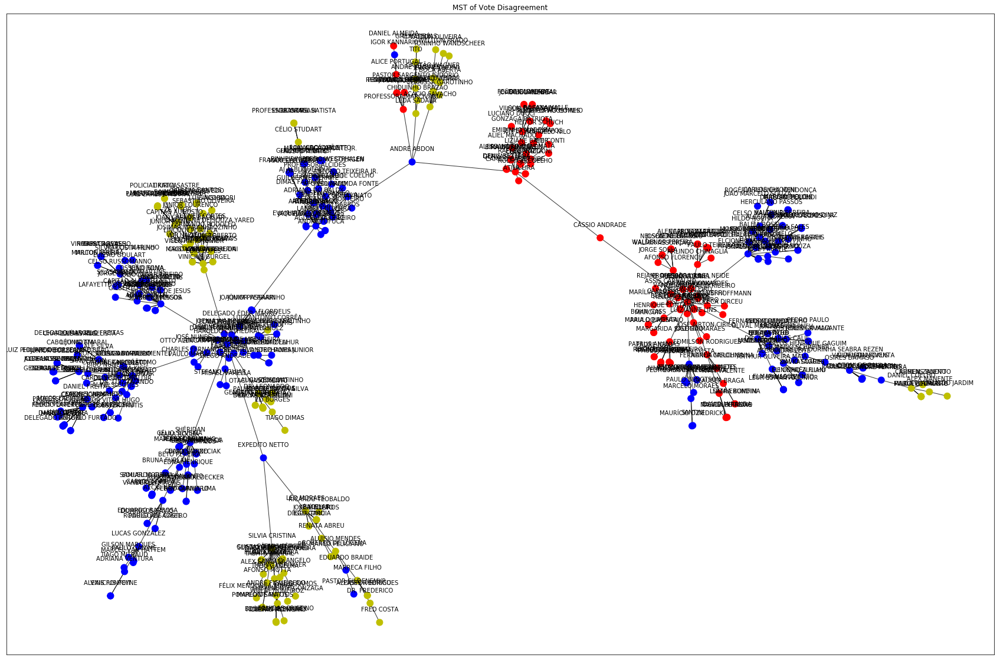

In [54]:
mst=mst_votes(rede)

In [83]:
def maj_game(rede,df_mes,resultado_prev=0,rounds='all'):
    
    if rounds=='all':
        rounds=len(df_mes.columns)-5
        
    deputados=df_mes['Nome']
    resultado_est= {dep:0 for dep in deputados}
    resultado_part={dep:0 for dep in deputados}
    res_iter_est=[]
    
    serie_res_est={dep:[] for dep in deputados}
    serie_res_part={dep:[] for dep in deputados}
    
    erro=[]

    pesos= {dep:{ped: 0 for ped in deputados if ped!=dep} for dep in deputados}
    
    for rodada in range(rounds):
        for sessao in df_mes.iloc[:,4+rodada:5+rodada]:
            print('-----------------------------')
            print('Rodada: ',rodada)
            df=df_mes[['Nome','Estado','Partido',sessao]]
            
            for i in range(len(df)):
                
                nome=df['Nome'].iloc[i]
                if nome not in resultado_est.keys():
                    resultado_est[nome]=0
                    print(nome)
                if nome not in resultado_part.keys():
                    resultado_part[nome]=0
                    print(nome)
                    
                votou1=df[sessao].iloc[i]
                
                if votou1=='Não Votou':
                    serie_res_part[nome].append(0)
                    serie_res_est[nome].append(0)
                    continue
                    
                elif votou1=='Art.':
                    serie_res_part[nome].append(0)
                    serie_res_est[nome].append(0)
                    continue
                    
                votos_t_est=[]
                votos_t_part=[]
                
                votos_abs_est=[]
                votos_abs_part=[]
                
                estado1=df[df['Nome']==nome]['Estado'].item()
                partido1=df[df['Nome']==nome]['Partido'].item()
                
                for edge in rede.edges(nome):
                    
                    votos_t=0
                    votos_abs=0
                    
                    dep2=edge[1]
                    estado2=df[df['Nome']==dep2]['Estado'].item()
                    partido2=df[df['Nome']==dep2]['Partido'].item()
                    
                    if dep2 not in set(df['Nome']):
                        votou2='Art.'
                        erro.append(dep2)
                    else:
                        votou2=df[df['Nome']==dep2][sessao].item()
                    
                    if votou2=='Não':
                        votos_t=0
                    elif votou2=='Sim':
                        votos_t=1
                    elif votou2=='Não Votou':
                        pass
                    elif votou2=='Art.':
                        pass
                    elif votou2=='Obstrução':
                        votos_t=0
                    elif votou2=='Abstenção':
                        votos_abs=-1
                    else:
                        print('Erro',edge)
                        
                    if estado1==estado2:
                        votos_t_est.append(votos_t)
                        votos_abs_est.append(votos_abs)
                        
                    if partido1==partido2:
                        votos_t_part.append(votos_t)
                        votos_abs_part.append(votos_abs)
                        
                    if votou1==votou2:
                        pesos[nome][dep2]+=1
                        
                        
                media_est=np.mean(votos_t_est)
                media_part=np.mean(votos_t_part)
                
                if media_est>0.5:
                    vencedor_est='Sim'
                elif media_est<=0.5:
                    vencedor_est='Não'
                    
                if media_part>0.5:
                    vencedor_part='Sim'
                elif media_part<=0.5:
                    vencedor_part='Não'
                
                if votou1=='Abstenção':
                    if (len(votos_t_est)+len(votos_t_part))==0:
                        print(sessao)
                        print(rede.edges(nome))
                        print(nome)
                        res=1
                    else:
                        res_est=len(votos_abs_est)/len(votos_t_est)
                        res_part=len(votos_abs_part)/len(votos_t_part)
            
                    
                    if res_est>0.5:
                        resultado_est[nome]+=1
                        serie_res_est[nome].append(1)
                    else:
                        resultado_est[nome]-=1
                        serie_res_est[nome].append(-1)
                    
                    if res_part>0.5:
                        resultado_part[nome]+=1
                        serie_res_part[nome].append(1)
                    else:
                        resultado_part[nome]-=1
                        serie_res_part[nome].append(-1)
                        
                    continue
                        
                if votou1==vencedor_est:
                    resultado_est[nome]+=1
                    serie_res_est[nome].append(1)
                else:
                    resultado_est[nome]-=1
                    serie_res_est[nome].append(-1)
                    
                if votou1==vencedor_part:
                    resultado_part[nome]+=1
                    serie_res_part[nome].append(1)
                else:
                    resultado_part[nome]-=1
                    serie_res_part[nome].append(-1)
                    
                
        
        r=[(resultado_est.get(name),name) for name in resultado_est.keys()]
        
        t=0
        for i in sorted(r,reverse=True):
            
            print(i)
            t+=1
            if t==10:
                break
                
        print('-----------------------------')
        t=0
        for i in sorted(r,reverse=False):
            
            print(i)
            t+=1
            if t==10:
                break
        print('-----------------------------')
        res_iter_est.append(r)
        
    return resultado_est,resultado_part,pesos,r,erro,serie_res_est,serie_res_part

In [84]:
res_est,res_part,pesos,r,erro,sres_est,sres_part=maj_game(rede,vt_todos)

-----------------------------
Rodada:  0
(1, 'ÁTILA LIRA')
(1, 'ÁTILA LINS')
(1, 'ZÉ VITOR')
(1, 'ZÉ SILVA')
(1, 'ZÉ NETO')
(1, 'ZECA DIRCEU')
(1, 'WOLNEY QUEIROZ')
(1, 'WLADIMIR GAROTINHO')
(1, 'WILSON SANTIAGO')
(1, 'WELLINGTON ROBERTO')
-----------------------------
(0, 'AGUINALDO RIBEIRO')
(0, 'ALCEU MOREIRA')
(0, 'ALEXANDRE SERFIOTIS')
(0, 'ANDRÉ FUFUCA')
(0, 'ANDRÉ JANONES')
(0, 'ARTHUR LIRA')
(0, 'ARTHUR OLIVEIRA MAIA')
(0, 'ASSIS CARVALHO')
(0, 'AÉCIO NEVES')
(0, 'BOHN GASS')
-----------------------------
-----------------------------
Rodada:  1
(2, 'ZÉ NETO')
(2, 'WOLNEY QUEIROZ')
(2, 'VINICIUS POIT')
(2, 'VAVÁ MARTINS')
(2, 'VANDER LOUBET')
(2, 'VALMIR ASSUNÇÃO')
(2, 'VALDEVAN NOVENTA')
(2, 'TÚLIO GADÊLHA')
(2, 'TIAGO DIMAS')
(2, 'TEREZA NELMA')
-----------------------------
(-1, 'ALCEU MOREIRA')
(-1, 'ANDRÉ FUFUCA')
(-1, 'ANDRÉ JANONES')
(-1, 'ARTHUR OLIVEIRA MAIA')
(-1, 'CAPITÃO AUGUSTO')
(-1, 'FERNANDO MONTEIRO')
(-1, 'GIACOBO')
(-1, 'JHC')
(-1, 'JOÃO CAMPOS')
(-1, 'PAES L

(16, 'BETO PEREIRA')
(15, 'SARGENTO FAHUR')
(15, 'ROSE MODESTO')
(15, 'PAULO GANIME')
(15, 'NILTO TATTO')
(15, 'HELIO LOPES')
(15, 'FÁBIO TRAD')
(15, 'DANIEL FREITAS')
(15, 'CARLOS SAMPAIO')
(15, 'ANGELA AMIN')
-----------------------------
(-10, 'EDMILSON RODRIGUES')
(-10, 'JOICE HASSELMANN')
(-10, 'PROFESSOR JOZIEL')
(-9, 'ANDRÉ JANONES')
(-9, 'CARLOS JORDY')
(-9, 'DR. FREDERICO')
(-9, 'LUIZ ANTÔNIO CORRÊA')
(-9, 'SÓSTENES CAVALCANTE')
(-9, 'VICENTINHO')
(-8, 'AGUINALDO RIBEIRO')
-----------------------------
-----------------------------
Rodada:  16
(17, 'BETO PEREIRA')
(16, 'SARGENTO FAHUR')
(16, 'ROSE MODESTO')
(16, 'PAULO GANIME')
(16, 'NILTO TATTO')
(16, 'HELIO LOPES')
(16, 'FÁBIO TRAD')
(16, 'DANIEL FREITAS')
(16, 'CARLOS SAMPAIO')
(16, 'ANGELA AMIN')
-----------------------------
(-11, 'EDMILSON RODRIGUES')
(-11, 'JOICE HASSELMANN')
(-11, 'PROFESSOR JOZIEL')
(-10, 'ANDRÉ JANONES')
(-10, 'CARLOS JORDY')
(-10, 'DR. FREDERICO')
(-10, 'LUIZ ANTÔNIO CORRÊA')
(-10, 'SÓSTENES CAVALCA

(30, 'DANIEL FREITAS')
(29, 'TALÍRIA PETRONE')
(28, 'PAULO GANIME')
(28, 'HERCULANO PASSOS')
(28, 'ANGELA AMIN')
(27, 'VANDERLEI MACRIS')
(27, 'HELIO LOPES')
(27, 'GUILHERME MUSSI')
(27, 'ALTINEU CÔRTES')
(26, 'LOESTER TRUTIS')
-----------------------------
(-21, 'EDMILSON RODRIGUES')
(-20, 'JOSÉ RICARDO')
(-19, 'BETO FARO')
(-18, 'TIAGO MITRAUD')
(-17, 'AIRTON FALEIRO')
(-14, 'BIRA DO PINDARÉ')
(-12, 'CARLOS JORDY')
(-11, 'CAMILO CAPIBERIBE')
(-11, 'MÁRCIO JERRY')
(-10, 'IGOR TIMO')
-----------------------------
-----------------------------
Rodada:  31
(31, 'DANIEL FREITAS')
(29, 'HERCULANO PASSOS')
(28, 'VANDERLEI MACRIS')
(28, 'TALÍRIA PETRONE')
(28, 'HELIO LOPES')
(28, 'GUILHERME MUSSI')
(28, 'ALTINEU CÔRTES')
(27, 'PAULO GANIME')
(27, 'LOESTER TRUTIS')
(27, 'JÚNIOR FERRARI')
-----------------------------
(-21, 'JOSÉ RICARDO')
(-20, 'EDMILSON RODRIGUES')
(-18, 'BETO FARO')
(-17, 'AIRTON FALEIRO')
(-17, 'TIAGO MITRAUD')
(-13, 'BIRA DO PINDARÉ')
(-12, 'CAMILO CAPIBERIBE')
(-11, 'CAR

(42, 'HELIO LOPES')
(42, 'ALTINEU CÔRTES')
(41, 'TALÍRIA PETRONE')
(41, 'JÚNIOR FERRARI')
(41, 'HERCULANO PASSOS')
(39, 'GUILHERME MUSSI')
(39, 'FELIPE FRANCISCHINI')
(39, 'DANIEL FREITAS')
(39, 'CRISTIANO VALE')
(38, 'PAULO GANIME')
-----------------------------
(-22, 'EDMILSON RODRIGUES')
(-21, 'JOSÉ RICARDO')
(-16, 'TIAGO MITRAUD')
(-15, 'BETO FARO')
(-14, 'AIRTON FALEIRO')
(-14, 'CAMILO CAPIBERIBE')
(-12, 'PROFESSORA MARCIVANIA')
(-9, 'BIRA DO PINDARÉ')
(-9, 'MÁRCIO BIOLCHI')
(-9, 'TABATA AMARAL')
-----------------------------
-----------------------------
Rodada:  46
(43, 'HELIO LOPES')
(41, 'TALÍRIA PETRONE')
(41, 'HERCULANO PASSOS')
(41, 'ALTINEU CÔRTES')
(40, 'JÚNIOR FERRARI')
(40, 'GUILHERME MUSSI')
(40, 'FELIPE FRANCISCHINI')
(40, 'CRISTIANO VALE')
(39, 'LUIZA ERUNDINA')
(39, 'DANIEL FREITAS')
-----------------------------
(-23, 'EDMILSON RODRIGUES')
(-21, 'JOSÉ RICARDO')
(-16, 'TIAGO MITRAUD')
(-15, 'BETO FARO')
(-14, 'AIRTON FALEIRO')
(-13, 'CAMILO CAPIBERIBE')
(-13, 'PROFE

(53, 'ALTINEU CÔRTES')
(52, 'HELIO LOPES')
(52, 'DANIEL FREITAS')
(52, 'CRISTIANO VALE')
(51, 'LUIZA ERUNDINA')
(51, 'DELEGADO ANTÔNIO FURTADO')
(50, 'MARCELO FREIXO')
(50, 'GUILHERME MUSSI')
(49, 'SERGIO SOUZA')
(49, 'FLORDELIS')
-----------------------------
(-33, 'EDMILSON RODRIGUES')
(-25, 'JOSÉ RICARDO')
(-23, 'AIRTON FALEIRO')
(-23, 'CAMILO CAPIBERIBE')
(-22, 'BETO FARO')
(-20, 'PROFESSORA MARCIVANIA')
(-15, 'BIRA DO PINDARÉ')
(-15, 'CLAUDIO CAJADO')
(-15, 'MÁRCIO JERRY')
(-12, 'VINICIUS FARAH')
-----------------------------
-----------------------------
Rodada:  61
(54, 'ALTINEU CÔRTES')
(53, 'HELIO LOPES')
(53, 'DANIEL FREITAS')
(53, 'CRISTIANO VALE')
(52, 'LUIZA ERUNDINA')
(52, 'DELEGADO ANTÔNIO FURTADO')
(51, 'MARCELO FREIXO')
(50, 'GUILHERME MUSSI')
(50, 'FLORDELIS')
(50, 'AUREO RIBEIRO')
-----------------------------
(-34, 'EDMILSON RODRIGUES')
(-26, 'JOSÉ RICARDO')
(-24, 'CAMILO CAPIBERIBE')
(-22, 'AIRTON FALEIRO')
(-22, 'BETO FARO')
(-21, 'PROFESSORA MARCIVANIA')
(-16, 'B

(66, 'HELIO LOPES')
(66, 'DANIEL FREITAS')
(65, 'CRISTIANO VALE')
(63, 'DELEGADO ANTÔNIO FURTADO')
(61, 'FLORDELIS')
(61, 'ALTINEU CÔRTES')
(60, 'PAULO GANIME')
(60, 'JUNIOR LOURENÇO')
(59, 'RICARDO GUIDI')
(59, 'BOSCO SARAIVA')
-----------------------------
(-43, 'EDMILSON RODRIGUES')
(-35, 'JOSÉ RICARDO')
(-34, 'CAMILO CAPIBERIBE')
(-31, 'PROFESSORA MARCIVANIA')
(-28, 'BETO FARO')
(-26, 'AIRTON FALEIRO')
(-26, 'MÁRCIO JERRY')
(-25, 'BIRA DO PINDARÉ')
(-19, 'CLAUDIO CAJADO')
(-17, 'BOHN GASS')
-----------------------------
-----------------------------
Rodada:  76
(67, 'HELIO LOPES')
(67, 'DANIEL FREITAS')
(64, 'DELEGADO ANTÔNIO FURTADO')
(64, 'CRISTIANO VALE')
(62, 'FLORDELIS')
(61, 'PAULO GANIME')
(61, 'ALTINEU CÔRTES')
(60, 'RICARDO GUIDI')
(60, 'BOSCO SARAIVA')
(59, 'LOURIVAL GOMES')
-----------------------------
(-44, 'EDMILSON RODRIGUES')
(-36, 'JOSÉ RICARDO')
(-35, 'CAMILO CAPIBERIBE')
(-31, 'PROFESSORA MARCIVANIA')
(-29, 'BETO FARO')
(-27, 'AIRTON FALEIRO')
(-27, 'MÁRCIO JERRY

(81, 'DANIEL FREITAS')
(74, 'HELIO LOPES')
(72, 'RICARDO GUIDI')
(72, 'CORONEL ARMANDO')
(70, 'SERGIO SOUZA')
(70, 'DELEGADO ANTÔNIO FURTADO')
(70, 'CRISTIANO VALE')
(70, 'CARMEN ZANOTTO')
(69, 'PEDRO LUPION')
(68, 'HERMES PARCIANELLO')
-----------------------------
(-51, 'EDMILSON RODRIGUES')
(-48, 'CAMILO CAPIBERIBE')
(-47, 'JOSÉ RICARDO')
(-40, 'PROFESSORA MARCIVANIA')
(-38, 'BETO FARO')
(-38, 'MÁRCIO JERRY')
(-37, 'AIRTON FALEIRO')
(-37, 'BIRA DO PINDARÉ')
(-29, 'LIZIANE BAYER')
(-25, 'PERPÉTUA ALMEIDA')
-----------------------------
-----------------------------
Rodada:  91
(82, 'DANIEL FREITAS')
(75, 'HELIO LOPES')
(73, 'RICARDO GUIDI')
(73, 'CORONEL ARMANDO')
(71, 'SERGIO SOUZA')
(71, 'DELEGADO ANTÔNIO FURTADO')
(71, 'CRISTIANO VALE')
(70, 'PEDRO LUPION')
(70, 'CARMEN ZANOTTO')
(68, 'SARGENTO FAHUR')
-----------------------------
(-52, 'EDMILSON RODRIGUES')
(-48, 'CAMILO CAPIBERIBE')
(-48, 'JOSÉ RICARDO')
(-40, 'PROFESSORA MARCIVANIA')
(-38, 'AIRTON FALEIRO')
(-38, 'BETO FARO')


(96, 'DANIEL FREITAS')
(88, 'HELIO LOPES')
(87, 'RICARDO GUIDI')
(85, 'CORONEL ARMANDO')
(83, 'DELEGADO ANTÔNIO FURTADO')
(82, 'SARGENTO FAHUR')
(81, 'SERGIO SOUZA')
(81, 'PEDRO LUPION')
(80, 'LOURIVAL GOMES')
(80, 'CRISTIANO VALE')
-----------------------------
(-52, 'EDMILSON RODRIGUES')
(-48, 'JOSÉ RICARDO')
(-46, 'CAMILO CAPIBERIBE')
(-38, 'AIRTON FALEIRO')
(-38, 'PROFESSORA MARCIVANIA')
(-36, 'BETO FARO')
(-34, 'BIRA DO PINDARÉ')
(-31, 'MÁRCIO JERRY')
(-25, 'BOHN GASS')
(-24, 'LIZIANE BAYER')
-----------------------------
-----------------------------
Rodada:  106
(95, 'DANIEL FREITAS')
(88, 'RICARDO GUIDI')
(88, 'HELIO LOPES')
(84, 'CORONEL ARMANDO')
(83, 'SARGENTO FAHUR')
(83, 'DELEGADO ANTÔNIO FURTADO')
(82, 'SERGIO SOUZA')
(82, 'PEDRO LUPION')
(81, 'CRISTIANO VALE')
(80, 'LOURIVAL GOMES')
-----------------------------
(-52, 'EDMILSON RODRIGUES')
(-47, 'JOSÉ RICARDO')
(-45, 'CAMILO CAPIBERIBE')
(-38, 'AIRTON FALEIRO')
(-37, 'PROFESSORA MARCIVANIA')
(-36, 'BETO FARO')
(-33, 'BIR

(104, 'DANIEL FREITAS')
(95, 'HELIO LOPES')
(95, 'DELEGADO ANTÔNIO FURTADO')
(94, 'CORONEL ARMANDO')
(93, 'RICARDO GUIDI')
(93, 'PEDRO LUPION')
(92, 'SARGENTO FAHUR')
(91, 'SERGIO SOUZA')
(91, 'LOURIVAL GOMES')
(89, 'CARMEN ZANOTTO')
-----------------------------
(-59, 'EDMILSON RODRIGUES')
(-54, 'JOSÉ RICARDO')
(-46, 'AIRTON FALEIRO')
(-40, 'BETO FARO')
(-38, 'CAMILO CAPIBERIBE')
(-38, 'PROFESSORA MARCIVANIA')
(-30, 'LIZIANE BAYER')
(-28, 'BOHN GASS')
(-26, 'BIRA DO PINDARÉ')
(-20, 'MÁRCIO JERRY')
-----------------------------
-----------------------------
Rodada:  121
(105, 'DANIEL FREITAS')
(96, 'HELIO LOPES')
(96, 'DELEGADO ANTÔNIO FURTADO')
(95, 'CORONEL ARMANDO')
(94, 'RICARDO GUIDI')
(94, 'PEDRO LUPION')
(93, 'SARGENTO FAHUR')
(92, 'SERGIO SOUZA')
(92, 'LOURIVAL GOMES')
(90, 'CARMEN ZANOTTO')
-----------------------------
(-60, 'EDMILSON RODRIGUES')
(-55, 'JOSÉ RICARDO')
(-47, 'AIRTON FALEIRO')
(-41, 'BETO FARO')
(-37, 'CAMILO CAPIBERIBE')
(-37, 'PROFESSORA MARCIVANIA')
(-31, 'L

(117, 'DANIEL FREITAS')
(108, 'DELEGADO ANTÔNIO FURTADO')
(107, 'HELIO LOPES')
(107, 'CORONEL ARMANDO')
(104, 'SARGENTO FAHUR')
(104, 'PEDRO LUPION')
(104, 'LOURIVAL GOMES')
(104, 'CARMEN ZANOTTO')
(103, 'SERGIO SOUZA')
(103, 'RICARDO GUIDI')
-----------------------------
(-70, 'EDMILSON RODRIGUES')
(-64, 'JOSÉ RICARDO')
(-53, 'BETO FARO')
(-51, 'AIRTON FALEIRO')
(-45, 'CAMILO CAPIBERIBE')
(-43, 'PROFESSORA MARCIVANIA')
(-42, 'LIZIANE BAYER')
(-35, 'BIRA DO PINDARÉ')
(-27, 'MÁRCIO JERRY')
(-26, 'WALDENOR PEREIRA')
-----------------------------
-----------------------------
Rodada:  136
(118, 'DANIEL FREITAS')
(109, 'DELEGADO ANTÔNIO FURTADO')
(108, 'HELIO LOPES')
(108, 'CORONEL ARMANDO')
(105, 'SARGENTO FAHUR')
(105, 'LOURIVAL GOMES')
(105, 'CARMEN ZANOTTO')
(104, 'SERGIO SOUZA')
(104, 'RICARDO GUIDI')
(104, 'DARCI DE MATOS')
-----------------------------
(-69, 'EDMILSON RODRIGUES')
(-63, 'JOSÉ RICARDO')
(-52, 'BETO FARO')
(-50, 'AIRTON FALEIRO')
(-44, 'CAMILO CAPIBERIBE')
(-42, 'PROFE

(128, 'DANIEL FREITAS')
(120, 'DELEGADO ANTÔNIO FURTADO')
(118, 'HELIO LOPES')
(116, 'SERGIO SOUZA')
(116, 'SARGENTO FAHUR')
(116, 'LOURIVAL GOMES')
(115, 'DARCI DE MATOS')
(115, 'CARMEN ZANOTTO')
(114, 'EMANUEL PINHEIRO NETO')
(113, 'RICARDO GUIDI')
-----------------------------
(-78, 'EDMILSON RODRIGUES')
(-72, 'JOSÉ RICARDO')
(-61, 'BETO FARO')
(-56, 'AIRTON FALEIRO')
(-52, 'CAMILO CAPIBERIBE')
(-49, 'LIZIANE BAYER')
(-47, 'PROFESSORA MARCIVANIA')
(-42, 'BIRA DO PINDARÉ')
(-35, 'MÁRCIO JERRY')
(-32, 'WALDENOR PEREIRA')
-----------------------------
-----------------------------
Rodada:  150
(129, 'DANIEL FREITAS')
(121, 'DELEGADO ANTÔNIO FURTADO')
(119, 'HELIO LOPES')
(117, 'SERGIO SOUZA')
(117, 'SARGENTO FAHUR')
(117, 'LOURIVAL GOMES')
(116, 'DARCI DE MATOS')
(116, 'CARMEN ZANOTTO')
(115, 'EMANUEL PINHEIRO NETO')
(114, 'RICARDO GUIDI')
-----------------------------
(-79, 'EDMILSON RODRIGUES')
(-73, 'JOSÉ RICARDO')
(-62, 'BETO FARO')
(-56, 'AIRTON FALEIRO')
(-53, 'CAMILO CAPIBERIBE'

Erro ('EDUARDO COSTA', 'PAES LANDIM')
Erro ('PEDRO LUCAS FERNANDES', 'PAES LANDIM')
Erro ('PEDRO AUGUSTO BEZERRA', 'PAES LANDIM')
Erro ('ÁTILA LIRA', 'PAES LANDIM')
Erro ('FLÁVIO NOGUEIRA', 'PAES LANDIM')
Erro ('ASSIS CARVALHO', 'PAES LANDIM')
Erro ('JÚLIO CESAR', 'PAES LANDIM')
Erro ('MARGARETE COELHO', 'PAES LANDIM')
Erro ('MARINA SANTOS', 'PAES LANDIM')
Erro ('WILSON SANTIAGO', 'PAES LANDIM')
Erro ('NIVALDO ALBUQUERQUE', 'PAES LANDIM')
Erro ('EMANUEL PINHEIRO NETO', 'PAES LANDIM')
Erro ('LUISA CANZIANI', 'PAES LANDIM')
Erro ('SANTINI', 'PAES LANDIM')
(141, 'DANIEL FREITAS')
(132, 'DELEGADO ANTÔNIO FURTADO')
(131, 'HELIO LOPES')
(129, 'LOURIVAL GOMES')
(129, 'DARCI DE MATOS')
(129, 'CARMEN ZANOTTO')
(128, 'EMANUEL PINHEIRO NETO')
(127, 'SERGIO SOUZA')
(127, 'SARGENTO FAHUR')
(126, 'CRISTIANO VALE')
-----------------------------
(-89, 'EDMILSON RODRIGUES')
(-83, 'JOSÉ RICARDO')
(-73, 'BETO FARO')
(-65, 'AIRTON FALEIRO')
(-64, 'CAMILO CAPIBERIBE')
(-59, 'PROFESSORA MARCIVANIA')
(-58, '

Erro ('NIVALDO ALBUQUERQUE', 'PAES LANDIM')
Erro ('EMANUEL PINHEIRO NETO', 'PAES LANDIM')
Erro ('LUISA CANZIANI', 'PAES LANDIM')
Erro ('MARCELO MORAES', 'PAES LANDIM')
Erro ('SANTINI', 'PAES LANDIM')
(144, 'DANIEL FREITAS')
(139, 'DELEGADO ANTÔNIO FURTADO')
(136, 'HELIO LOPES')
(135, 'CARMEN ZANOTTO')
(134, 'LOURIVAL GOMES')
(134, 'EMANUEL PINHEIRO NETO')
(133, 'DARCI DE MATOS')
(133, 'CRISTIANO VALE')
(130, 'SARGENTO FAHUR')
(130, 'FLORDELIS')
-----------------------------
(-91, 'EDMILSON RODRIGUES')
(-87, 'JOSÉ RICARDO')
(-75, 'BETO FARO')
(-69, 'CAMILO CAPIBERIBE')
(-67, 'AIRTON FALEIRO')
(-63, 'PROFESSORA MARCIVANIA')
(-57, 'BIRA DO PINDARÉ')
(-55, 'LIZIANE BAYER')
(-47, 'MÁRCIO JERRY')
(-42, 'PAULO GUEDES')
-----------------------------
-----------------------------
Rodada:  171
Erro ('PEDRO AUGUSTO BEZERRA', 'PAES LANDIM')
Erro ('ÁTILA LIRA', 'PAES LANDIM')
Erro ('MARCOS AURÉLIO SAMPAIO', 'PAES LANDIM')
Erro ('MARINA SANTOS', 'PAES LANDIM')
Erro ('WILSON SANTIAGO', 'PAES LANDIM')

Erro ('NICOLETTI', 'MARCELO BRUM')
Erro ('NICOLETTI', 'ENÉIAS REIS')
Erro ('OTACI NASCIMENTO', 'GENECIAS NORONHA')
Erro ('OTACI NASCIMENTO', 'MARINA SANTOS')
Erro ('OTACI NASCIMENTO', 'AUGUSTO COUTINHO')
Erro ('OTACI NASCIMENTO', 'GUSTINHO RIBEIRO')
Erro ('OTACI NASCIMENTO', 'ZÉ SILVA')
Erro ('OTACI NASCIMENTO', 'AUREO RIBEIRO')
Erro ('OTACI NASCIMENTO', 'PAULO PEREIRA DA SILVA')
Erro ('OTACI NASCIMENTO', 'DR. LEONARDO')
Erro ('OTACI NASCIMENTO', 'LUCAS VERGILIO')
Erro ('SHÉRIDAN', 'ROBERTO PESSOA')
Erro ('SHÉRIDAN', 'EDNA HENRIQUE')
Erro ('SHÉRIDAN', 'PEDRO CUNHA LIMA')
Erro ('SHÉRIDAN', 'RUY CARNEIRO')
Erro ('SHÉRIDAN', 'TEREZA NELMA')
Erro ('SHÉRIDAN', 'ADOLFO VIANA')
Erro ('SHÉRIDAN', 'AÉCIO NEVES')
Erro ('SHÉRIDAN', 'EDUARDO BARBOSA')
Erro ('SHÉRIDAN', 'DOMINGOS SÁVIO')
Erro ('SHÉRIDAN', 'PAULO ABI-ACKEL')
Erro ('SHÉRIDAN', 'RODRIGO DE CASTRO')
Erro ('SHÉRIDAN', 'BRUNA FURLAN')
Erro ('SHÉRIDAN', 'CARLOS SAMPAIO')
Erro ('SHÉRIDAN', 'EDUARDO CURY')
Erro ('SHÉRIDAN', 'SAMUEL MOREIRA'

Erro ('ELCIONE BARBALHO', 'DANIELA DO WAGUINHO')
Erro ('ELCIONE BARBALHO', 'GUTEMBERG REIS')
Erro ('ELCIONE BARBALHO', 'VINICIUS FARAH')
Erro ('ELCIONE BARBALHO', 'BALEIA ROSSI')
Erro ('ELCIONE BARBALHO', 'HERCULANO PASSOS')
Erro ('ELCIONE BARBALHO', 'JUAREZ COSTA')
Erro ('ELCIONE BARBALHO', 'HERMES PARCIANELLO')
Erro ('ELCIONE BARBALHO', 'SERGIO SOUZA')
Erro ('ELCIONE BARBALHO', 'CELSO MALDANER')
Erro ('ELCIONE BARBALHO', 'CARLOS CHIODINI')
Erro ('ELCIONE BARBALHO', 'ROGÉRIO PENINHA MENDONÇA')
Erro ('ELCIONE BARBALHO', 'ALCEU MOREIRA')
Erro ('ELCIONE BARBALHO', 'GIOVANI FELTES')
Erro ('ELCIONE BARBALHO', 'MÁRCIO BIOLCHI')
Erro ('ELCIONE BARBALHO', 'DARCÍSIO PERONDI')
Erro ('ELCIONE BARBALHO', 'VALTENIR PEREIRA')
Erro ('DELEGADO ÉDER MAURO', 'JOAQUIM PASSARINHO')
Erro ('DELEGADO ÉDER MAURO', 'DOMINGOS NETO')
Erro ('DELEGADO ÉDER MAURO', 'JÚLIO CESAR')
Erro ('DELEGADO ÉDER MAURO', 'FÁBIO FARIA')
Erro ('DELEGADO ÉDER MAURO', 'ANDRÉ DE PAULA')
Erro ('DELEGADO ÉDER MAURO', 'MARX BELTRÃO')


Erro ('JOAQUIM PASSARINHO', 'DOMINGOS NETO')
Erro ('JOAQUIM PASSARINHO', 'JÚLIO CESAR')
Erro ('JOAQUIM PASSARINHO', 'FÁBIO FARIA')
Erro ('JOAQUIM PASSARINHO', 'ANDRÉ DE PAULA')
Erro ('JOAQUIM PASSARINHO', 'MARX BELTRÃO')
Erro ('JOAQUIM PASSARINHO', 'FÁBIO MITIDIERI')
Erro ('JOAQUIM PASSARINHO', 'ANTONIO BRITO')
Erro ('JOAQUIM PASSARINHO', 'CHARLES FERNANDES')
Erro ('JOAQUIM PASSARINHO', 'JOSÉ NUNES')
Erro ('JOAQUIM PASSARINHO', 'OTTO ALENCAR FILHO')
Erro ('JOAQUIM PASSARINHO', 'DIEGO ANDRADE')
Erro ('JOAQUIM PASSARINHO', 'MISAEL VARELLA')
Erro ('JOAQUIM PASSARINHO', 'STEFANO AGUIAR')
Erro ('JOAQUIM PASSARINHO', 'ALEXANDRE SERFIOTIS')
Erro ('JOAQUIM PASSARINHO', 'FLORDELIS')
Erro ('JOAQUIM PASSARINHO', 'HUGO LEAL')
Erro ('JOAQUIM PASSARINHO', 'WLADIMIR GAROTINHO')
Erro ('JOAQUIM PASSARINHO', 'CEZINHA DE MADUREIRA')
Erro ('JOAQUIM PASSARINHO', 'MARCO BERTAIOLLI')
Erro ('JOAQUIM PASSARINHO', 'FRANCISCO JR.')
Erro ('JOAQUIM PASSARINHO', 'FÁBIO TRAD')
Erro ('JOAQUIM PASSARINHO', 'VERMELHO')

Erro ('MARCELO RAMOS', 'GIOVANI CHERINI')
Erro ('SIDNEY LEITE', 'JOAQUIM PASSARINHO')
Erro ('SIDNEY LEITE', 'DOMINGOS NETO')
Erro ('SIDNEY LEITE', 'JÚLIO CESAR')
Erro ('SIDNEY LEITE', 'FÁBIO FARIA')
Erro ('SIDNEY LEITE', 'ANDRÉ DE PAULA')
Erro ('SIDNEY LEITE', 'MARX BELTRÃO')
Erro ('SIDNEY LEITE', 'FÁBIO MITIDIERI')
Erro ('SIDNEY LEITE', 'ANTONIO BRITO')
Erro ('SIDNEY LEITE', 'CHARLES FERNANDES')
Erro ('SIDNEY LEITE', 'JOSÉ NUNES')
Erro ('SIDNEY LEITE', 'OTTO ALENCAR FILHO')
Erro ('SIDNEY LEITE', 'DIEGO ANDRADE')
Erro ('SIDNEY LEITE', 'MISAEL VARELLA')
Erro ('SIDNEY LEITE', 'STEFANO AGUIAR')
Erro ('SIDNEY LEITE', 'ALEXANDRE SERFIOTIS')
Erro ('SIDNEY LEITE', 'FLORDELIS')
Erro ('SIDNEY LEITE', 'HUGO LEAL')
Erro ('SIDNEY LEITE', 'WLADIMIR GAROTINHO')
Erro ('SIDNEY LEITE', 'CEZINHA DE MADUREIRA')
Erro ('SIDNEY LEITE', 'MARCO BERTAIOLLI')
Erro ('SIDNEY LEITE', 'FRANCISCO JR.')
Erro ('SIDNEY LEITE', 'FÁBIO TRAD')
Erro ('SIDNEY LEITE', 'VERMELHO')
Erro ('SIDNEY LEITE', 'SARGENTO FAHUR')
Erro 

Erro ('MANUEL MARCOS', 'AROLDO MARTINS')
Erro ('MANUEL MARCOS', 'LUIZÃO GOULART')
Erro ('MANUEL MARCOS', 'HÉLIO COSTA')
Erro ('MANUEL MARCOS', 'CARLOS GOMES')
Erro ('MANUEL MARCOS', 'JORGE BRAZ')
Erro ('JÉSSICA SALES', 'MOSES RODRIGUES')
Erro ('JÉSSICA SALES', 'MARCOS AURÉLIO SAMPAIO')
Erro ('JÉSSICA SALES', 'WALTER ALVES')
Erro ('JÉSSICA SALES', 'RAUL HENRY')
Erro ('JÉSSICA SALES', 'ISNALDO BULHÕES JR.')
Erro ('JÉSSICA SALES', 'FABIO REIS')
Erro ('JÉSSICA SALES', 'FÁBIO RAMALHO')
Erro ('JÉSSICA SALES', 'NEWTON CARDOSO JR')
Erro ('JÉSSICA SALES', 'MAURO LOPES')
Erro ('JÉSSICA SALES', 'HERCÍLIO COELHO DINIZ')
Erro ('JÉSSICA SALES', 'DANIELA DO WAGUINHO')
Erro ('JÉSSICA SALES', 'GUTEMBERG REIS')
Erro ('JÉSSICA SALES', 'VINICIUS FARAH')
Erro ('JÉSSICA SALES', 'BALEIA ROSSI')
Erro ('JÉSSICA SALES', 'HERCULANO PASSOS')
Erro ('JÉSSICA SALES', 'JUAREZ COSTA')
Erro ('JÉSSICA SALES', 'HERMES PARCIANELLO')
Erro ('JÉSSICA SALES', 'SERGIO SOUZA')
Erro ('JÉSSICA SALES', 'CELSO MALDANER')
Erro ('JÉS

Erro ('BIRA DO PINDARÉ', 'LÍDICE DA MATA')
Erro ('BIRA DO PINDARÉ', 'MARCELO NILO')
Erro ('BIRA DO PINDARÉ', 'EMIDINHO MADEIRA')
Erro ('BIRA DO PINDARÉ', 'JÚLIO DELGADO')
Erro ('BIRA DO PINDARÉ', 'VILSON DA FETAEMG')
Erro ('BIRA DO PINDARÉ', 'FELIPE RIGONI')
Erro ('BIRA DO PINDARÉ', 'ALESSANDRO MOLON')
Erro ('BIRA DO PINDARÉ', 'JEFFERSON CAMPOS')
Erro ('BIRA DO PINDARÉ', 'LUIZ FLÁVIO GOMES')
Erro ('BIRA DO PINDARÉ', 'RODRIGO AGOSTINHO')
Erro ('BIRA DO PINDARÉ', 'ROSANA VALLE')
Erro ('BIRA DO PINDARÉ', 'ELIAS VAZ')
Erro ('BIRA DO PINDARÉ', 'ALIEL MACHADO')
Erro ('BIRA DO PINDARÉ', 'LUCIANO DUCCI')
Erro ('BIRA DO PINDARÉ', 'RODRIGO COELHO')
Erro ('BIRA DO PINDARÉ', 'LIZIANE BAYER')
Erro ('BIRA DO PINDARÉ', 'HEITOR SCHUCH')
Erro ('BIRA DO PINDARÉ', 'TED CONTI')
Erro ('BIRA DO PINDARÉ', 'GASTÃO VIEIRA')
Erro ('ANDRÉ FUFUCA', 'ZÉ CARLOS')
Erro ('ANDRÉ FUFUCA', 'AJ ALBUQUERQUE')
Erro ('ANDRÉ FUFUCA', 'IRACEMA PORTELLA')
Erro ('ANDRÉ FUFUCA', 'MARGARETE COELHO')
Erro ('ANDRÉ FUFUCA', 'BETO RO

Erro ('ZÉ CARLOS', 'LUIZIANNE LINS')
Erro ('ZÉ CARLOS', 'JOSÉ AIRTON CIRILO')
Erro ('ZÉ CARLOS', 'JOSÉ GUIMARÃES')
Erro ('ZÉ CARLOS', 'ASSIS CARVALHO')
Erro ('ZÉ CARLOS', 'REJANE DIAS')
Erro ('ZÉ CARLOS', 'NATÁLIA BONAVIDES')
Erro ('ZÉ CARLOS', 'FREI ANASTACIO RIBEIRO')
Erro ('ZÉ CARLOS', 'CARLOS VERAS')
Erro ('ZÉ CARLOS', 'MARÍLIA ARRAES')
Erro ('ZÉ CARLOS', 'PAULÃO')
Erro ('ZÉ CARLOS', 'JOÃO DANIEL')
Erro ('ZÉ CARLOS', 'AFONSO FLORENCE')
Erro ('ZÉ CARLOS', 'JORGE SOLLA')
Erro ('ZÉ CARLOS', 'NELSON PELLEGRINO')
Erro ('ZÉ CARLOS', 'ZÉ NETO')
Erro ('ZÉ CARLOS', 'VALMIR ASSUNÇÃO')
Erro ('ZÉ CARLOS', 'WALDENOR PEREIRA')
Erro ('ZÉ CARLOS', 'MARGARIDA SALOMÃO')
Erro ('ZÉ CARLOS', 'PATRUS ANANIAS')
Erro ('ZÉ CARLOS', 'LEONARDO MONTEIRO')
Erro ('ZÉ CARLOS', 'PADRE JOÃO')
Erro ('ZÉ CARLOS', 'PAULO GUEDES')
Erro ('ZÉ CARLOS', 'ROGÉRIO CORREIA')
Erro ('ZÉ CARLOS', 'ODAIR CUNHA')
Erro ('ZÉ CARLOS', 'REGINALDO LOPES')
Erro ('ZÉ CARLOS', 'HELDER SALOMÃO')
Erro ('ZÉ CARLOS', 'BENEDITA DA SILVA')
Err

Erro ('DENIS BEZERRA', 'JHC')
Erro ('DENIS BEZERRA', 'LÍDICE DA MATA')
Erro ('DENIS BEZERRA', 'MARCELO NILO')
Erro ('DENIS BEZERRA', 'EMIDINHO MADEIRA')
Erro ('DENIS BEZERRA', 'JÚLIO DELGADO')
Erro ('DENIS BEZERRA', 'VILSON DA FETAEMG')
Erro ('DENIS BEZERRA', 'FELIPE RIGONI')
Erro ('DENIS BEZERRA', 'ALESSANDRO MOLON')
Erro ('DENIS BEZERRA', 'JEFFERSON CAMPOS')
Erro ('DENIS BEZERRA', 'LUIZ FLÁVIO GOMES')
Erro ('DENIS BEZERRA', 'RODRIGO AGOSTINHO')
Erro ('DENIS BEZERRA', 'ROSANA VALLE')
Erro ('DENIS BEZERRA', 'ELIAS VAZ')
Erro ('DENIS BEZERRA', 'ALIEL MACHADO')
Erro ('DENIS BEZERRA', 'LUCIANO DUCCI')
Erro ('DENIS BEZERRA', 'RODRIGO COELHO')
Erro ('DENIS BEZERRA', 'LIZIANE BAYER')
Erro ('DENIS BEZERRA', 'HEITOR SCHUCH')
Erro ('DENIS BEZERRA', 'TED CONTI')
Erro ('DENIS BEZERRA', 'ANÍBAL GOMES')
Erro ('DR. JAZIEL', 'AJ ALBUQUERQUE')
Erro ('DR. JAZIEL', 'CAPITÃO WAGNER')
Erro ('DR. JAZIEL', 'ANDRÉ FIGUEIREDO')
Erro ('DR. JAZIEL', 'CÉLIO STUDART')
Erro ('DR. JAZIEL', 'DENIS BEZERRA')
Erro ('D

Erro ('LEÔNIDAS CRISTINO', 'AJ ALBUQUERQUE')
Erro ('LEÔNIDAS CRISTINO', 'CAPITÃO WAGNER')
Erro ('LEÔNIDAS CRISTINO', 'ANDRÉ FIGUEIREDO')
Erro ('LEÔNIDAS CRISTINO', 'CÉLIO STUDART')
Erro ('LEÔNIDAS CRISTINO', 'DENIS BEZERRA')
Erro ('LEÔNIDAS CRISTINO', 'DR. JAZIEL')
Erro ('LEÔNIDAS CRISTINO', 'EDUARDO BISMARCK')
Erro ('LEÔNIDAS CRISTINO', 'HEITOR FREIRE')
Erro ('LEÔNIDAS CRISTINO', 'IDILVAN ALENCAR')
Erro ('LEÔNIDAS CRISTINO', 'DOMINGOS NETO')
Erro ('LEÔNIDAS CRISTINO', 'LUIZIANNE LINS')
Erro ('LEÔNIDAS CRISTINO', 'GENECIAS NORONHA')
Erro ('LEÔNIDAS CRISTINO', 'JÚNIOR MANO')
Erro ('LEÔNIDAS CRISTINO', 'JOSÉ AIRTON CIRILO')
Erro ('LEÔNIDAS CRISTINO', 'JOSÉ GUIMARÃES')
Erro ('LEÔNIDAS CRISTINO', 'PEDRO AUGUSTO BEZERRA')
Erro ('LEÔNIDAS CRISTINO', 'ROBÉRIO MONTEIRO')
Erro ('LEÔNIDAS CRISTINO', 'MOSES RODRIGUES')
Erro ('LEÔNIDAS CRISTINO', 'ROBERTO PESSOA')
Erro ('LEÔNIDAS CRISTINO', 'VAIDON OLIVEIRA')
Erro ('LEÔNIDAS CRISTINO', 'FLÁVIO NOGUEIRA')
Erro ('LEÔNIDAS CRISTINO', 'DAMIÃO FELICIAN

Erro ('JÚNIOR MANO', 'JOSÉ ROCHA')
Erro ('JÚNIOR MANO', 'RAIMUNDO COSTA')
Erro ('JÚNIOR MANO', 'LINCOLN PORTELA')
Erro ('JÚNIOR MANO', 'ZÉ VITOR')
Erro ('JÚNIOR MANO', 'LAURIETE')
Erro ('JÚNIOR MANO', 'ALTINEU CÔRTES')
Erro ('JÚNIOR MANO', 'GELSON AZEVEDO')
Erro ('JÚNIOR MANO', 'SORAYA SANTOS')
Erro ('JÚNIOR MANO', 'CAPITÃO AUGUSTO')
Erro ('JÚNIOR MANO', 'LUIZ CARLOS MOTTA')
Erro ('JÚNIOR MANO', 'MARCIO ALVINO')
Erro ('JÚNIOR MANO', 'POLICIAL KATIA SASTRE')
Erro ('JÚNIOR MANO', 'MIGUEL LOMBARDI')
Erro ('JÚNIOR MANO', 'PAULO FREIRE COSTA')
Erro ('JÚNIOR MANO', 'TIRIRICA')
Erro ('JÚNIOR MANO', 'FLÁVIA ARRUDA')
Erro ('JÚNIOR MANO', 'MAGDA MOFATTO')
Erro ('JÚNIOR MANO', 'CHRISTIANE DE SOUZA YARED')
Erro ('JÚNIOR MANO', 'LUIZ NISHIMORI')
Erro ('JÚNIOR MANO', 'GIACOBO')
Erro ('JÚNIOR MANO', 'GIOVANI CHERINI')
Erro ('JÚNIOR MANO', 'ANÍBAL GOMES')
Erro ('JOSÉ AIRTON CIRILO', 'ZÉ CARLOS')
Erro ('JOSÉ AIRTON CIRILO', 'AJ ALBUQUERQUE')
Erro ('JOSÉ AIRTON CIRILO', 'CAPITÃO WAGNER')
Erro ('JOSÉ AIR

Erro ('ROBÉRIO MONTEIRO', 'MARLON SANTOS')
Erro ('ROBÉRIO MONTEIRO', 'POMPEO DE MATTOS')
Erro ('ROBÉRIO MONTEIRO', 'ANÍBAL GOMES')
Erro ('MOSES RODRIGUES', 'AJ ALBUQUERQUE')
Erro ('MOSES RODRIGUES', 'CAPITÃO WAGNER')
Erro ('MOSES RODRIGUES', 'ANDRÉ FIGUEIREDO')
Erro ('MOSES RODRIGUES', 'CÉLIO STUDART')
Erro ('MOSES RODRIGUES', 'DENIS BEZERRA')
Erro ('MOSES RODRIGUES', 'DR. JAZIEL')
Erro ('MOSES RODRIGUES', 'EDUARDO BISMARCK')
Erro ('MOSES RODRIGUES', 'HEITOR FREIRE')
Erro ('MOSES RODRIGUES', 'IDILVAN ALENCAR')
Erro ('MOSES RODRIGUES', 'LEÔNIDAS CRISTINO')
Erro ('MOSES RODRIGUES', 'DOMINGOS NETO')
Erro ('MOSES RODRIGUES', 'LUIZIANNE LINS')
Erro ('MOSES RODRIGUES', 'GENECIAS NORONHA')
Erro ('MOSES RODRIGUES', 'JÚNIOR MANO')
Erro ('MOSES RODRIGUES', 'JOSÉ AIRTON CIRILO')
Erro ('MOSES RODRIGUES', 'JOSÉ GUIMARÃES')
Erro ('MOSES RODRIGUES', 'PEDRO AUGUSTO BEZERRA')
Erro ('MOSES RODRIGUES', 'ROBÉRIO MONTEIRO')
Erro ('MOSES RODRIGUES', 'ROBERTO PESSOA')
Erro ('MOSES RODRIGUES', 'VAIDON OLIVEIR

Erro ('ASSIS CARVALHO', 'VALMIR ASSUNÇÃO')
Erro ('ASSIS CARVALHO', 'WALDENOR PEREIRA')
Erro ('ASSIS CARVALHO', 'MARGARIDA SALOMÃO')
Erro ('ASSIS CARVALHO', 'PATRUS ANANIAS')
Erro ('ASSIS CARVALHO', 'LEONARDO MONTEIRO')
Erro ('ASSIS CARVALHO', 'PADRE JOÃO')
Erro ('ASSIS CARVALHO', 'PAULO GUEDES')
Erro ('ASSIS CARVALHO', 'ROGÉRIO CORREIA')
Erro ('ASSIS CARVALHO', 'ODAIR CUNHA')
Erro ('ASSIS CARVALHO', 'REGINALDO LOPES')
Erro ('ASSIS CARVALHO', 'HELDER SALOMÃO')
Erro ('ASSIS CARVALHO', 'BENEDITA DA SILVA')
Erro ('ASSIS CARVALHO', 'ARLINDO CHINAGLIA')
Erro ('ASSIS CARVALHO', 'ALENCAR SANTANA BRAGA')
Erro ('ASSIS CARVALHO', 'ALEXANDRE PADILHA')
Erro ('ASSIS CARVALHO', 'PAULO TEIXEIRA')
Erro ('ASSIS CARVALHO', 'NILTO TATTO')
Erro ('ASSIS CARVALHO', 'RUI FALCÃO')
Erro ('ASSIS CARVALHO', 'VICENTINHO')
Erro ('ASSIS CARVALHO', 'CARLOS ZARATTINI')
Erro ('ASSIS CARVALHO', 'ERIKA KOKAY')
Erro ('ASSIS CARVALHO', 'PROFESSORA ROSA NEIDE')
Erro ('ASSIS CARVALHO', 'RUBENS OTONI')
Erro ('ASSIS CARVALHO',

Erro ('MARGARETE COELHO', 'IRACEMA PORTELLA')
Erro ('MARGARETE COELHO', 'JÚLIO CESAR')
Erro ('MARGARETE COELHO', 'MARCOS AURÉLIO SAMPAIO')
Erro ('MARGARETE COELHO', 'REJANE DIAS')
Erro ('MARGARETE COELHO', 'MARINA SANTOS')
Erro ('MARGARETE COELHO', 'BETO ROSADO')
Erro ('MARGARETE COELHO', 'AGUINALDO RIBEIRO')
Erro ('MARGARETE COELHO', 'FERNANDO MONTEIRO')
Erro ('MARGARETE COELHO', 'EDUARDO DA FONTE')
Erro ('MARGARETE COELHO', 'ARTHUR LIRA')
Erro ('MARGARETE COELHO', 'LAERCIO OLIVEIRA')
Erro ('MARGARETE COELHO', 'CLAUDIO CAJADO')
Erro ('MARGARETE COELHO', 'CACÁ LEÃO')
Erro ('MARGARETE COELHO', 'MÁRIO NEGROMONTE JR.')
Erro ('MARGARETE COELHO', 'RONALDO CARLETTO')
Erro ('MARGARETE COELHO', 'DIMAS FABIANO')
Erro ('MARGARETE COELHO', 'MARCELO ARO')
Erro ('MARGARETE COELHO', 'FRANCO CARTAFINA')
Erro ('MARGARETE COELHO', 'PINHEIRINHO')
Erro ('MARGARETE COELHO', 'EVAIR VIEIRA DE MELO')
Erro ('MARGARETE COELHO', 'CHRISTINO AUREO')
Erro ('MARGARETE COELHO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro 

Erro ('GENERAL GIRÃO', 'MARCELO BRUM')
Erro ('GENERAL GIRÃO', 'ENÉIAS REIS')
Erro ('RAFAEL MOTTA', 'DENIS BEZERRA')
Erro ('RAFAEL MOTTA', 'ÁTILA LIRA')
Erro ('RAFAEL MOTTA', 'FÁBIO FARIA')
Erro ('RAFAEL MOTTA', 'BENES LEOCÁDIO')
Erro ('RAFAEL MOTTA', 'BETO ROSADO')
Erro ('RAFAEL MOTTA', 'GENERAL GIRÃO')
Erro ('RAFAEL MOTTA', 'JOÃO MAIA')
Erro ('RAFAEL MOTTA', 'WALTER ALVES')
Erro ('RAFAEL MOTTA', 'NATÁLIA BONAVIDES')
Erro ('RAFAEL MOTTA', 'GERVÁSIO MAIA')
Erro ('RAFAEL MOTTA', 'GONZAGA PATRIOTA')
Erro ('RAFAEL MOTTA', 'FELIPE CARRERAS')
Erro ('RAFAEL MOTTA', 'DANILO CABRAL')
Erro ('RAFAEL MOTTA', 'JOÃO H. CAMPOS')
Erro ('RAFAEL MOTTA', 'TADEU ALENCAR')
Erro ('RAFAEL MOTTA', 'JHC')
Erro ('RAFAEL MOTTA', 'LÍDICE DA MATA')
Erro ('RAFAEL MOTTA', 'MARCELO NILO')
Erro ('RAFAEL MOTTA', 'EMIDINHO MADEIRA')
Erro ('RAFAEL MOTTA', 'JÚLIO DELGADO')
Erro ('RAFAEL MOTTA', 'VILSON DA FETAEMG')
Erro ('RAFAEL MOTTA', 'FELIPE RIGONI')
Erro ('RAFAEL MOTTA', 'ALESSANDRO MOLON')
Erro ('RAFAEL MOTTA', 'JEFF

Erro ('EFRAIM FILHO', 'WILSON SANTIAGO')
Erro ('EFRAIM FILHO', 'FERNANDO COELHO FILHO')
Erro ('EFRAIM FILHO', 'ARTHUR OLIVEIRA MAIA')
Erro ('EFRAIM FILHO', 'ELMAR NASCIMENTO')
Erro ('EFRAIM FILHO', 'LEUR LOMANTO JÚNIOR')
Erro ('EFRAIM FILHO', 'PAULO AZI')
Erro ('EFRAIM FILHO', 'BILAC PINTO')
Erro ('EFRAIM FILHO', 'NORMA AYUB')
Erro ('EFRAIM FILHO', 'JUNINHO DO PNEU')
Erro ('EFRAIM FILHO', 'PEDRO PAULO')
Erro ('EFRAIM FILHO', 'RODRIGO MAIA')
Erro ('EFRAIM FILHO', 'SÓSTENES CAVALCANTE')
Erro ('EFRAIM FILHO', 'ALEXANDRE LEITE')
Erro ('EFRAIM FILHO', 'ELI CORRÊA FILHO')
Erro ('EFRAIM FILHO', 'DAVID SOARES')
Erro ('EFRAIM FILHO', 'GENINHO ZULIANI')
Erro ('EFRAIM FILHO', 'KIM KATAGUIRI')
Erro ('EFRAIM FILHO', 'DR. ZACHARIAS CALIL')
Erro ('EFRAIM FILHO', 'JOSE MARIO SCHREINER')
Erro ('EFRAIM FILHO', 'PEDRO LUPION')
Erro ('EFRAIM FILHO', 'LUIS MIRANDA')
Erro ('EFRAIM FILHO', 'ANÍBAL GOMES')
Erro ('AGUINALDO RIBEIRO', 'AJ ALBUQUERQUE')
Erro ('AGUINALDO RIBEIRO', 'IRACEMA PORTELLA')
Erro ('AGUIN

Erro ('GERVÁSIO MAIA', 'LÍDICE DA MATA')
Erro ('GERVÁSIO MAIA', 'MARCELO NILO')
Erro ('GERVÁSIO MAIA', 'EMIDINHO MADEIRA')
Erro ('GERVÁSIO MAIA', 'JÚLIO DELGADO')
Erro ('GERVÁSIO MAIA', 'VILSON DA FETAEMG')
Erro ('GERVÁSIO MAIA', 'FELIPE RIGONI')
Erro ('GERVÁSIO MAIA', 'ALESSANDRO MOLON')
Erro ('GERVÁSIO MAIA', 'JEFFERSON CAMPOS')
Erro ('GERVÁSIO MAIA', 'LUIZ FLÁVIO GOMES')
Erro ('GERVÁSIO MAIA', 'RODRIGO AGOSTINHO')
Erro ('GERVÁSIO MAIA', 'ROSANA VALLE')
Erro ('GERVÁSIO MAIA', 'ELIAS VAZ')
Erro ('GERVÁSIO MAIA', 'ALIEL MACHADO')
Erro ('GERVÁSIO MAIA', 'LUCIANO DUCCI')
Erro ('GERVÁSIO MAIA', 'RODRIGO COELHO')
Erro ('GERVÁSIO MAIA', 'LIZIANE BAYER')
Erro ('GERVÁSIO MAIA', 'HEITOR SCHUCH')
Erro ('GERVÁSIO MAIA', 'TED CONTI')
Erro ('JULIAN LEMOS', 'HEITOR FREIRE')
Erro ('JULIAN LEMOS', 'GENERAL GIRÃO')
Erro ('JULIAN LEMOS', 'DAMIÃO FELICIANO')
Erro ('JULIAN LEMOS', 'EFRAIM FILHO')
Erro ('JULIAN LEMOS', 'AGUINALDO RIBEIRO')
Erro ('JULIAN LEMOS', 'EDNA HENRIQUE')
Erro ('JULIAN LEMOS', 'FREI

Erro ('ANDRÉ FERREIRA', 'JOÃO H. CAMPOS')
Erro ('ANDRÉ FERREIRA', 'LUCIANO BIVAR')
Erro ('ANDRÉ FERREIRA', 'MARÍLIA ARRAES')
Erro ('ANDRÉ FERREIRA', 'OSSESIO SILVA')
Erro ('ANDRÉ FERREIRA', 'RAUL HENRY')
Erro ('ANDRÉ FERREIRA', 'RENILDO CALHEIROS')
Erro ('ANDRÉ FERREIRA', 'PASTOR EURICO')
Erro ('ANDRÉ FERREIRA', 'EDUARDO DA FONTE')
Erro ('ANDRÉ FERREIRA', 'RICARDO TEOBALDO')
Erro ('ANDRÉ FERREIRA', 'FERNANDO COELHO FILHO')
Erro ('ANDRÉ FERREIRA', 'SEBASTIÃO OLIVEIRA')
Erro ('ANDRÉ FERREIRA', 'SILVIO COSTA FILHO')
Erro ('ANDRÉ FERREIRA', 'TADEU ALENCAR')
Erro ('ANDRÉ FERREIRA', 'TÚLIO GADÊLHA')
Erro ('ANDRÉ FERREIRA', 'WOLNEY QUEIROZ')
Erro ('ANDRÉ FERREIRA', 'VALDEVAN NOVENTA')
Erro ('ANDRÉ FERREIRA', 'EUCLYDES PETTERSEN')
Erro ('ANDRÉ FERREIRA', 'OTONI DE PAULA')
Erro ('ANDRÉ FERREIRA', 'GILBERTO NASCIMENTO')
Erro ('ANDRÉ FERREIRA', 'GLAUSTIN FOKUS')
Erro ('ANDRÉ FERREIRA', 'PAULO EDUARDO MARTINS')
Erro ('ANDRÉ DE PAULA', 'JOAQUIM PASSARINHO')
Erro ('ANDRÉ DE PAULA', 'DOMINGOS NETO')


Erro ('GONZAGA PATRIOTA', 'ALIEL MACHADO')
Erro ('GONZAGA PATRIOTA', 'LUCIANO DUCCI')
Erro ('GONZAGA PATRIOTA', 'RODRIGO COELHO')
Erro ('GONZAGA PATRIOTA', 'LIZIANE BAYER')
Erro ('GONZAGA PATRIOTA', 'HEITOR SCHUCH')
Erro ('GONZAGA PATRIOTA', 'TED CONTI')
Erro ('DANIEL COELHO', 'ANDRÉ FERREIRA')
Erro ('DANIEL COELHO', 'ANDRÉ DE PAULA')
Erro ('DANIEL COELHO', 'AUGUSTO COUTINHO')
Erro ('DANIEL COELHO', 'CARLOS VERAS')
Erro ('DANIEL COELHO', 'GONZAGA PATRIOTA')
Erro ('DANIEL COELHO', 'FELIPE CARRERAS')
Erro ('DANIEL COELHO', 'FERNANDO MONTEIRO')
Erro ('DANIEL COELHO', 'FERNANDO RODOLFO')
Erro ('DANIEL COELHO', 'DANILO CABRAL')
Erro ('DANIEL COELHO', 'JOÃO H. CAMPOS')
Erro ('DANIEL COELHO', 'LUCIANO BIVAR')
Erro ('DANIEL COELHO', 'MARÍLIA ARRAES')
Erro ('DANIEL COELHO', 'OSSESIO SILVA')
Erro ('DANIEL COELHO', 'RAUL HENRY')
Erro ('DANIEL COELHO', 'RENILDO CALHEIROS')
Erro ('DANIEL COELHO', 'PASTOR EURICO')
Erro ('DANIEL COELHO', 'EDUARDO DA FONTE')
Erro ('DANIEL COELHO', 'RICARDO TEOBALDO')


Erro ('DANILO CABRAL', 'WOLNEY QUEIROZ')
Erro ('DANILO CABRAL', 'JHC')
Erro ('DANILO CABRAL', 'LÍDICE DA MATA')
Erro ('DANILO CABRAL', 'MARCELO NILO')
Erro ('DANILO CABRAL', 'EMIDINHO MADEIRA')
Erro ('DANILO CABRAL', 'JÚLIO DELGADO')
Erro ('DANILO CABRAL', 'VILSON DA FETAEMG')
Erro ('DANILO CABRAL', 'FELIPE RIGONI')
Erro ('DANILO CABRAL', 'ALESSANDRO MOLON')
Erro ('DANILO CABRAL', 'JEFFERSON CAMPOS')
Erro ('DANILO CABRAL', 'LUIZ FLÁVIO GOMES')
Erro ('DANILO CABRAL', 'RODRIGO AGOSTINHO')
Erro ('DANILO CABRAL', 'ROSANA VALLE')
Erro ('DANILO CABRAL', 'ELIAS VAZ')
Erro ('DANILO CABRAL', 'ALIEL MACHADO')
Erro ('DANILO CABRAL', 'LUCIANO DUCCI')
Erro ('DANILO CABRAL', 'RODRIGO COELHO')
Erro ('DANILO CABRAL', 'LIZIANE BAYER')
Erro ('DANILO CABRAL', 'HEITOR SCHUCH')
Erro ('DANILO CABRAL', 'TED CONTI')
Erro ('JOÃO H. CAMPOS', 'DENIS BEZERRA')
Erro ('JOÃO H. CAMPOS', 'ÁTILA LIRA')
Erro ('JOÃO H. CAMPOS', 'RAFAEL MOTTA')
Erro ('JOÃO H. CAMPOS', 'GERVÁSIO MAIA')
Erro ('JOÃO H. CAMPOS', 'ANDRÉ FERRE

Erro ('OSSESIO SILVA', 'DANIEL COELHO')
Erro ('OSSESIO SILVA', 'FELIPE CARRERAS')
Erro ('OSSESIO SILVA', 'FERNANDO MONTEIRO')
Erro ('OSSESIO SILVA', 'FERNANDO RODOLFO')
Erro ('OSSESIO SILVA', 'DANILO CABRAL')
Erro ('OSSESIO SILVA', 'JOÃO H. CAMPOS')
Erro ('OSSESIO SILVA', 'LUCIANO BIVAR')
Erro ('OSSESIO SILVA', 'MARÍLIA ARRAES')
Erro ('OSSESIO SILVA', 'RAUL HENRY')
Erro ('OSSESIO SILVA', 'RENILDO CALHEIROS')
Erro ('OSSESIO SILVA', 'PASTOR EURICO')
Erro ('OSSESIO SILVA', 'EDUARDO DA FONTE')
Erro ('OSSESIO SILVA', 'RICARDO TEOBALDO')
Erro ('OSSESIO SILVA', 'FERNANDO COELHO FILHO')
Erro ('OSSESIO SILVA', 'SEBASTIÃO OLIVEIRA')
Erro ('OSSESIO SILVA', 'SILVIO COSTA FILHO')
Erro ('OSSESIO SILVA', 'TADEU ALENCAR')
Erro ('OSSESIO SILVA', 'TÚLIO GADÊLHA')
Erro ('OSSESIO SILVA', 'WOLNEY QUEIROZ')
Erro ('OSSESIO SILVA', 'SEVERINO PESSOA')
Erro ('OSSESIO SILVA', 'JOÃO ROMA')
Erro ('OSSESIO SILVA', 'MÁRCIO MARINHO')
Erro ('OSSESIO SILVA', 'GILBERTO ABRAMO')
Erro ('OSSESIO SILVA', 'LAFAYETTE DE ANDRA

Erro ('RICARDO TEOBALDO', 'SEBASTIÃO OLIVEIRA')
Erro ('RICARDO TEOBALDO', 'SILVIO COSTA FILHO')
Erro ('RICARDO TEOBALDO', 'TADEU ALENCAR')
Erro ('RICARDO TEOBALDO', 'TÚLIO GADÊLHA')
Erro ('RICARDO TEOBALDO', 'WOLNEY QUEIROZ')
Erro ('RICARDO TEOBALDO', 'BACELAR')
Erro ('RICARDO TEOBALDO', 'IGOR TIMO')
Erro ('RICARDO TEOBALDO', 'RENATA ABREU')
Erro ('RICARDO TEOBALDO', 'PR. MARCO FELICIANO')
Erro ('RICARDO TEOBALDO', 'ROBERTO DE LUCENA')
Erro ('RICARDO TEOBALDO', 'JOSÉ MEDEIROS')
Erro ('RICARDO TEOBALDO', 'JOSÉ NELTO')
Erro ('RICARDO TEOBALDO', 'DIEGO GARCIA')
Erro ('FERNANDO COELHO FILHO', 'EFRAIM FILHO')
Erro ('FERNANDO COELHO FILHO', 'ANDRÉ FERREIRA')
Erro ('FERNANDO COELHO FILHO', 'ANDRÉ DE PAULA')
Erro ('FERNANDO COELHO FILHO', 'AUGUSTO COUTINHO')
Erro ('FERNANDO COELHO FILHO', 'CARLOS VERAS')
Erro ('FERNANDO COELHO FILHO', 'GONZAGA PATRIOTA')
Erro ('FERNANDO COELHO FILHO', 'DANIEL COELHO')
Erro ('FERNANDO COELHO FILHO', 'FELIPE CARRERAS')
Erro ('FERNANDO COELHO FILHO', 'FERNANDO MO

Erro ('ARTHUR LIRA', 'CACÁ LEÃO')
Erro ('ARTHUR LIRA', 'MÁRIO NEGROMONTE JR.')
Erro ('ARTHUR LIRA', 'RONALDO CARLETTO')
Erro ('ARTHUR LIRA', 'DIMAS FABIANO')
Erro ('ARTHUR LIRA', 'MARCELO ARO')
Erro ('ARTHUR LIRA', 'FRANCO CARTAFINA')
Erro ('ARTHUR LIRA', 'PINHEIRINHO')
Erro ('ARTHUR LIRA', 'EVAIR VIEIRA DE MELO')
Erro ('ARTHUR LIRA', 'CHRISTINO AUREO')
Erro ('ARTHUR LIRA', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('ARTHUR LIRA', 'GUILHERME DERRITE')
Erro ('ARTHUR LIRA', 'GUILHERME MUSSI')
Erro ('ARTHUR LIRA', 'FAUSTO PINATO')
Erro ('ARTHUR LIRA', 'RICARDO IZAR')
Erro ('ARTHUR LIRA', 'NERI GELLER')
Erro ('ARTHUR LIRA', 'CELINA LEÃO')
Erro ('ARTHUR LIRA', 'ADRIANO DO BALDY')
Erro ('ARTHUR LIRA', 'PROFESSOR ALCIDES')
Erro ('ARTHUR LIRA', 'RICARDO BARROS')
Erro ('ARTHUR LIRA', 'SCHIAVINATO')
Erro ('ARTHUR LIRA', 'ANGELA AMIN')
Erro ('ARTHUR LIRA', 'AFONSO HAMM')
Erro ('ARTHUR LIRA', 'JERÔNIMO GOERGEN')
Erro ('ARTHUR LIRA', 'PEDRO WESTPHALEN')
Erro ('TÚLIO GADÊLHA', 'ANDRÉ FIGUEIREDO')
Erro (

Erro ('SERGIO TOLEDO', 'LAURIETE')
Erro ('SERGIO TOLEDO', 'ALTINEU CÔRTES')
Erro ('SERGIO TOLEDO', 'GELSON AZEVEDO')
Erro ('SERGIO TOLEDO', 'SORAYA SANTOS')
Erro ('SERGIO TOLEDO', 'CAPITÃO AUGUSTO')
Erro ('SERGIO TOLEDO', 'LUIZ CARLOS MOTTA')
Erro ('SERGIO TOLEDO', 'MARCIO ALVINO')
Erro ('SERGIO TOLEDO', 'POLICIAL KATIA SASTRE')
Erro ('SERGIO TOLEDO', 'MIGUEL LOMBARDI')
Erro ('SERGIO TOLEDO', 'PAULO FREIRE COSTA')
Erro ('SERGIO TOLEDO', 'TIRIRICA')
Erro ('SERGIO TOLEDO', 'FLÁVIA ARRUDA')
Erro ('SERGIO TOLEDO', 'MAGDA MOFATTO')
Erro ('SERGIO TOLEDO', 'CHRISTIANE DE SOUZA YARED')
Erro ('SERGIO TOLEDO', 'LUIZ NISHIMORI')
Erro ('SERGIO TOLEDO', 'GIACOBO')
Erro ('SERGIO TOLEDO', 'GIOVANI CHERINI')
Erro ('MARX BELTRÃO', 'JOAQUIM PASSARINHO')
Erro ('MARX BELTRÃO', 'DOMINGOS NETO')
Erro ('MARX BELTRÃO', 'JÚLIO CESAR')
Erro ('MARX BELTRÃO', 'FÁBIO FARIA')
Erro ('MARX BELTRÃO', 'ANDRÉ DE PAULA')
Erro ('MARX BELTRÃO', 'ARTHUR LIRA')
Erro ('MARX BELTRÃO', 'ISNALDO BULHÕES JR.')
Erro ('MARX BELTRÃO

Erro ('FÁBIO MITIDIERI', 'PAULO MAGALHÃES')
Erro ('FABIO REIS', 'MOSES RODRIGUES')
Erro ('FABIO REIS', 'MARCOS AURÉLIO SAMPAIO')
Erro ('FABIO REIS', 'WALTER ALVES')
Erro ('FABIO REIS', 'RAUL HENRY')
Erro ('FABIO REIS', 'ISNALDO BULHÕES JR.')
Erro ('FABIO REIS', 'BOSCO COSTA')
Erro ('FABIO REIS', 'FÁBIO HENRIQUE')
Erro ('FABIO REIS', 'LAERCIO OLIVEIRA')
Erro ('FABIO REIS', 'FÁBIO MITIDIERI')
Erro ('FABIO REIS', 'JOÃO DANIEL')
Erro ('FABIO REIS', 'GUSTINHO RIBEIRO')
Erro ('FABIO REIS', 'VALDEVAN NOVENTA')
Erro ('FABIO REIS', 'FÁBIO RAMALHO')
Erro ('FABIO REIS', 'NEWTON CARDOSO JR')
Erro ('FABIO REIS', 'MAURO LOPES')
Erro ('FABIO REIS', 'HERCÍLIO COELHO DINIZ')
Erro ('FABIO REIS', 'DANIELA DO WAGUINHO')
Erro ('FABIO REIS', 'GUTEMBERG REIS')
Erro ('FABIO REIS', 'VINICIUS FARAH')
Erro ('FABIO REIS', 'BALEIA ROSSI')
Erro ('FABIO REIS', 'HERCULANO PASSOS')
Erro ('FABIO REIS', 'JUAREZ COSTA')
Erro ('FABIO REIS', 'HERMES PARCIANELLO')
Erro ('FABIO REIS', 'SERGIO SOUZA')
Erro ('FABIO REIS', 'CEL

Erro ('AFONSO FLORENCE', 'JOSEILDO RAMOS')
Erro ('AFONSO FLORENCE', 'PAULO MAGALHÃES')
Erro ('VALDEVAN NOVENTA', 'ANDRÉ FERREIRA')
Erro ('VALDEVAN NOVENTA', 'BOSCO COSTA')
Erro ('VALDEVAN NOVENTA', 'FÁBIO HENRIQUE')
Erro ('VALDEVAN NOVENTA', 'LAERCIO OLIVEIRA')
Erro ('VALDEVAN NOVENTA', 'FÁBIO MITIDIERI')
Erro ('VALDEVAN NOVENTA', 'FABIO REIS')
Erro ('VALDEVAN NOVENTA', 'JOÃO DANIEL')
Erro ('VALDEVAN NOVENTA', 'GUSTINHO RIBEIRO')
Erro ('VALDEVAN NOVENTA', 'EUCLYDES PETTERSEN')
Erro ('VALDEVAN NOVENTA', 'OTONI DE PAULA')
Erro ('VALDEVAN NOVENTA', 'GILBERTO NASCIMENTO')
Erro ('VALDEVAN NOVENTA', 'GLAUSTIN FOKUS')
Erro ('VALDEVAN NOVENTA', 'PAULO EDUARDO MARTINS')
Erro ('BACELAR', 'RICARDO TEOBALDO')
Erro ('BACELAR', 'ALICE PORTUGAL')
Erro ('BACELAR', 'AFONSO FLORENCE')
Erro ('BACELAR', 'LÍDICE DA MATA')
Erro ('BACELAR', 'CLAUDIO CAJADO')
Erro ('BACELAR', 'JOÃO CARLOS BACELAR')
Erro ('BACELAR', 'DANIEL ALMEIDA')
Erro ('BACELAR', 'ANTONIO BRITO')
Erro ('BACELAR', 'ABÍLIO SANTANA')
Erro ('B

Erro ('JOÃO CARLOS BACELAR', 'LEUR LOMANTO JÚNIOR')
Erro ('JOÃO CARLOS BACELAR', 'JOSÉ NUNES')
Erro ('JOÃO CARLOS BACELAR', 'JOSÉ ROCHA')
Erro ('JOÃO CARLOS BACELAR', 'JORGE SOLLA')
Erro ('JOÃO CARLOS BACELAR', 'MARCELO NILO')
Erro ('JOÃO CARLOS BACELAR', 'OTTO ALENCAR FILHO')
Erro ('JOÃO CARLOS BACELAR', 'PASTOR SARGENTO ISIDÓRIO')
Erro ('JOÃO CARLOS BACELAR', 'MÁRIO NEGROMONTE JR.')
Erro ('JOÃO CARLOS BACELAR', 'NELSON PELLEGRINO')
Erro ('JOÃO CARLOS BACELAR', 'PROFESSORA DAYANE PIMENTEL')
Erro ('JOÃO CARLOS BACELAR', 'RAIMUNDO COSTA')
Erro ('JOÃO CARLOS BACELAR', 'MÁRCIO MARINHO')
Erro ('JOÃO CARLOS BACELAR', 'TITO')
Erro ('JOÃO CARLOS BACELAR', 'PAULO AZI')
Erro ('JOÃO CARLOS BACELAR', 'RONALDO CARLETTO')
Erro ('JOÃO CARLOS BACELAR', 'ZÉ NETO')
Erro ('JOÃO CARLOS BACELAR', 'VALMIR ASSUNÇÃO')
Erro ('JOÃO CARLOS BACELAR', 'WALDENOR PEREIRA')
Erro ('JOÃO CARLOS BACELAR', 'ULDURICO JUNIOR')
Erro ('JOÃO CARLOS BACELAR', 'LINCOLN PORTELA')
Erro ('JOÃO CARLOS BACELAR', 'ZÉ VITOR')
Erro ('

Erro ('ADOLFO VIANA', 'LÍDICE DA MATA')
Erro ('ADOLFO VIANA', 'CLAUDIO CAJADO')
Erro ('ADOLFO VIANA', 'JOÃO CARLOS BACELAR')
Erro ('ADOLFO VIANA', 'DANIEL ALMEIDA')
Erro ('ADOLFO VIANA', 'ANTONIO BRITO')
Erro ('ADOLFO VIANA', 'ABÍLIO SANTANA')
Erro ('ADOLFO VIANA', 'ARTHUR OLIVEIRA MAIA')
Erro ('ADOLFO VIANA', 'CACÁ LEÃO')
Erro ('ADOLFO VIANA', 'ALEX SANTANA')
Erro ('ADOLFO VIANA', 'FÉLIX MENDONÇA JÚNIOR')
Erro ('ADOLFO VIANA', 'CHARLES FERNANDES')
Erro ('ADOLFO VIANA', 'IGOR KANNÁRIO')
Erro ('ADOLFO VIANA', 'ELMAR NASCIMENTO')
Erro ('ADOLFO VIANA', 'JOÃO ROMA')
Erro ('ADOLFO VIANA', 'LEUR LOMANTO JÚNIOR')
Erro ('ADOLFO VIANA', 'JOSÉ NUNES')
Erro ('ADOLFO VIANA', 'JOSÉ ROCHA')
Erro ('ADOLFO VIANA', 'JORGE SOLLA')
Erro ('ADOLFO VIANA', 'MARCELO NILO')
Erro ('ADOLFO VIANA', 'OTTO ALENCAR FILHO')
Erro ('ADOLFO VIANA', 'PASTOR SARGENTO ISIDÓRIO')
Erro ('ADOLFO VIANA', 'MÁRIO NEGROMONTE JR.')
Erro ('ADOLFO VIANA', 'NELSON PELLEGRINO')
Erro ('ADOLFO VIANA', 'PROFESSORA DAYANE PIMENTEL')
Erro

Erro ('ALEX SANTANA', 'WALDENOR PEREIRA')
Erro ('ALEX SANTANA', 'ULDURICO JUNIOR')
Erro ('ALEX SANTANA', 'MÁRIO HERINGER')
Erro ('ALEX SANTANA', 'SUBTENENTE GONZAGA')
Erro ('ALEX SANTANA', 'SERGIO VIDIGAL')
Erro ('ALEX SANTANA', 'CHICO D`ANGELO')
Erro ('ALEX SANTANA', 'PAULO RAMOS')
Erro ('ALEX SANTANA', 'TABATA AMARAL')
Erro ('ALEX SANTANA', 'FLÁVIA MORAIS')
Erro ('ALEX SANTANA', 'DAGOBERTO NOGUEIRA')
Erro ('ALEX SANTANA', 'GUSTAVO FRUET')
Erro ('ALEX SANTANA', 'AFONSO MOTTA')
Erro ('ALEX SANTANA', 'MARLON SANTOS')
Erro ('ALEX SANTANA', 'POMPEO DE MATTOS')
Erro ('ALEX SANTANA', 'JOSEILDO RAMOS')
Erro ('ALEX SANTANA', 'PAULO MAGALHÃES')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'ANDRÉ FIGUEIREDO')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'EDUARDO BISMARCK')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'IDILVAN ALENCAR')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'LEÔNIDAS CRISTINO')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'ROBÉRIO MONTEIRO')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'FLÁVIO NOGUEIRA')
Erro ('FÉLIX MENDONÇA JÚNIOR', 'DAMIÃO FELICIANO')

Erro ('ELMAR NASCIMENTO', 'GENINHO ZULIANI')
Erro ('ELMAR NASCIMENTO', 'KIM KATAGUIRI')
Erro ('ELMAR NASCIMENTO', 'DR. ZACHARIAS CALIL')
Erro ('ELMAR NASCIMENTO', 'JOSE MARIO SCHREINER')
Erro ('ELMAR NASCIMENTO', 'PEDRO LUPION')
Erro ('ELMAR NASCIMENTO', 'LUIS MIRANDA')
Erro ('ELMAR NASCIMENTO', 'JOSEILDO RAMOS')
Erro ('ELMAR NASCIMENTO', 'PAULO MAGALHÃES')
Erro ('ELMAR NASCIMENTO', 'ANÍBAL GOMES')
Erro ('JOÃO ROMA', 'BENES LEOCÁDIO')
Erro ('JOÃO ROMA', 'HUGO MOTTA')
Erro ('JOÃO ROMA', 'OSSESIO SILVA')
Erro ('JOÃO ROMA', 'SILVIO COSTA FILHO')
Erro ('JOÃO ROMA', 'SEVERINO PESSOA')
Erro ('JOÃO ROMA', 'ALICE PORTUGAL')
Erro ('JOÃO ROMA', 'AFONSO FLORENCE')
Erro ('JOÃO ROMA', 'BACELAR')
Erro ('JOÃO ROMA', 'LÍDICE DA MATA')
Erro ('JOÃO ROMA', 'CLAUDIO CAJADO')
Erro ('JOÃO ROMA', 'JOÃO CARLOS BACELAR')
Erro ('JOÃO ROMA', 'DANIEL ALMEIDA')
Erro ('JOÃO ROMA', 'ANTONIO BRITO')
Erro ('JOÃO ROMA', 'ABÍLIO SANTANA')
Erro ('JOÃO ROMA', 'ADOLFO VIANA')
Erro ('JOÃO ROMA', 'ARTHUR OLIVEIRA MAIA')
Erro

Erro ('JOSÉ ROCHA', 'CHARLES FERNANDES')
Erro ('JOSÉ ROCHA', 'IGOR KANNÁRIO')
Erro ('JOSÉ ROCHA', 'ELMAR NASCIMENTO')
Erro ('JOSÉ ROCHA', 'JOÃO ROMA')
Erro ('JOSÉ ROCHA', 'LEUR LOMANTO JÚNIOR')
Erro ('JOSÉ ROCHA', 'JOSÉ NUNES')
Erro ('JOSÉ ROCHA', 'JORGE SOLLA')
Erro ('JOSÉ ROCHA', 'MARCELO NILO')
Erro ('JOSÉ ROCHA', 'OTTO ALENCAR FILHO')
Erro ('JOSÉ ROCHA', 'PASTOR SARGENTO ISIDÓRIO')
Erro ('JOSÉ ROCHA', 'MÁRIO NEGROMONTE JR.')
Erro ('JOSÉ ROCHA', 'NELSON PELLEGRINO')
Erro ('JOSÉ ROCHA', 'PROFESSORA DAYANE PIMENTEL')
Erro ('JOSÉ ROCHA', 'RAIMUNDO COSTA')
Erro ('JOSÉ ROCHA', 'MÁRCIO MARINHO')
Erro ('JOSÉ ROCHA', 'TITO')
Erro ('JOSÉ ROCHA', 'PAULO AZI')
Erro ('JOSÉ ROCHA', 'RONALDO CARLETTO')
Erro ('JOSÉ ROCHA', 'ZÉ NETO')
Erro ('JOSÉ ROCHA', 'VALMIR ASSUNÇÃO')
Erro ('JOSÉ ROCHA', 'WALDENOR PEREIRA')
Erro ('JOSÉ ROCHA', 'ULDURICO JUNIOR')
Erro ('JOSÉ ROCHA', 'LINCOLN PORTELA')
Erro ('JOSÉ ROCHA', 'ZÉ VITOR')
Erro ('JOSÉ ROCHA', 'LAURIETE')
Erro ('JOSÉ ROCHA', 'ALTINEU CÔRTES')
Erro ('JO

Erro ('OTTO ALENCAR FILHO', 'TITO')
Erro ('OTTO ALENCAR FILHO', 'PAULO AZI')
Erro ('OTTO ALENCAR FILHO', 'RONALDO CARLETTO')
Erro ('OTTO ALENCAR FILHO', 'ZÉ NETO')
Erro ('OTTO ALENCAR FILHO', 'VALMIR ASSUNÇÃO')
Erro ('OTTO ALENCAR FILHO', 'WALDENOR PEREIRA')
Erro ('OTTO ALENCAR FILHO', 'ULDURICO JUNIOR')
Erro ('OTTO ALENCAR FILHO', 'DIEGO ANDRADE')
Erro ('OTTO ALENCAR FILHO', 'MISAEL VARELLA')
Erro ('OTTO ALENCAR FILHO', 'STEFANO AGUIAR')
Erro ('OTTO ALENCAR FILHO', 'ALEXANDRE SERFIOTIS')
Erro ('OTTO ALENCAR FILHO', 'FLORDELIS')
Erro ('OTTO ALENCAR FILHO', 'HUGO LEAL')
Erro ('OTTO ALENCAR FILHO', 'WLADIMIR GAROTINHO')
Erro ('OTTO ALENCAR FILHO', 'CEZINHA DE MADUREIRA')
Erro ('OTTO ALENCAR FILHO', 'MARCO BERTAIOLLI')
Erro ('OTTO ALENCAR FILHO', 'FRANCISCO JR.')
Erro ('OTTO ALENCAR FILHO', 'FÁBIO TRAD')
Erro ('OTTO ALENCAR FILHO', 'VERMELHO')
Erro ('OTTO ALENCAR FILHO', 'SARGENTO FAHUR')
Erro ('OTTO ALENCAR FILHO', 'DARCI DE MATOS')
Erro ('OTTO ALENCAR FILHO', 'RICARDO GUIDI')
Erro ('OTT

Erro ('PROFESSORA DAYANE PIMENTEL', 'BACELAR')
Erro ('PROFESSORA DAYANE PIMENTEL', 'LÍDICE DA MATA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'CLAUDIO CAJADO')
Erro ('PROFESSORA DAYANE PIMENTEL', 'JOÃO CARLOS BACELAR')
Erro ('PROFESSORA DAYANE PIMENTEL', 'DANIEL ALMEIDA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ANTONIO BRITO')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ABÍLIO SANTANA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ADOLFO VIANA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ARTHUR OLIVEIRA MAIA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'CACÁ LEÃO')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ALEX SANTANA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'FÉLIX MENDONÇA JÚNIOR')
Erro ('PROFESSORA DAYANE PIMENTEL', 'CHARLES FERNANDES')
Erro ('PROFESSORA DAYANE PIMENTEL', 'IGOR KANNÁRIO')
Erro ('PROFESSORA DAYANE PIMENTEL', 'ELMAR NASCIMENTO')
Erro ('PROFESSORA DAYANE PIMENTEL', 'JOÃO ROMA')
Erro ('PROFESSORA DAYANE PIMENTEL', 'LEUR LOMANTO JÚNIOR')
Erro ('PROFESSORA DAYANE PIMENTEL', 'JOSÉ NUNES')
Erro ('PROFESSORA DAYANE PI

Erro ('TITO', 'LEUR LOMANTO JÚNIOR')
Erro ('TITO', 'JOSÉ NUNES')
Erro ('TITO', 'JOSÉ ROCHA')
Erro ('TITO', 'JORGE SOLLA')
Erro ('TITO', 'MARCELO NILO')
Erro ('TITO', 'OTTO ALENCAR FILHO')
Erro ('TITO', 'PASTOR SARGENTO ISIDÓRIO')
Erro ('TITO', 'MÁRIO NEGROMONTE JR.')
Erro ('TITO', 'NELSON PELLEGRINO')
Erro ('TITO', 'PROFESSORA DAYANE PIMENTEL')
Erro ('TITO', 'RAIMUNDO COSTA')
Erro ('TITO', 'MÁRCIO MARINHO')
Erro ('TITO', 'PAULO AZI')
Erro ('TITO', 'RONALDO CARLETTO')
Erro ('TITO', 'ZÉ NETO')
Erro ('TITO', 'VALMIR ASSUNÇÃO')
Erro ('TITO', 'WALDENOR PEREIRA')
Erro ('TITO', 'ULDURICO JUNIOR')
Erro ('TITO', 'ANDRÉ JANONES')
Erro ('TITO', 'GREYCE ELIAS')
Erro ('TITO', 'LUIS TIBÉ')
Erro ('TITO', 'CHIQUINHO BRAZÃO')
Erro ('TITO', 'JOSEILDO RAMOS')
Erro ('TITO', 'PAULO MAGALHÃES')
Erro ('PAULO AZI', 'EFRAIM FILHO')
Erro ('PAULO AZI', 'FERNANDO COELHO FILHO')
Erro ('PAULO AZI', 'ALICE PORTUGAL')
Erro ('PAULO AZI', 'AFONSO FLORENCE')
Erro ('PAULO AZI', 'BACELAR')
Erro ('PAULO AZI', 'LÍDICE DA MA

Erro ('ZÉ NETO', 'MARCON')
Erro ('ZÉ NETO', 'MARIA DO ROSÁRIO')
Erro ('ZÉ NETO', 'PAULO PIMENTA')
Erro ('ZÉ NETO', 'JOSEILDO RAMOS')
Erro ('ZÉ NETO', 'PAULO MAGALHÃES')
Erro ('VALMIR ASSUNÇÃO', 'ZÉ CARLOS')
Erro ('VALMIR ASSUNÇÃO', 'LUIZIANNE LINS')
Erro ('VALMIR ASSUNÇÃO', 'JOSÉ AIRTON CIRILO')
Erro ('VALMIR ASSUNÇÃO', 'JOSÉ GUIMARÃES')
Erro ('VALMIR ASSUNÇÃO', 'ASSIS CARVALHO')
Erro ('VALMIR ASSUNÇÃO', 'REJANE DIAS')
Erro ('VALMIR ASSUNÇÃO', 'NATÁLIA BONAVIDES')
Erro ('VALMIR ASSUNÇÃO', 'FREI ANASTACIO RIBEIRO')
Erro ('VALMIR ASSUNÇÃO', 'CARLOS VERAS')
Erro ('VALMIR ASSUNÇÃO', 'MARÍLIA ARRAES')
Erro ('VALMIR ASSUNÇÃO', 'PAULÃO')
Erro ('VALMIR ASSUNÇÃO', 'JOÃO DANIEL')
Erro ('VALMIR ASSUNÇÃO', 'ALICE PORTUGAL')
Erro ('VALMIR ASSUNÇÃO', 'AFONSO FLORENCE')
Erro ('VALMIR ASSUNÇÃO', 'BACELAR')
Erro ('VALMIR ASSUNÇÃO', 'LÍDICE DA MATA')
Erro ('VALMIR ASSUNÇÃO', 'CLAUDIO CAJADO')
Erro ('VALMIR ASSUNÇÃO', 'JOÃO CARLOS BACELAR')
Erro ('VALMIR ASSUNÇÃO', 'DANIEL ALMEIDA')
Erro ('VALMIR ASSUNÇÃ

Erro ('AÉCIO NEVES', 'ÁUREA CAROLINA')
Erro ('AÉCIO NEVES', 'CABO JUNIO AMARAL')
Erro ('AÉCIO NEVES', 'CHARLLES EVANGELISTA')
Erro ('AÉCIO NEVES', 'DELEGADO MARCELO FREITAS')
Erro ('AÉCIO NEVES', 'DIEGO ANDRADE')
Erro ('AÉCIO NEVES', 'DR. FREDERICO')
Erro ('AÉCIO NEVES', 'EDUARDO BARBOSA')
Erro ('AÉCIO NEVES', 'DIMAS FABIANO')
Erro ('AÉCIO NEVES', 'BILAC PINTO')
Erro ('AÉCIO NEVES', 'DOMINGOS SÁVIO')
Erro ('AÉCIO NEVES', 'EMIDINHO MADEIRA')
Erro ('AÉCIO NEVES', 'MARCELO ARO')
Erro ('AÉCIO NEVES', 'MARGARIDA SALOMÃO')
Erro ('AÉCIO NEVES', 'FÁBIO RAMALHO')
Erro ('AÉCIO NEVES', 'MÁRIO HERINGER')
Erro ('AÉCIO NEVES', 'EUCLYDES PETTERSEN')
Erro ('AÉCIO NEVES', 'FRANCO CARTAFINA')
Erro ('AÉCIO NEVES', 'EROS BIONDINI')
Erro ('AÉCIO NEVES', 'LINCOLN PORTELA')
Erro ('AÉCIO NEVES', 'FRED COSTA')
Erro ('AÉCIO NEVES', 'MISAEL VARELLA')
Erro ('AÉCIO NEVES', 'GILBERTO ABRAMO')
Erro ('AÉCIO NEVES', 'NEWTON CARDOSO JR')
Erro ('AÉCIO NEVES', 'GREYCE ELIAS')
Erro ('AÉCIO NEVES', 'PATRUS ANANIAS')
Erro (

Erro ('ÁUREA CAROLINA', 'FRED COSTA')
Erro ('ÁUREA CAROLINA', 'MISAEL VARELLA')
Erro ('ÁUREA CAROLINA', 'GILBERTO ABRAMO')
Erro ('ÁUREA CAROLINA', 'NEWTON CARDOSO JR')
Erro ('ÁUREA CAROLINA', 'GREYCE ELIAS')
Erro ('ÁUREA CAROLINA', 'PATRUS ANANIAS')
Erro ('ÁUREA CAROLINA', 'JÚLIO DELGADO')
Erro ('ÁUREA CAROLINA', 'LUIS TIBÉ')
Erro ('ÁUREA CAROLINA', 'MAURO LOPES')
Erro ('ÁUREA CAROLINA', 'LEONARDO MONTEIRO')
Erro ('ÁUREA CAROLINA', 'HERCÍLIO COELHO DINIZ')
Erro ('ÁUREA CAROLINA', 'IGOR TIMO')
Erro ('ÁUREA CAROLINA', 'LAFAYETTE DE ANDRADA')
Erro ('ÁUREA CAROLINA', 'LÉO MOTTA')
Erro ('ÁUREA CAROLINA', 'LUCAS GONZALEZ')
Erro ('ÁUREA CAROLINA', 'PADRE JOÃO')
Erro ('ÁUREA CAROLINA', 'PAULO GUEDES')
Erro ('ÁUREA CAROLINA', 'PINHEIRINHO')
Erro ('ÁUREA CAROLINA', 'ROGÉRIO CORREIA')
Erro ('ÁUREA CAROLINA', 'PAULO ABI-ACKEL')
Erro ('ÁUREA CAROLINA', 'TIAGO MITRAUD')
Erro ('ÁUREA CAROLINA', 'VILSON DA FETAEMG')
Erro ('ÁUREA CAROLINA', 'ZÉ VITOR')
Erro ('ÁUREA CAROLINA', 'STEFANO AGUIAR')
Erro ('Á

Erro ('CHARLLES EVANGELISTA', 'NEREU CRISPIM')
Erro ('CHARLLES EVANGELISTA', 'SANDERSON')
Erro ('CHARLLES EVANGELISTA', 'MARCELO BRUM')
Erro ('CHARLLES EVANGELISTA', 'ENÉIAS REIS')
Erro ('DELEGADO MARCELO FREITAS', 'HEITOR FREIRE')
Erro ('DELEGADO MARCELO FREITAS', 'GENERAL GIRÃO')
Erro ('DELEGADO MARCELO FREITAS', 'JULIAN LEMOS')
Erro ('DELEGADO MARCELO FREITAS', 'LUCIANO BIVAR')
Erro ('DELEGADO MARCELO FREITAS', 'PROFESSORA DAYANE PIMENTEL')
Erro ('DELEGADO MARCELO FREITAS', 'AÉCIO NEVES')
Erro ('DELEGADO MARCELO FREITAS', 'ALÊ SILVA')
Erro ('DELEGADO MARCELO FREITAS', 'ANDRÉ JANONES')
Erro ('DELEGADO MARCELO FREITAS', 'ÁUREA CAROLINA')
Erro ('DELEGADO MARCELO FREITAS', 'CABO JUNIO AMARAL')
Erro ('DELEGADO MARCELO FREITAS', 'CHARLLES EVANGELISTA')
Erro ('DELEGADO MARCELO FREITAS', 'DIEGO ANDRADE')
Erro ('DELEGADO MARCELO FREITAS', 'DR. FREDERICO')
Erro ('DELEGADO MARCELO FREITAS', 'EDUARDO BARBOSA')
Erro ('DELEGADO MARCELO FREITAS', 'DIMAS FABIANO')
Erro ('DELEGADO MARCELO FREITAS', 

Erro ('DR. FREDERICO', 'ODAIR CUNHA')
Erro ('DR. FREDERICO', 'WELITON PRADO')
Erro ('DR. FREDERICO', 'ZÉ SILVA')
Erro ('DR. FREDERICO', 'REGINALDO LOPES')
Erro ('DR. FREDERICO', 'SUBTENENTE GONZAGA')
Erro ('DR. FREDERICO', 'ALCIDES RODRIGUES')
Erro ('DR. FREDERICO', 'ENÉIAS REIS')
Erro ('EDUARDO BARBOSA', 'ROBERTO PESSOA')
Erro ('EDUARDO BARBOSA', 'EDNA HENRIQUE')
Erro ('EDUARDO BARBOSA', 'PEDRO CUNHA LIMA')
Erro ('EDUARDO BARBOSA', 'RUY CARNEIRO')
Erro ('EDUARDO BARBOSA', 'TEREZA NELMA')
Erro ('EDUARDO BARBOSA', 'ADOLFO VIANA')
Erro ('EDUARDO BARBOSA', 'AÉCIO NEVES')
Erro ('EDUARDO BARBOSA', 'ALÊ SILVA')
Erro ('EDUARDO BARBOSA', 'ANDRÉ JANONES')
Erro ('EDUARDO BARBOSA', 'ÁUREA CAROLINA')
Erro ('EDUARDO BARBOSA', 'CABO JUNIO AMARAL')
Erro ('EDUARDO BARBOSA', 'CHARLLES EVANGELISTA')
Erro ('EDUARDO BARBOSA', 'DELEGADO MARCELO FREITAS')
Erro ('EDUARDO BARBOSA', 'DIEGO ANDRADE')
Erro ('EDUARDO BARBOSA', 'DR. FREDERICO')
Erro ('EDUARDO BARBOSA', 'DIMAS FABIANO')
Erro ('EDUARDO BARBOSA', 'BI

Erro ('BILAC PINTO', 'SÓSTENES CAVALCANTE')
Erro ('BILAC PINTO', 'ALEXANDRE LEITE')
Erro ('BILAC PINTO', 'ELI CORRÊA FILHO')
Erro ('BILAC PINTO', 'DAVID SOARES')
Erro ('BILAC PINTO', 'GENINHO ZULIANI')
Erro ('BILAC PINTO', 'KIM KATAGUIRI')
Erro ('BILAC PINTO', 'DR. ZACHARIAS CALIL')
Erro ('BILAC PINTO', 'JOSE MARIO SCHREINER')
Erro ('BILAC PINTO', 'PEDRO LUPION')
Erro ('BILAC PINTO', 'LUIS MIRANDA')
Erro ('BILAC PINTO', 'ENÉIAS REIS')
Erro ('BILAC PINTO', 'ANÍBAL GOMES')
Erro ('DOMINGOS SÁVIO', 'ROBERTO PESSOA')
Erro ('DOMINGOS SÁVIO', 'EDNA HENRIQUE')
Erro ('DOMINGOS SÁVIO', 'PEDRO CUNHA LIMA')
Erro ('DOMINGOS SÁVIO', 'RUY CARNEIRO')
Erro ('DOMINGOS SÁVIO', 'TEREZA NELMA')
Erro ('DOMINGOS SÁVIO', 'ADOLFO VIANA')
Erro ('DOMINGOS SÁVIO', 'AÉCIO NEVES')
Erro ('DOMINGOS SÁVIO', 'ALÊ SILVA')
Erro ('DOMINGOS SÁVIO', 'ANDRÉ JANONES')
Erro ('DOMINGOS SÁVIO', 'ÁUREA CAROLINA')
Erro ('DOMINGOS SÁVIO', 'CABO JUNIO AMARAL')
Erro ('DOMINGOS SÁVIO', 'CHARLLES EVANGELISTA')
Erro ('DOMINGOS SÁVIO', '

Erro ('MARCELO ARO', 'CHRISTINO AUREO')
Erro ('MARCELO ARO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('MARCELO ARO', 'GUILHERME DERRITE')
Erro ('MARCELO ARO', 'GUILHERME MUSSI')
Erro ('MARCELO ARO', 'FAUSTO PINATO')
Erro ('MARCELO ARO', 'RICARDO IZAR')
Erro ('MARCELO ARO', 'NERI GELLER')
Erro ('MARCELO ARO', 'CELINA LEÃO')
Erro ('MARCELO ARO', 'ADRIANO DO BALDY')
Erro ('MARCELO ARO', 'PROFESSOR ALCIDES')
Erro ('MARCELO ARO', 'RICARDO BARROS')
Erro ('MARCELO ARO', 'SCHIAVINATO')
Erro ('MARCELO ARO', 'ANGELA AMIN')
Erro ('MARCELO ARO', 'AFONSO HAMM')
Erro ('MARCELO ARO', 'JERÔNIMO GOERGEN')
Erro ('MARCELO ARO', 'PEDRO WESTPHALEN')
Erro ('MARCELO ARO', 'ENÉIAS REIS')
Erro ('MARGARIDA SALOMÃO', 'ZÉ CARLOS')
Erro ('MARGARIDA SALOMÃO', 'LUIZIANNE LINS')
Erro ('MARGARIDA SALOMÃO', 'JOSÉ AIRTON CIRILO')
Erro ('MARGARIDA SALOMÃO', 'JOSÉ GUIMARÃES')
Erro ('MARGARIDA SALOMÃO', 'ASSIS CARVALHO')
Erro ('MARGARIDA SALOMÃO', 'REJANE DIAS')
Erro ('MARGARIDA SALOMÃO', 'NATÁLIA BONAVIDES')
Erro ('MARGARID

Erro ('MÁRIO HERINGER', 'LÉO MOTTA')
Erro ('MÁRIO HERINGER', 'LUCAS GONZALEZ')
Erro ('MÁRIO HERINGER', 'PADRE JOÃO')
Erro ('MÁRIO HERINGER', 'PAULO GUEDES')
Erro ('MÁRIO HERINGER', 'PINHEIRINHO')
Erro ('MÁRIO HERINGER', 'ROGÉRIO CORREIA')
Erro ('MÁRIO HERINGER', 'PAULO ABI-ACKEL')
Erro ('MÁRIO HERINGER', 'TIAGO MITRAUD')
Erro ('MÁRIO HERINGER', 'VILSON DA FETAEMG')
Erro ('MÁRIO HERINGER', 'ZÉ VITOR')
Erro ('MÁRIO HERINGER', 'STEFANO AGUIAR')
Erro ('MÁRIO HERINGER', 'RODRIGO DE CASTRO')
Erro ('MÁRIO HERINGER', 'ODAIR CUNHA')
Erro ('MÁRIO HERINGER', 'WELITON PRADO')
Erro ('MÁRIO HERINGER', 'ZÉ SILVA')
Erro ('MÁRIO HERINGER', 'REGINALDO LOPES')
Erro ('MÁRIO HERINGER', 'SUBTENENTE GONZAGA')
Erro ('MÁRIO HERINGER', 'SERGIO VIDIGAL')
Erro ('MÁRIO HERINGER', 'CHICO D`ANGELO')
Erro ('MÁRIO HERINGER', 'PAULO RAMOS')
Erro ('MÁRIO HERINGER', 'TABATA AMARAL')
Erro ('MÁRIO HERINGER', 'FLÁVIA MORAIS')
Erro ('MÁRIO HERINGER', 'DAGOBERTO NOGUEIRA')
Erro ('MÁRIO HERINGER', 'GUSTAVO FRUET')
Erro ('MÁRIO

Erro ('LINCOLN PORTELA', 'SEBASTIÃO OLIVEIRA')
Erro ('LINCOLN PORTELA', 'SERGIO TOLEDO')
Erro ('LINCOLN PORTELA', 'BOSCO COSTA')
Erro ('LINCOLN PORTELA', 'JOÃO CARLOS BACELAR')
Erro ('LINCOLN PORTELA', 'ABÍLIO SANTANA')
Erro ('LINCOLN PORTELA', 'JOSÉ ROCHA')
Erro ('LINCOLN PORTELA', 'RAIMUNDO COSTA')
Erro ('LINCOLN PORTELA', 'AÉCIO NEVES')
Erro ('LINCOLN PORTELA', 'ALÊ SILVA')
Erro ('LINCOLN PORTELA', 'ANDRÉ JANONES')
Erro ('LINCOLN PORTELA', 'ÁUREA CAROLINA')
Erro ('LINCOLN PORTELA', 'CABO JUNIO AMARAL')
Erro ('LINCOLN PORTELA', 'CHARLLES EVANGELISTA')
Erro ('LINCOLN PORTELA', 'DELEGADO MARCELO FREITAS')
Erro ('LINCOLN PORTELA', 'DIEGO ANDRADE')
Erro ('LINCOLN PORTELA', 'DR. FREDERICO')
Erro ('LINCOLN PORTELA', 'EDUARDO BARBOSA')
Erro ('LINCOLN PORTELA', 'DIMAS FABIANO')
Erro ('LINCOLN PORTELA', 'BILAC PINTO')
Erro ('LINCOLN PORTELA', 'DOMINGOS SÁVIO')
Erro ('LINCOLN PORTELA', 'EMIDINHO MADEIRA')
Erro ('LINCOLN PORTELA', 'MARCELO ARO')
Erro ('LINCOLN PORTELA', 'MARGARIDA SALOMÃO')
Err

Erro ('GILBERTO ABRAMO', 'DOMINGOS SÁVIO')
Erro ('GILBERTO ABRAMO', 'EMIDINHO MADEIRA')
Erro ('GILBERTO ABRAMO', 'MARCELO ARO')
Erro ('GILBERTO ABRAMO', 'MARGARIDA SALOMÃO')
Erro ('GILBERTO ABRAMO', 'FÁBIO RAMALHO')
Erro ('GILBERTO ABRAMO', 'MÁRIO HERINGER')
Erro ('GILBERTO ABRAMO', 'EUCLYDES PETTERSEN')
Erro ('GILBERTO ABRAMO', 'FRANCO CARTAFINA')
Erro ('GILBERTO ABRAMO', 'EROS BIONDINI')
Erro ('GILBERTO ABRAMO', 'LINCOLN PORTELA')
Erro ('GILBERTO ABRAMO', 'FRED COSTA')
Erro ('GILBERTO ABRAMO', 'MISAEL VARELLA')
Erro ('GILBERTO ABRAMO', 'NEWTON CARDOSO JR')
Erro ('GILBERTO ABRAMO', 'GREYCE ELIAS')
Erro ('GILBERTO ABRAMO', 'PATRUS ANANIAS')
Erro ('GILBERTO ABRAMO', 'JÚLIO DELGADO')
Erro ('GILBERTO ABRAMO', 'LUIS TIBÉ')
Erro ('GILBERTO ABRAMO', 'MAURO LOPES')
Erro ('GILBERTO ABRAMO', 'LEONARDO MONTEIRO')
Erro ('GILBERTO ABRAMO', 'HERCÍLIO COELHO DINIZ')
Erro ('GILBERTO ABRAMO', 'IGOR TIMO')
Erro ('GILBERTO ABRAMO', 'LAFAYETTE DE ANDRADA')
Erro ('GILBERTO ABRAMO', 'LÉO MOTTA')
Erro ('GIL

Erro ('PATRUS ANANIAS', 'GILBERTO ABRAMO')
Erro ('PATRUS ANANIAS', 'NEWTON CARDOSO JR')
Erro ('PATRUS ANANIAS', 'GREYCE ELIAS')
Erro ('PATRUS ANANIAS', 'JÚLIO DELGADO')
Erro ('PATRUS ANANIAS', 'LUIS TIBÉ')
Erro ('PATRUS ANANIAS', 'MAURO LOPES')
Erro ('PATRUS ANANIAS', 'LEONARDO MONTEIRO')
Erro ('PATRUS ANANIAS', 'HERCÍLIO COELHO DINIZ')
Erro ('PATRUS ANANIAS', 'IGOR TIMO')
Erro ('PATRUS ANANIAS', 'LAFAYETTE DE ANDRADA')
Erro ('PATRUS ANANIAS', 'LÉO MOTTA')
Erro ('PATRUS ANANIAS', 'LUCAS GONZALEZ')
Erro ('PATRUS ANANIAS', 'PADRE JOÃO')
Erro ('PATRUS ANANIAS', 'PAULO GUEDES')
Erro ('PATRUS ANANIAS', 'PINHEIRINHO')
Erro ('PATRUS ANANIAS', 'ROGÉRIO CORREIA')
Erro ('PATRUS ANANIAS', 'PAULO ABI-ACKEL')
Erro ('PATRUS ANANIAS', 'TIAGO MITRAUD')
Erro ('PATRUS ANANIAS', 'VILSON DA FETAEMG')
Erro ('PATRUS ANANIAS', 'ZÉ VITOR')
Erro ('PATRUS ANANIAS', 'STEFANO AGUIAR')
Erro ('PATRUS ANANIAS', 'RODRIGO DE CASTRO')
Erro ('PATRUS ANANIAS', 'ODAIR CUNHA')
Erro ('PATRUS ANANIAS', 'WELITON PRADO')
Erro 

Erro ('MAURO LOPES', 'HERCÍLIO COELHO DINIZ')
Erro ('MAURO LOPES', 'IGOR TIMO')
Erro ('MAURO LOPES', 'LAFAYETTE DE ANDRADA')
Erro ('MAURO LOPES', 'LÉO MOTTA')
Erro ('MAURO LOPES', 'LUCAS GONZALEZ')
Erro ('MAURO LOPES', 'PADRE JOÃO')
Erro ('MAURO LOPES', 'PAULO GUEDES')
Erro ('MAURO LOPES', 'PINHEIRINHO')
Erro ('MAURO LOPES', 'ROGÉRIO CORREIA')
Erro ('MAURO LOPES', 'PAULO ABI-ACKEL')
Erro ('MAURO LOPES', 'TIAGO MITRAUD')
Erro ('MAURO LOPES', 'VILSON DA FETAEMG')
Erro ('MAURO LOPES', 'ZÉ VITOR')
Erro ('MAURO LOPES', 'STEFANO AGUIAR')
Erro ('MAURO LOPES', 'RODRIGO DE CASTRO')
Erro ('MAURO LOPES', 'ODAIR CUNHA')
Erro ('MAURO LOPES', 'WELITON PRADO')
Erro ('MAURO LOPES', 'ZÉ SILVA')
Erro ('MAURO LOPES', 'REGINALDO LOPES')
Erro ('MAURO LOPES', 'SUBTENENTE GONZAGA')
Erro ('MAURO LOPES', 'DANIELA DO WAGUINHO')
Erro ('MAURO LOPES', 'GUTEMBERG REIS')
Erro ('MAURO LOPES', 'VINICIUS FARAH')
Erro ('MAURO LOPES', 'BALEIA ROSSI')
Erro ('MAURO LOPES', 'HERCULANO PASSOS')
Erro ('MAURO LOPES', 'JUAREZ C

Erro ('IGOR TIMO', 'MARGARIDA SALOMÃO')
Erro ('IGOR TIMO', 'FÁBIO RAMALHO')
Erro ('IGOR TIMO', 'MÁRIO HERINGER')
Erro ('IGOR TIMO', 'EUCLYDES PETTERSEN')
Erro ('IGOR TIMO', 'FRANCO CARTAFINA')
Erro ('IGOR TIMO', 'EROS BIONDINI')
Erro ('IGOR TIMO', 'LINCOLN PORTELA')
Erro ('IGOR TIMO', 'FRED COSTA')
Erro ('IGOR TIMO', 'MISAEL VARELLA')
Erro ('IGOR TIMO', 'GILBERTO ABRAMO')
Erro ('IGOR TIMO', 'NEWTON CARDOSO JR')
Erro ('IGOR TIMO', 'GREYCE ELIAS')
Erro ('IGOR TIMO', 'PATRUS ANANIAS')
Erro ('IGOR TIMO', 'JÚLIO DELGADO')
Erro ('IGOR TIMO', 'LUIS TIBÉ')
Erro ('IGOR TIMO', 'MAURO LOPES')
Erro ('IGOR TIMO', 'LEONARDO MONTEIRO')
Erro ('IGOR TIMO', 'HERCÍLIO COELHO DINIZ')
Erro ('IGOR TIMO', 'LAFAYETTE DE ANDRADA')
Erro ('IGOR TIMO', 'LÉO MOTTA')
Erro ('IGOR TIMO', 'LUCAS GONZALEZ')
Erro ('IGOR TIMO', 'PADRE JOÃO')
Erro ('IGOR TIMO', 'PAULO GUEDES')
Erro ('IGOR TIMO', 'PINHEIRINHO')
Erro ('IGOR TIMO', 'ROGÉRIO CORREIA')
Erro ('IGOR TIMO', 'PAULO ABI-ACKEL')
Erro ('IGOR TIMO', 'TIAGO MITRAUD')
E

Erro ('LUCAS GONZALEZ', 'MARGARIDA SALOMÃO')
Erro ('LUCAS GONZALEZ', 'FÁBIO RAMALHO')
Erro ('LUCAS GONZALEZ', 'MÁRIO HERINGER')
Erro ('LUCAS GONZALEZ', 'EUCLYDES PETTERSEN')
Erro ('LUCAS GONZALEZ', 'FRANCO CARTAFINA')
Erro ('LUCAS GONZALEZ', 'EROS BIONDINI')
Erro ('LUCAS GONZALEZ', 'LINCOLN PORTELA')
Erro ('LUCAS GONZALEZ', 'FRED COSTA')
Erro ('LUCAS GONZALEZ', 'MISAEL VARELLA')
Erro ('LUCAS GONZALEZ', 'GILBERTO ABRAMO')
Erro ('LUCAS GONZALEZ', 'NEWTON CARDOSO JR')
Erro ('LUCAS GONZALEZ', 'GREYCE ELIAS')
Erro ('LUCAS GONZALEZ', 'PATRUS ANANIAS')
Erro ('LUCAS GONZALEZ', 'JÚLIO DELGADO')
Erro ('LUCAS GONZALEZ', 'LUIS TIBÉ')
Erro ('LUCAS GONZALEZ', 'MAURO LOPES')
Erro ('LUCAS GONZALEZ', 'LEONARDO MONTEIRO')
Erro ('LUCAS GONZALEZ', 'HERCÍLIO COELHO DINIZ')
Erro ('LUCAS GONZALEZ', 'IGOR TIMO')
Erro ('LUCAS GONZALEZ', 'LAFAYETTE DE ANDRADA')
Erro ('LUCAS GONZALEZ', 'LÉO MOTTA')
Erro ('LUCAS GONZALEZ', 'PADRE JOÃO')
Erro ('LUCAS GONZALEZ', 'PAULO GUEDES')
Erro ('LUCAS GONZALEZ', 'PINHEIRINHO'

Erro ('PAULO GUEDES', 'PAULO PIMENTA')
Erro ('PAULO GUEDES', 'ENÉIAS REIS')
Erro ('PAULO GUEDES', 'JOSEILDO RAMOS')
Erro ('PINHEIRINHO', 'AJ ALBUQUERQUE')
Erro ('PINHEIRINHO', 'IRACEMA PORTELLA')
Erro ('PINHEIRINHO', 'MARGARETE COELHO')
Erro ('PINHEIRINHO', 'BETO ROSADO')
Erro ('PINHEIRINHO', 'AGUINALDO RIBEIRO')
Erro ('PINHEIRINHO', 'FERNANDO MONTEIRO')
Erro ('PINHEIRINHO', 'EDUARDO DA FONTE')
Erro ('PINHEIRINHO', 'ARTHUR LIRA')
Erro ('PINHEIRINHO', 'LAERCIO OLIVEIRA')
Erro ('PINHEIRINHO', 'CLAUDIO CAJADO')
Erro ('PINHEIRINHO', 'CACÁ LEÃO')
Erro ('PINHEIRINHO', 'MÁRIO NEGROMONTE JR.')
Erro ('PINHEIRINHO', 'RONALDO CARLETTO')
Erro ('PINHEIRINHO', 'AÉCIO NEVES')
Erro ('PINHEIRINHO', 'ALÊ SILVA')
Erro ('PINHEIRINHO', 'ANDRÉ JANONES')
Erro ('PINHEIRINHO', 'ÁUREA CAROLINA')
Erro ('PINHEIRINHO', 'CABO JUNIO AMARAL')
Erro ('PINHEIRINHO', 'CHARLLES EVANGELISTA')
Erro ('PINHEIRINHO', 'DELEGADO MARCELO FREITAS')
Erro ('PINHEIRINHO', 'DIEGO ANDRADE')
Erro ('PINHEIRINHO', 'DR. FREDERICO')
Erro ('

Erro ('PAULO ABI-ACKEL', 'PINHEIRINHO')
Erro ('PAULO ABI-ACKEL', 'ROGÉRIO CORREIA')
Erro ('PAULO ABI-ACKEL', 'TIAGO MITRAUD')
Erro ('PAULO ABI-ACKEL', 'VILSON DA FETAEMG')
Erro ('PAULO ABI-ACKEL', 'ZÉ VITOR')
Erro ('PAULO ABI-ACKEL', 'STEFANO AGUIAR')
Erro ('PAULO ABI-ACKEL', 'RODRIGO DE CASTRO')
Erro ('PAULO ABI-ACKEL', 'ODAIR CUNHA')
Erro ('PAULO ABI-ACKEL', 'WELITON PRADO')
Erro ('PAULO ABI-ACKEL', 'ZÉ SILVA')
Erro ('PAULO ABI-ACKEL', 'REGINALDO LOPES')
Erro ('PAULO ABI-ACKEL', 'SUBTENENTE GONZAGA')
Erro ('PAULO ABI-ACKEL', 'BRUNA FURLAN')
Erro ('PAULO ABI-ACKEL', 'CARLOS SAMPAIO')
Erro ('PAULO ABI-ACKEL', 'EDUARDO CURY')
Erro ('PAULO ABI-ACKEL', 'SAMUEL MOREIRA')
Erro ('PAULO ABI-ACKEL', 'VANDERLEI MACRIS')
Erro ('PAULO ABI-ACKEL', 'VITOR LIPPI')
Erro ('PAULO ABI-ACKEL', 'CÉLIO SILVEIRA')
Erro ('PAULO ABI-ACKEL', 'BETO PEREIRA')
Erro ('PAULO ABI-ACKEL', 'ROSE MODESTO')
Erro ('PAULO ABI-ACKEL', 'GEOVANIA DE SÁ')
Erro ('PAULO ABI-ACKEL', 'DANIEL TRZECIAK')
Erro ('PAULO ABI-ACKEL', 'L

Erro ('ZÉ VITOR', 'SORAYA SANTOS')
Erro ('ZÉ VITOR', 'CAPITÃO AUGUSTO')
Erro ('ZÉ VITOR', 'LUIZ CARLOS MOTTA')
Erro ('ZÉ VITOR', 'MARCIO ALVINO')
Erro ('ZÉ VITOR', 'POLICIAL KATIA SASTRE')
Erro ('ZÉ VITOR', 'MIGUEL LOMBARDI')
Erro ('ZÉ VITOR', 'PAULO FREIRE COSTA')
Erro ('ZÉ VITOR', 'TIRIRICA')
Erro ('ZÉ VITOR', 'FLÁVIA ARRUDA')
Erro ('ZÉ VITOR', 'MAGDA MOFATTO')
Erro ('ZÉ VITOR', 'CHRISTIANE DE SOUZA YARED')
Erro ('ZÉ VITOR', 'LUIZ NISHIMORI')
Erro ('ZÉ VITOR', 'GIACOBO')
Erro ('ZÉ VITOR', 'GIOVANI CHERINI')
Erro ('ZÉ VITOR', 'ENÉIAS REIS')
Erro ('STEFANO AGUIAR', 'JOAQUIM PASSARINHO')
Erro ('STEFANO AGUIAR', 'DOMINGOS NETO')
Erro ('STEFANO AGUIAR', 'JÚLIO CESAR')
Erro ('STEFANO AGUIAR', 'FÁBIO FARIA')
Erro ('STEFANO AGUIAR', 'ANDRÉ DE PAULA')
Erro ('STEFANO AGUIAR', 'MARX BELTRÃO')
Erro ('STEFANO AGUIAR', 'FÁBIO MITIDIERI')
Erro ('STEFANO AGUIAR', 'ANTONIO BRITO')
Erro ('STEFANO AGUIAR', 'CHARLES FERNANDES')
Erro ('STEFANO AGUIAR', 'JOSÉ NUNES')
Erro ('STEFANO AGUIAR', 'OTTO ALENCAR 

Erro ('ODAIR CUNHA', 'PADRE JOÃO')
Erro ('ODAIR CUNHA', 'PAULO GUEDES')
Erro ('ODAIR CUNHA', 'PINHEIRINHO')
Erro ('ODAIR CUNHA', 'ROGÉRIO CORREIA')
Erro ('ODAIR CUNHA', 'PAULO ABI-ACKEL')
Erro ('ODAIR CUNHA', 'TIAGO MITRAUD')
Erro ('ODAIR CUNHA', 'VILSON DA FETAEMG')
Erro ('ODAIR CUNHA', 'ZÉ VITOR')
Erro ('ODAIR CUNHA', 'STEFANO AGUIAR')
Erro ('ODAIR CUNHA', 'RODRIGO DE CASTRO')
Erro ('ODAIR CUNHA', 'WELITON PRADO')
Erro ('ODAIR CUNHA', 'ZÉ SILVA')
Erro ('ODAIR CUNHA', 'REGINALDO LOPES')
Erro ('ODAIR CUNHA', 'SUBTENENTE GONZAGA')
Erro ('ODAIR CUNHA', 'HELDER SALOMÃO')
Erro ('ODAIR CUNHA', 'BENEDITA DA SILVA')
Erro ('ODAIR CUNHA', 'ARLINDO CHINAGLIA')
Erro ('ODAIR CUNHA', 'ALENCAR SANTANA BRAGA')
Erro ('ODAIR CUNHA', 'ALEXANDRE PADILHA')
Erro ('ODAIR CUNHA', 'PAULO TEIXEIRA')
Erro ('ODAIR CUNHA', 'NILTO TATTO')
Erro ('ODAIR CUNHA', 'RUI FALCÃO')
Erro ('ODAIR CUNHA', 'VICENTINHO')
Erro ('ODAIR CUNHA', 'CARLOS ZARATTINI')
Erro ('ODAIR CUNHA', 'ERIKA KOKAY')
Erro ('ODAIR CUNHA', 'PROFESSOR

Erro ('REGINALDO LOPES', 'ALENCAR SANTANA BRAGA')
Erro ('REGINALDO LOPES', 'ALEXANDRE PADILHA')
Erro ('REGINALDO LOPES', 'PAULO TEIXEIRA')
Erro ('REGINALDO LOPES', 'NILTO TATTO')
Erro ('REGINALDO LOPES', 'RUI FALCÃO')
Erro ('REGINALDO LOPES', 'VICENTINHO')
Erro ('REGINALDO LOPES', 'CARLOS ZARATTINI')
Erro ('REGINALDO LOPES', 'ERIKA KOKAY')
Erro ('REGINALDO LOPES', 'PROFESSORA ROSA NEIDE')
Erro ('REGINALDO LOPES', 'RUBENS OTONI')
Erro ('REGINALDO LOPES', 'VANDER LOUBET')
Erro ('REGINALDO LOPES', 'ENIO VERRI')
Erro ('REGINALDO LOPES', 'GLEISI HOFFMANN')
Erro ('REGINALDO LOPES', 'ZECA DIRCEU')
Erro ('REGINALDO LOPES', 'PEDRO UCZAI')
Erro ('REGINALDO LOPES', 'HENRIQUE FONTANA')
Erro ('REGINALDO LOPES', 'BOHN GASS')
Erro ('REGINALDO LOPES', 'MARCON')
Erro ('REGINALDO LOPES', 'MARIA DO ROSÁRIO')
Erro ('REGINALDO LOPES', 'PAULO PIMENTA')
Erro ('REGINALDO LOPES', 'ENÉIAS REIS')
Erro ('REGINALDO LOPES', 'JOSEILDO RAMOS')
Erro ('SUBTENENTE GONZAGA', 'ANDRÉ FIGUEIREDO')
Erro ('SUBTENENTE GONZAGA'

Erro ('DRA. SORAYA MANATO', 'GURGEL')
Erro ('DRA. SORAYA MANATO', 'ABOU ANNI')
Erro ('DRA. SORAYA MANATO', 'ALEXANDRE FROTA')
Erro ('DRA. SORAYA MANATO', 'CARLA ZAMBELLI')
Erro ('DRA. SORAYA MANATO', 'EDUARDO BOLSONARO')
Erro ('DRA. SORAYA MANATO', 'CORONEL TADEU')
Erro ('DRA. SORAYA MANATO', 'GENERAL PETERNELLI')
Erro ('DRA. SORAYA MANATO', 'GUIGA PEIXOTO')
Erro ('DRA. SORAYA MANATO', 'JOICE HASSELMANN')
Erro ('DRA. SORAYA MANATO', 'JÚNIOR BOZZELLA')
Erro ('DRA. SORAYA MANATO', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('DRA. SORAYA MANATO', 'NELSON BARBUDO')
Erro ('DRA. SORAYA MANATO', 'BIA KICIS')
Erro ('DRA. SORAYA MANATO', 'DELEGADO WALDIR')
Erro ('DRA. SORAYA MANATO', 'MAJOR VITOR HUGO')
Erro ('DRA. SORAYA MANATO', 'DR. LUIZ OVANDO')
Erro ('DRA. SORAYA MANATO', 'LOESTER TRUTIS')
Erro ('DRA. SORAYA MANATO', 'ALINE SLEUTJES')
Erro ('DRA. SORAYA MANATO', 'FELIPE FRANCISCHINI')
Erro ('DRA. SORAYA MANATO', 'FILIPE BARROS')
Erro ('DRA. SORAYA MANATO', 'CAROLINE DE TONI')
Erro ('DRA. SORA

Erro ('SERGIO VIDIGAL', 'NORMA AYUB')
Erro ('SERGIO VIDIGAL', 'CHICO D`ANGELO')
Erro ('SERGIO VIDIGAL', 'PAULO RAMOS')
Erro ('SERGIO VIDIGAL', 'TABATA AMARAL')
Erro ('SERGIO VIDIGAL', 'FLÁVIA MORAIS')
Erro ('SERGIO VIDIGAL', 'DAGOBERTO NOGUEIRA')
Erro ('SERGIO VIDIGAL', 'GUSTAVO FRUET')
Erro ('SERGIO VIDIGAL', 'AFONSO MOTTA')
Erro ('SERGIO VIDIGAL', 'MARLON SANTOS')
Erro ('SERGIO VIDIGAL', 'POMPEO DE MATTOS')
Erro ('SERGIO VIDIGAL', 'TED CONTI')
Erro ('ALEXANDRE SERFIOTIS', 'JOAQUIM PASSARINHO')
Erro ('ALEXANDRE SERFIOTIS', 'DOMINGOS NETO')
Erro ('ALEXANDRE SERFIOTIS', 'JÚLIO CESAR')
Erro ('ALEXANDRE SERFIOTIS', 'FÁBIO FARIA')
Erro ('ALEXANDRE SERFIOTIS', 'ANDRÉ DE PAULA')
Erro ('ALEXANDRE SERFIOTIS', 'MARX BELTRÃO')
Erro ('ALEXANDRE SERFIOTIS', 'FÁBIO MITIDIERI')
Erro ('ALEXANDRE SERFIOTIS', 'ANTONIO BRITO')
Erro ('ALEXANDRE SERFIOTIS', 'CHARLES FERNANDES')
Erro ('ALEXANDRE SERFIOTIS', 'JOSÉ NUNES')
Erro ('ALEXANDRE SERFIOTIS', 'OTTO ALENCAR FILHO')
Erro ('ALEXANDRE SERFIOTIS', 'DIEGO

Erro ('ALTINEU CÔRTES', 'CAPITÃO AUGUSTO')
Erro ('ALTINEU CÔRTES', 'LUIZ CARLOS MOTTA')
Erro ('ALTINEU CÔRTES', 'MARCIO ALVINO')
Erro ('ALTINEU CÔRTES', 'POLICIAL KATIA SASTRE')
Erro ('ALTINEU CÔRTES', 'MIGUEL LOMBARDI')
Erro ('ALTINEU CÔRTES', 'PAULO FREIRE COSTA')
Erro ('ALTINEU CÔRTES', 'TIRIRICA')
Erro ('ALTINEU CÔRTES', 'FLÁVIA ARRUDA')
Erro ('ALTINEU CÔRTES', 'MAGDA MOFATTO')
Erro ('ALTINEU CÔRTES', 'CHRISTIANE DE SOUZA YARED')
Erro ('ALTINEU CÔRTES', 'LUIZ NISHIMORI')
Erro ('ALTINEU CÔRTES', 'GIACOBO')
Erro ('ALTINEU CÔRTES', 'GIOVANI CHERINI')
Erro ('ALTINEU CÔRTES', 'JORGE BRAZ')
Erro ('ALTINEU CÔRTES', 'DAVID MIRANDA')
Erro ('ALESSANDRO MOLON', 'DENIS BEZERRA')
Erro ('ALESSANDRO MOLON', 'ÁTILA LIRA')
Erro ('ALESSANDRO MOLON', 'RAFAEL MOTTA')
Erro ('ALESSANDRO MOLON', 'GERVÁSIO MAIA')
Erro ('ALESSANDRO MOLON', 'GONZAGA PATRIOTA')
Erro ('ALESSANDRO MOLON', 'FELIPE CARRERAS')
Erro ('ALESSANDRO MOLON', 'DANILO CABRAL')
Erro ('ALESSANDRO MOLON', 'JOÃO H. CAMPOS')
Erro ('ALESSANDRO

Erro ('AUREO RIBEIRO', 'GENECIAS NORONHA')
Erro ('AUREO RIBEIRO', 'MARINA SANTOS')
Erro ('AUREO RIBEIRO', 'AUGUSTO COUTINHO')
Erro ('AUREO RIBEIRO', 'GUSTINHO RIBEIRO')
Erro ('AUREO RIBEIRO', 'ZÉ SILVA')
Erro ('AUREO RIBEIRO', 'ALEXANDRE SERFIOTIS')
Erro ('AUREO RIBEIRO', 'CARLOS JORDY')
Erro ('AUREO RIBEIRO', 'ALTINEU CÔRTES')
Erro ('AUREO RIBEIRO', 'ALESSANDRO MOLON')
Erro ('AUREO RIBEIRO', 'CHIQUINHO BRAZÃO')
Erro ('AUREO RIBEIRO', 'CHRIS TONIETTO')
Erro ('AUREO RIBEIRO', 'BENEDITA DA SILVA')
Erro ('AUREO RIBEIRO', 'CHRISTINO AUREO')
Erro ('AUREO RIBEIRO', 'CHICO D`ANGELO')
Erro ('AUREO RIBEIRO', 'CLARISSA GAROTINHO')
Erro ('AUREO RIBEIRO', 'DANIEL SILVEIRA')
Erro ('AUREO RIBEIRO', 'DANIELA DO WAGUINHO')
Erro ('AUREO RIBEIRO', 'DELEGADO ANTÔNIO FURTADO')
Erro ('AUREO RIBEIRO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('AUREO RIBEIRO', 'FELÍCIO LATERÇA')
Erro ('AUREO RIBEIRO', 'FLORDELIS')
Erro ('AUREO RIBEIRO', 'GELSON AZEVEDO')
Erro ('AUREO RIBEIRO', 'GUTEMBERG REIS')
Erro ('AUREO RIB

Erro ('CHICO D`ANGELO', 'ANDRÉ FIGUEIREDO')
Erro ('CHICO D`ANGELO', 'EDUARDO BISMARCK')
Erro ('CHICO D`ANGELO', 'IDILVAN ALENCAR')
Erro ('CHICO D`ANGELO', 'LEÔNIDAS CRISTINO')
Erro ('CHICO D`ANGELO', 'ROBÉRIO MONTEIRO')
Erro ('CHICO D`ANGELO', 'FLÁVIO NOGUEIRA')
Erro ('CHICO D`ANGELO', 'DAMIÃO FELICIANO')
Erro ('CHICO D`ANGELO', 'TÚLIO GADÊLHA')
Erro ('CHICO D`ANGELO', 'WOLNEY QUEIROZ')
Erro ('CHICO D`ANGELO', 'FÁBIO HENRIQUE')
Erro ('CHICO D`ANGELO', 'ALEX SANTANA')
Erro ('CHICO D`ANGELO', 'FÉLIX MENDONÇA JÚNIOR')
Erro ('CHICO D`ANGELO', 'MÁRIO HERINGER')
Erro ('CHICO D`ANGELO', 'SUBTENENTE GONZAGA')
Erro ('CHICO D`ANGELO', 'SERGIO VIDIGAL')
Erro ('CHICO D`ANGELO', 'ALEXANDRE SERFIOTIS')
Erro ('CHICO D`ANGELO', 'CARLOS JORDY')
Erro ('CHICO D`ANGELO', 'ALTINEU CÔRTES')
Erro ('CHICO D`ANGELO', 'ALESSANDRO MOLON')
Erro ('CHICO D`ANGELO', 'CHIQUINHO BRAZÃO')
Erro ('CHICO D`ANGELO', 'CHRIS TONIETTO')
Erro ('CHICO D`ANGELO', 'AUREO RIBEIRO')
Erro ('CHICO D`ANGELO', 'BENEDITA DA SILVA')
Erro

Erro ('DANIELA DO WAGUINHO', 'DELEGADO ANTÔNIO FURTADO')
Erro ('DANIELA DO WAGUINHO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('DANIELA DO WAGUINHO', 'FELÍCIO LATERÇA')
Erro ('DANIELA DO WAGUINHO', 'FLORDELIS')
Erro ('DANIELA DO WAGUINHO', 'GELSON AZEVEDO')
Erro ('DANIELA DO WAGUINHO', 'GUTEMBERG REIS')
Erro ('DANIELA DO WAGUINHO', 'HELIO LOPES')
Erro ('DANIELA DO WAGUINHO', 'GLAUBER BRAGA')
Erro ('DANIELA DO WAGUINHO', 'JANDIRA FEGHALI')
Erro ('DANIELA DO WAGUINHO', 'HUGO LEAL')
Erro ('DANIELA DO WAGUINHO', 'JUNINHO DO PNEU')
Erro ('DANIELA DO WAGUINHO', 'LOURIVAL GOMES')
Erro ('DANIELA DO WAGUINHO', 'LUIZ ANTÔNIO CORRÊA')
Erro ('DANIELA DO WAGUINHO', 'LUIZ LIMA')
Erro ('DANIELA DO WAGUINHO', 'MAJOR FABIANA')
Erro ('DANIELA DO WAGUINHO', 'MARCELO CALERO')
Erro ('DANIELA DO WAGUINHO', 'PEDRO PAULO')
Erro ('DANIELA DO WAGUINHO', 'MARCELO FREIXO')
Erro ('DANIELA DO WAGUINHO', 'MÁRCIO LABRE')
Erro ('DANIELA DO WAGUINHO', 'OTONI DE PAULA')
Erro ('DANIELA DO WAGUINHO', 'PAULO GANIME')
Erro ('

Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'PAULO GANIME')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'PAULO RAMOS')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'PROFESSOR JOZIEL')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'GURGEL')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'RODRIGO MAIA')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'TALÍRIA PETRONE')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'VINICIUS FARAH')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'ROSANGELA GOMES')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'WLADIMIR GAROTINHO')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'SORAYA SANTOS')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'SÓSTENES CAVALCANTE')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'GUILHERME DERRITE')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'GUILHERME MUSSI')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'FAUSTO PINATO')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'RICARDO IZAR')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'NERI GELLER')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 'CELINA LEÃO')
Erro ('DR. LUIZ ANTONIO TEIXEIRA JR.', 

Erro ('GELSON AZEVEDO', 'LUIZ ANTÔNIO CORRÊA')
Erro ('GELSON AZEVEDO', 'LUIZ LIMA')
Erro ('GELSON AZEVEDO', 'MAJOR FABIANA')
Erro ('GELSON AZEVEDO', 'MARCELO CALERO')
Erro ('GELSON AZEVEDO', 'PEDRO PAULO')
Erro ('GELSON AZEVEDO', 'MARCELO FREIXO')
Erro ('GELSON AZEVEDO', 'MÁRCIO LABRE')
Erro ('GELSON AZEVEDO', 'OTONI DE PAULA')
Erro ('GELSON AZEVEDO', 'PAULO GANIME')
Erro ('GELSON AZEVEDO', 'PAULO RAMOS')
Erro ('GELSON AZEVEDO', 'PROFESSOR JOZIEL')
Erro ('GELSON AZEVEDO', 'GURGEL')
Erro ('GELSON AZEVEDO', 'RODRIGO MAIA')
Erro ('GELSON AZEVEDO', 'TALÍRIA PETRONE')
Erro ('GELSON AZEVEDO', 'VINICIUS FARAH')
Erro ('GELSON AZEVEDO', 'ROSANGELA GOMES')
Erro ('GELSON AZEVEDO', 'WLADIMIR GAROTINHO')
Erro ('GELSON AZEVEDO', 'SORAYA SANTOS')
Erro ('GELSON AZEVEDO', 'SÓSTENES CAVALCANTE')
Erro ('GELSON AZEVEDO', 'CAPITÃO AUGUSTO')
Erro ('GELSON AZEVEDO', 'LUIZ CARLOS MOTTA')
Erro ('GELSON AZEVEDO', 'MARCIO ALVINO')
Erro ('GELSON AZEVEDO', 'POLICIAL KATIA SASTRE')
Erro ('GELSON AZEVEDO', 'MIGUEL L

Erro ('GLAUBER BRAGA', 'WLADIMIR GAROTINHO')
Erro ('GLAUBER BRAGA', 'SORAYA SANTOS')
Erro ('GLAUBER BRAGA', 'SÓSTENES CAVALCANTE')
Erro ('GLAUBER BRAGA', 'IVAN VALENTE')
Erro ('GLAUBER BRAGA', 'LUIZA ERUNDINA')
Erro ('GLAUBER BRAGA', 'SÂMIA BOMFIM')
Erro ('GLAUBER BRAGA', 'FERNANDA MELCHIONNA')
Erro ('GLAUBER BRAGA', 'JORGE BRAZ')
Erro ('GLAUBER BRAGA', 'DAVID MIRANDA')
Erro ('JANDIRA FEGHALI', 'RENILDO CALHEIROS')
Erro ('JANDIRA FEGHALI', 'ALICE PORTUGAL')
Erro ('JANDIRA FEGHALI', 'DANIEL ALMEIDA')
Erro ('JANDIRA FEGHALI', 'ALEXANDRE SERFIOTIS')
Erro ('JANDIRA FEGHALI', 'CARLOS JORDY')
Erro ('JANDIRA FEGHALI', 'ALTINEU CÔRTES')
Erro ('JANDIRA FEGHALI', 'ALESSANDRO MOLON')
Erro ('JANDIRA FEGHALI', 'CHIQUINHO BRAZÃO')
Erro ('JANDIRA FEGHALI', 'CHRIS TONIETTO')
Erro ('JANDIRA FEGHALI', 'AUREO RIBEIRO')
Erro ('JANDIRA FEGHALI', 'BENEDITA DA SILVA')
Erro ('JANDIRA FEGHALI', 'CHRISTINO AUREO')
Erro ('JANDIRA FEGHALI', 'CHICO D`ANGELO')
Erro ('JANDIRA FEGHALI', 'CLARISSA GAROTINHO')
Erro ('J

Erro ('LOURIVAL GOMES', 'DELEGADO ANTÔNIO FURTADO')
Erro ('LOURIVAL GOMES', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('LOURIVAL GOMES', 'FELÍCIO LATERÇA')
Erro ('LOURIVAL GOMES', 'FLORDELIS')
Erro ('LOURIVAL GOMES', 'GELSON AZEVEDO')
Erro ('LOURIVAL GOMES', 'GUTEMBERG REIS')
Erro ('LOURIVAL GOMES', 'HELIO LOPES')
Erro ('LOURIVAL GOMES', 'GLAUBER BRAGA')
Erro ('LOURIVAL GOMES', 'JANDIRA FEGHALI')
Erro ('LOURIVAL GOMES', 'HUGO LEAL')
Erro ('LOURIVAL GOMES', 'JUNINHO DO PNEU')
Erro ('LOURIVAL GOMES', 'LUIZ ANTÔNIO CORRÊA')
Erro ('LOURIVAL GOMES', 'LUIZ LIMA')
Erro ('LOURIVAL GOMES', 'MAJOR FABIANA')
Erro ('LOURIVAL GOMES', 'MARCELO CALERO')
Erro ('LOURIVAL GOMES', 'PEDRO PAULO')
Erro ('LOURIVAL GOMES', 'MARCELO FREIXO')
Erro ('LOURIVAL GOMES', 'MÁRCIO LABRE')
Erro ('LOURIVAL GOMES', 'OTONI DE PAULA')
Erro ('LOURIVAL GOMES', 'PAULO GANIME')
Erro ('LOURIVAL GOMES', 'PAULO RAMOS')
Erro ('LOURIVAL GOMES', 'PROFESSOR JOZIEL')
Erro ('LOURIVAL GOMES', 'GURGEL')
Erro ('LOURIVAL GOMES', 'RODRIGO MAIA

Erro ('MAJOR FABIANA', 'OTONI DE PAULA')
Erro ('MAJOR FABIANA', 'PAULO GANIME')
Erro ('MAJOR FABIANA', 'PAULO RAMOS')
Erro ('MAJOR FABIANA', 'PROFESSOR JOZIEL')
Erro ('MAJOR FABIANA', 'GURGEL')
Erro ('MAJOR FABIANA', 'RODRIGO MAIA')
Erro ('MAJOR FABIANA', 'TALÍRIA PETRONE')
Erro ('MAJOR FABIANA', 'VINICIUS FARAH')
Erro ('MAJOR FABIANA', 'ROSANGELA GOMES')
Erro ('MAJOR FABIANA', 'WLADIMIR GAROTINHO')
Erro ('MAJOR FABIANA', 'SORAYA SANTOS')
Erro ('MAJOR FABIANA', 'SÓSTENES CAVALCANTE')
Erro ('MAJOR FABIANA', 'ABOU ANNI')
Erro ('MAJOR FABIANA', 'ALEXANDRE FROTA')
Erro ('MAJOR FABIANA', 'CARLA ZAMBELLI')
Erro ('MAJOR FABIANA', 'EDUARDO BOLSONARO')
Erro ('MAJOR FABIANA', 'CORONEL TADEU')
Erro ('MAJOR FABIANA', 'GENERAL PETERNELLI')
Erro ('MAJOR FABIANA', 'GUIGA PEIXOTO')
Erro ('MAJOR FABIANA', 'JOICE HASSELMANN')
Erro ('MAJOR FABIANA', 'JÚNIOR BOZZELLA')
Erro ('MAJOR FABIANA', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('MAJOR FABIANA', 'NELSON BARBUDO')
Erro ('MAJOR FABIANA', 'BIA KICIS')
Err

Erro ('MÁRCIO LABRE', 'CHRISTINO AUREO')
Erro ('MÁRCIO LABRE', 'CHICO D`ANGELO')
Erro ('MÁRCIO LABRE', 'CLARISSA GAROTINHO')
Erro ('MÁRCIO LABRE', 'DANIEL SILVEIRA')
Erro ('MÁRCIO LABRE', 'DANIELA DO WAGUINHO')
Erro ('MÁRCIO LABRE', 'DELEGADO ANTÔNIO FURTADO')
Erro ('MÁRCIO LABRE', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('MÁRCIO LABRE', 'FELÍCIO LATERÇA')
Erro ('MÁRCIO LABRE', 'FLORDELIS')
Erro ('MÁRCIO LABRE', 'GELSON AZEVEDO')
Erro ('MÁRCIO LABRE', 'GUTEMBERG REIS')
Erro ('MÁRCIO LABRE', 'HELIO LOPES')
Erro ('MÁRCIO LABRE', 'GLAUBER BRAGA')
Erro ('MÁRCIO LABRE', 'JANDIRA FEGHALI')
Erro ('MÁRCIO LABRE', 'HUGO LEAL')
Erro ('MÁRCIO LABRE', 'JUNINHO DO PNEU')
Erro ('MÁRCIO LABRE', 'LOURIVAL GOMES')
Erro ('MÁRCIO LABRE', 'LUIZ ANTÔNIO CORRÊA')
Erro ('MÁRCIO LABRE', 'LUIZ LIMA')
Erro ('MÁRCIO LABRE', 'MAJOR FABIANA')
Erro ('MÁRCIO LABRE', 'MARCELO CALERO')
Erro ('MÁRCIO LABRE', 'PEDRO PAULO')
Erro ('MÁRCIO LABRE', 'MARCELO FREIXO')
Erro ('MÁRCIO LABRE', 'OTONI DE PAULA')
Erro ('MÁRCIO LABRE

Erro ('PAULO RAMOS', 'JORGE BRAZ')
Erro ('PAULO RAMOS', 'DAVID MIRANDA')
Erro ('PROFESSOR JOZIEL', 'HEITOR FREIRE')
Erro ('PROFESSOR JOZIEL', 'GENERAL GIRÃO')
Erro ('PROFESSOR JOZIEL', 'JULIAN LEMOS')
Erro ('PROFESSOR JOZIEL', 'LUCIANO BIVAR')
Erro ('PROFESSOR JOZIEL', 'PROFESSORA DAYANE PIMENTEL')
Erro ('PROFESSOR JOZIEL', 'ALÊ SILVA')
Erro ('PROFESSOR JOZIEL', 'CABO JUNIO AMARAL')
Erro ('PROFESSOR JOZIEL', 'CHARLLES EVANGELISTA')
Erro ('PROFESSOR JOZIEL', 'DELEGADO MARCELO FREITAS')
Erro ('PROFESSOR JOZIEL', 'LÉO MOTTA')
Erro ('PROFESSOR JOZIEL', 'DRA. SORAYA MANATO')
Erro ('PROFESSOR JOZIEL', 'ALEXANDRE SERFIOTIS')
Erro ('PROFESSOR JOZIEL', 'CARLOS JORDY')
Erro ('PROFESSOR JOZIEL', 'ALTINEU CÔRTES')
Erro ('PROFESSOR JOZIEL', 'ALESSANDRO MOLON')
Erro ('PROFESSOR JOZIEL', 'CHIQUINHO BRAZÃO')
Erro ('PROFESSOR JOZIEL', 'CHRIS TONIETTO')
Erro ('PROFESSOR JOZIEL', 'AUREO RIBEIRO')
Erro ('PROFESSOR JOZIEL', 'BENEDITA DA SILVA')
Erro ('PROFESSOR JOZIEL', 'CHRISTINO AUREO')
Erro ('PROFESSOR 

Erro ('RODRIGO MAIA', 'GENINHO ZULIANI')
Erro ('RODRIGO MAIA', 'KIM KATAGUIRI')
Erro ('RODRIGO MAIA', 'DR. ZACHARIAS CALIL')
Erro ('RODRIGO MAIA', 'JOSE MARIO SCHREINER')
Erro ('RODRIGO MAIA', 'PEDRO LUPION')
Erro ('RODRIGO MAIA', 'JORGE BRAZ')
Erro ('RODRIGO MAIA', 'DAVID MIRANDA')
Erro ('RODRIGO MAIA', 'LUIS MIRANDA')
Erro ('RODRIGO MAIA', 'ANÍBAL GOMES')
Erro ('TALÍRIA PETRONE', 'ÁUREA CAROLINA')
Erro ('TALÍRIA PETRONE', 'ALEXANDRE SERFIOTIS')
Erro ('TALÍRIA PETRONE', 'CARLOS JORDY')
Erro ('TALÍRIA PETRONE', 'ALTINEU CÔRTES')
Erro ('TALÍRIA PETRONE', 'ALESSANDRO MOLON')
Erro ('TALÍRIA PETRONE', 'CHIQUINHO BRAZÃO')
Erro ('TALÍRIA PETRONE', 'CHRIS TONIETTO')
Erro ('TALÍRIA PETRONE', 'AUREO RIBEIRO')
Erro ('TALÍRIA PETRONE', 'BENEDITA DA SILVA')
Erro ('TALÍRIA PETRONE', 'CHRISTINO AUREO')
Erro ('TALÍRIA PETRONE', 'CHICO D`ANGELO')
Erro ('TALÍRIA PETRONE', 'CLARISSA GAROTINHO')
Erro ('TALÍRIA PETRONE', 'DANIEL SILVEIRA')
Erro ('TALÍRIA PETRONE', 'DANIELA DO WAGUINHO')
Erro ('TALÍRIA PET

Erro ('WLADIMIR GAROTINHO', 'CHRIS TONIETTO')
Erro ('WLADIMIR GAROTINHO', 'AUREO RIBEIRO')
Erro ('WLADIMIR GAROTINHO', 'BENEDITA DA SILVA')
Erro ('WLADIMIR GAROTINHO', 'CHRISTINO AUREO')
Erro ('WLADIMIR GAROTINHO', 'CHICO D`ANGELO')
Erro ('WLADIMIR GAROTINHO', 'CLARISSA GAROTINHO')
Erro ('WLADIMIR GAROTINHO', 'DANIEL SILVEIRA')
Erro ('WLADIMIR GAROTINHO', 'DANIELA DO WAGUINHO')
Erro ('WLADIMIR GAROTINHO', 'DELEGADO ANTÔNIO FURTADO')
Erro ('WLADIMIR GAROTINHO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('WLADIMIR GAROTINHO', 'FELÍCIO LATERÇA')
Erro ('WLADIMIR GAROTINHO', 'FLORDELIS')
Erro ('WLADIMIR GAROTINHO', 'GELSON AZEVEDO')
Erro ('WLADIMIR GAROTINHO', 'GUTEMBERG REIS')
Erro ('WLADIMIR GAROTINHO', 'HELIO LOPES')
Erro ('WLADIMIR GAROTINHO', 'GLAUBER BRAGA')
Erro ('WLADIMIR GAROTINHO', 'JANDIRA FEGHALI')
Erro ('WLADIMIR GAROTINHO', 'HUGO LEAL')
Erro ('WLADIMIR GAROTINHO', 'JUNINHO DO PNEU')
Erro ('WLADIMIR GAROTINHO', 'LOURIVAL GOMES')
Erro ('WLADIMIR GAROTINHO', 'LUIZ ANTÔNIO CORRÊA')
Er

Erro ('RENATA ABREU', 'HERCULANO PASSOS')
Erro ('RENATA ABREU', 'GUIGA PEIXOTO')
Erro ('RENATA ABREU', 'JOICE HASSELMANN')
Erro ('RENATA ABREU', 'JÚNIOR BOZZELLA')
Erro ('RENATA ABREU', 'KIM KATAGUIRI')
Erro ('RENATA ABREU', 'LUIZ CARLOS MOTTA')
Erro ('RENATA ABREU', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('RENATA ABREU', 'MARCO BERTAIOLLI')
Erro ('RENATA ABREU', 'MARCIO ALVINO')
Erro ('RENATA ABREU', 'LUIZA ERUNDINA')
Erro ('RENATA ABREU', 'PAULO PEREIRA DA SILVA')
Erro ('RENATA ABREU', 'MARCOS PEREIRA')
Erro ('RENATA ABREU', 'MARIA ROSAS')
Erro ('RENATA ABREU', 'MILTON VIEIRA')
Erro ('RENATA ABREU', 'PAULO TEIXEIRA')
Erro ('RENATA ABREU', 'POLICIAL KATIA SASTRE')
Erro ('RENATA ABREU', 'MIGUEL LOMBARDI')
Erro ('RENATA ABREU', 'PR. MARCO FELICIANO')
Erro ('RENATA ABREU', 'PAULO FREIRE COSTA')
Erro ('RENATA ABREU', 'LUIZ FLÁVIO GOMES')
Erro ('RENATA ABREU', 'NILTO TATTO')
Erro ('RENATA ABREU', 'RICARDO IZAR')
Erro ('RENATA ABREU', 'RODRIGO AGOSTINHO')
Erro ('RENATA ABREU', 'ROBERTO DE 

Erro ('ADRIANA VENTURA', 'BRUNA FURLAN')
Erro ('ADRIANA VENTURA', 'ARLINDO CHINAGLIA')
Erro ('ADRIANA VENTURA', 'ALENCAR SANTANA BRAGA')
Erro ('ADRIANA VENTURA', 'CARLOS SAMPAIO')
Erro ('ADRIANA VENTURA', 'ARNALDO JARDIM')
Erro ('ADRIANA VENTURA', 'ALEXANDRE FROTA')
Erro ('ADRIANA VENTURA', 'ALEXANDRE PADILHA')
Erro ('ADRIANA VENTURA', 'BALEIA ROSSI')
Erro ('ADRIANA VENTURA', 'ALEXIS FONTEYNE')
Erro ('ADRIANA VENTURA', 'GUILHERME DERRITE')
Erro ('ADRIANA VENTURA', 'ELI CORRÊA FILHO')
Erro ('ADRIANA VENTURA', 'CAPITÃO AUGUSTO')
Erro ('ADRIANA VENTURA', 'CELSO RUSSOMANNO')
Erro ('ADRIANA VENTURA', 'GUILHERME MUSSI')
Erro ('ADRIANA VENTURA', 'JEFFERSON CAMPOS')
Erro ('ADRIANA VENTURA', 'CARLA ZAMBELLI')
Erro ('ADRIANA VENTURA', 'CEZINHA DE MADUREIRA')
Erro ('ADRIANA VENTURA', 'EDUARDO BOLSONARO')
Erro ('ADRIANA VENTURA', 'EDUARDO CURY')
Erro ('ADRIANA VENTURA', 'CORONEL TADEU')
Erro ('ADRIANA VENTURA', 'FAUSTO PINATO')
Erro ('ADRIANA VENTURA', 'DAVID SOARES')
Erro ('ADRIANA VENTURA', 'ENR

Erro ('BRUNA FURLAN', 'VINICIUS POIT')
Erro ('BRUNA FURLAN', 'VICENTINHO')
Erro ('BRUNA FURLAN', 'VINICIUS CARVALHO')
Erro ('BRUNA FURLAN', 'CARLOS ZARATTINI')
Erro ('BRUNA FURLAN', 'VITOR LIPPI')
Erro ('BRUNA FURLAN', 'CÉLIO SILVEIRA')
Erro ('BRUNA FURLAN', 'BETO PEREIRA')
Erro ('BRUNA FURLAN', 'ROSE MODESTO')
Erro ('BRUNA FURLAN', 'GEOVANIA DE SÁ')
Erro ('BRUNA FURLAN', 'DANIEL TRZECIAK')
Erro ('BRUNA FURLAN', 'LUCAS REDECKER')
Erro ('BRUNA FURLAN', 'BIA CAVASSA')
Erro ('ARLINDO CHINAGLIA', 'ZÉ CARLOS')
Erro ('ARLINDO CHINAGLIA', 'LUIZIANNE LINS')
Erro ('ARLINDO CHINAGLIA', 'JOSÉ AIRTON CIRILO')
Erro ('ARLINDO CHINAGLIA', 'JOSÉ GUIMARÃES')
Erro ('ARLINDO CHINAGLIA', 'ASSIS CARVALHO')
Erro ('ARLINDO CHINAGLIA', 'REJANE DIAS')
Erro ('ARLINDO CHINAGLIA', 'NATÁLIA BONAVIDES')
Erro ('ARLINDO CHINAGLIA', 'FREI ANASTACIO RIBEIRO')
Erro ('ARLINDO CHINAGLIA', 'CARLOS VERAS')
Erro ('ARLINDO CHINAGLIA', 'MARÍLIA ARRAES')
Erro ('ARLINDO CHINAGLIA', 'PAULÃO')
Erro ('ARLINDO CHINAGLIA', 'JOÃO DANI

Erro ('ALENCAR SANTANA BRAGA', 'PAULO PIMENTA')
Erro ('ALENCAR SANTANA BRAGA', 'JOSEILDO RAMOS')
Erro ('CARLOS SAMPAIO', 'ROBERTO PESSOA')
Erro ('CARLOS SAMPAIO', 'EDNA HENRIQUE')
Erro ('CARLOS SAMPAIO', 'PEDRO CUNHA LIMA')
Erro ('CARLOS SAMPAIO', 'RUY CARNEIRO')
Erro ('CARLOS SAMPAIO', 'TEREZA NELMA')
Erro ('CARLOS SAMPAIO', 'ADOLFO VIANA')
Erro ('CARLOS SAMPAIO', 'AÉCIO NEVES')
Erro ('CARLOS SAMPAIO', 'EDUARDO BARBOSA')
Erro ('CARLOS SAMPAIO', 'DOMINGOS SÁVIO')
Erro ('CARLOS SAMPAIO', 'PAULO ABI-ACKEL')
Erro ('CARLOS SAMPAIO', 'RODRIGO DE CASTRO')
Erro ('CARLOS SAMPAIO', 'RENATA ABREU')
Erro ('CARLOS SAMPAIO', 'ALEX MANENTE')
Erro ('CARLOS SAMPAIO', 'ABOU ANNI')
Erro ('CARLOS SAMPAIO', 'ADRIANA VENTURA')
Erro ('CARLOS SAMPAIO', 'ALEXANDRE LEITE')
Erro ('CARLOS SAMPAIO', 'BRUNA FURLAN')
Erro ('CARLOS SAMPAIO', 'ARLINDO CHINAGLIA')
Erro ('CARLOS SAMPAIO', 'ALENCAR SANTANA BRAGA')
Erro ('CARLOS SAMPAIO', 'ARNALDO JARDIM')
Erro ('CARLOS SAMPAIO', 'ALEXANDRE FROTA')
Erro ('CARLOS SAMPAIO'

Erro ('ALEXANDRE FROTA', 'LUIZ FLÁVIO GOMES')
Erro ('ALEXANDRE FROTA', 'NILTO TATTO')
Erro ('ALEXANDRE FROTA', 'RICARDO IZAR')
Erro ('ALEXANDRE FROTA', 'RODRIGO AGOSTINHO')
Erro ('ALEXANDRE FROTA', 'ROBERTO DE LUCENA')
Erro ('ALEXANDRE FROTA', 'ORLANDO SILVA')
Erro ('ALEXANDRE FROTA', 'ROBERTO ALVES')
Erro ('ALEXANDRE FROTA', 'ROSANA VALLE')
Erro ('ALEXANDRE FROTA', 'SAMUEL MOREIRA')
Erro ('ALEXANDRE FROTA', 'RUI FALCÃO')
Erro ('ALEXANDRE FROTA', 'SÂMIA BOMFIM')
Erro ('ALEXANDRE FROTA', 'TIRIRICA')
Erro ('ALEXANDRE FROTA', 'TABATA AMARAL')
Erro ('ALEXANDRE FROTA', 'VANDERLEI MACRIS')
Erro ('ALEXANDRE FROTA', 'VINICIUS POIT')
Erro ('ALEXANDRE FROTA', 'VICENTINHO')
Erro ('ALEXANDRE FROTA', 'VINICIUS CARVALHO')
Erro ('ALEXANDRE FROTA', 'CARLOS ZARATTINI')
Erro ('ALEXANDRE FROTA', 'VITOR LIPPI')
Erro ('ALEXANDRE FROTA', 'NELSON BARBUDO')
Erro ('ALEXANDRE FROTA', 'BIA KICIS')
Erro ('ALEXANDRE FROTA', 'DELEGADO WALDIR')
Erro ('ALEXANDRE FROTA', 'MAJOR VITOR HUGO')
Erro ('ALEXANDRE FROTA', 'D

Erro ('BALEIA ROSSI', 'SÂMIA BOMFIM')
Erro ('BALEIA ROSSI', 'TIRIRICA')
Erro ('BALEIA ROSSI', 'TABATA AMARAL')
Erro ('BALEIA ROSSI', 'VANDERLEI MACRIS')
Erro ('BALEIA ROSSI', 'VINICIUS POIT')
Erro ('BALEIA ROSSI', 'VICENTINHO')
Erro ('BALEIA ROSSI', 'VINICIUS CARVALHO')
Erro ('BALEIA ROSSI', 'CARLOS ZARATTINI')
Erro ('BALEIA ROSSI', 'VITOR LIPPI')
Erro ('BALEIA ROSSI', 'JUAREZ COSTA')
Erro ('BALEIA ROSSI', 'HERMES PARCIANELLO')
Erro ('BALEIA ROSSI', 'SERGIO SOUZA')
Erro ('BALEIA ROSSI', 'CELSO MALDANER')
Erro ('BALEIA ROSSI', 'CARLOS CHIODINI')
Erro ('BALEIA ROSSI', 'ROGÉRIO PENINHA MENDONÇA')
Erro ('BALEIA ROSSI', 'ALCEU MOREIRA')
Erro ('BALEIA ROSSI', 'GIOVANI FELTES')
Erro ('BALEIA ROSSI', 'MÁRCIO BIOLCHI')
Erro ('BALEIA ROSSI', 'DARCÍSIO PERONDI')
Erro ('BALEIA ROSSI', 'VALTENIR PEREIRA')
Erro ('ALEXIS FONTEYNE', 'LUCAS GONZALEZ')
Erro ('ALEXIS FONTEYNE', 'TIAGO MITRAUD')
Erro ('ALEXIS FONTEYNE', 'PAULO GANIME')
Erro ('ALEXIS FONTEYNE', 'RENATA ABREU')
Erro ('ALEXIS FONTEYNE', 'ALE

Erro ('ELI CORRÊA FILHO', 'CEZINHA DE MADUREIRA')
Erro ('ELI CORRÊA FILHO', 'EDUARDO BOLSONARO')
Erro ('ELI CORRÊA FILHO', 'EDUARDO CURY')
Erro ('ELI CORRÊA FILHO', 'CORONEL TADEU')
Erro ('ELI CORRÊA FILHO', 'FAUSTO PINATO')
Erro ('ELI CORRÊA FILHO', 'DAVID SOARES')
Erro ('ELI CORRÊA FILHO', 'ENRICO MISASI')
Erro ('ELI CORRÊA FILHO', 'GENERAL PETERNELLI')
Erro ('ELI CORRÊA FILHO', 'IVAN VALENTE')
Erro ('ELI CORRÊA FILHO', 'GILBERTO NASCIMENTO')
Erro ('ELI CORRÊA FILHO', 'GENINHO ZULIANI')
Erro ('ELI CORRÊA FILHO', 'HERCULANO PASSOS')
Erro ('ELI CORRÊA FILHO', 'GUIGA PEIXOTO')
Erro ('ELI CORRÊA FILHO', 'JOICE HASSELMANN')
Erro ('ELI CORRÊA FILHO', 'JÚNIOR BOZZELLA')
Erro ('ELI CORRÊA FILHO', 'KIM KATAGUIRI')
Erro ('ELI CORRÊA FILHO', 'LUIZ CARLOS MOTTA')
Erro ('ELI CORRÊA FILHO', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('ELI CORRÊA FILHO', 'MARCO BERTAIOLLI')
Erro ('ELI CORRÊA FILHO', 'MARCIO ALVINO')
Erro ('ELI CORRÊA FILHO', 'LUIZA ERUNDINA')
Erro ('ELI CORRÊA FILHO', 'PAULO PEREIRA D

Erro ('CELSO RUSSOMANNO', 'VITOR LIPPI')
Erro ('CELSO RUSSOMANNO', 'JULIO CESAR RIBEIRO')
Erro ('CELSO RUSSOMANNO', 'JOÃO CAMPOS')
Erro ('CELSO RUSSOMANNO', 'AROLDO MARTINS')
Erro ('CELSO RUSSOMANNO', 'LUIZÃO GOULART')
Erro ('CELSO RUSSOMANNO', 'HÉLIO COSTA')
Erro ('CELSO RUSSOMANNO', 'CARLOS GOMES')
Erro ('CELSO RUSSOMANNO', 'JORGE BRAZ')
Erro ('GUILHERME MUSSI', 'AJ ALBUQUERQUE')
Erro ('GUILHERME MUSSI', 'IRACEMA PORTELLA')
Erro ('GUILHERME MUSSI', 'MARGARETE COELHO')
Erro ('GUILHERME MUSSI', 'BETO ROSADO')
Erro ('GUILHERME MUSSI', 'AGUINALDO RIBEIRO')
Erro ('GUILHERME MUSSI', 'FERNANDO MONTEIRO')
Erro ('GUILHERME MUSSI', 'EDUARDO DA FONTE')
Erro ('GUILHERME MUSSI', 'ARTHUR LIRA')
Erro ('GUILHERME MUSSI', 'LAERCIO OLIVEIRA')
Erro ('GUILHERME MUSSI', 'CLAUDIO CAJADO')
Erro ('GUILHERME MUSSI', 'CACÁ LEÃO')
Erro ('GUILHERME MUSSI', 'MÁRIO NEGROMONTE JR.')
Erro ('GUILHERME MUSSI', 'RONALDO CARLETTO')
Erro ('GUILHERME MUSSI', 'DIMAS FABIANO')
Erro ('GUILHERME MUSSI', 'MARCELO ARO')
Erro (

Erro ('CARLA ZAMBELLI', 'ALEXANDRE LEITE')
Erro ('CARLA ZAMBELLI', 'BRUNA FURLAN')
Erro ('CARLA ZAMBELLI', 'ARLINDO CHINAGLIA')
Erro ('CARLA ZAMBELLI', 'ALENCAR SANTANA BRAGA')
Erro ('CARLA ZAMBELLI', 'CARLOS SAMPAIO')
Erro ('CARLA ZAMBELLI', 'ARNALDO JARDIM')
Erro ('CARLA ZAMBELLI', 'ALEXANDRE FROTA')
Erro ('CARLA ZAMBELLI', 'ALEXANDRE PADILHA')
Erro ('CARLA ZAMBELLI', 'BALEIA ROSSI')
Erro ('CARLA ZAMBELLI', 'ALEXIS FONTEYNE')
Erro ('CARLA ZAMBELLI', 'GUILHERME DERRITE')
Erro ('CARLA ZAMBELLI', 'ELI CORRÊA FILHO')
Erro ('CARLA ZAMBELLI', 'CAPITÃO AUGUSTO')
Erro ('CARLA ZAMBELLI', 'CELSO RUSSOMANNO')
Erro ('CARLA ZAMBELLI', 'GUILHERME MUSSI')
Erro ('CARLA ZAMBELLI', 'JEFFERSON CAMPOS')
Erro ('CARLA ZAMBELLI', 'CEZINHA DE MADUREIRA')
Erro ('CARLA ZAMBELLI', 'EDUARDO BOLSONARO')
Erro ('CARLA ZAMBELLI', 'EDUARDO CURY')
Erro ('CARLA ZAMBELLI', 'CORONEL TADEU')
Erro ('CARLA ZAMBELLI', 'FAUSTO PINATO')
Erro ('CARLA ZAMBELLI', 'DAVID SOARES')
Erro ('CARLA ZAMBELLI', 'ENRICO MISASI')
Erro ('CA

Erro ('EDUARDO BOLSONARO', 'CEZINHA DE MADUREIRA')
Erro ('EDUARDO BOLSONARO', 'EDUARDO CURY')
Erro ('EDUARDO BOLSONARO', 'CORONEL TADEU')
Erro ('EDUARDO BOLSONARO', 'FAUSTO PINATO')
Erro ('EDUARDO BOLSONARO', 'DAVID SOARES')
Erro ('EDUARDO BOLSONARO', 'ENRICO MISASI')
Erro ('EDUARDO BOLSONARO', 'GENERAL PETERNELLI')
Erro ('EDUARDO BOLSONARO', 'IVAN VALENTE')
Erro ('EDUARDO BOLSONARO', 'GILBERTO NASCIMENTO')
Erro ('EDUARDO BOLSONARO', 'GENINHO ZULIANI')
Erro ('EDUARDO BOLSONARO', 'HERCULANO PASSOS')
Erro ('EDUARDO BOLSONARO', 'GUIGA PEIXOTO')
Erro ('EDUARDO BOLSONARO', 'JOICE HASSELMANN')
Erro ('EDUARDO BOLSONARO', 'JÚNIOR BOZZELLA')
Erro ('EDUARDO BOLSONARO', 'KIM KATAGUIRI')
Erro ('EDUARDO BOLSONARO', 'LUIZ CARLOS MOTTA')
Erro ('EDUARDO BOLSONARO', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('EDUARDO BOLSONARO', 'MARCO BERTAIOLLI')
Erro ('EDUARDO BOLSONARO', 'MARCIO ALVINO')
Erro ('EDUARDO BOLSONARO', 'LUIZA ERUNDINA')
Erro ('EDUARDO BOLSONARO', 'PAULO PEREIRA DA SILVA')
Erro ('EDUARDO B

Erro ('CORONEL TADEU', 'LUIZ FLÁVIO GOMES')
Erro ('CORONEL TADEU', 'NILTO TATTO')
Erro ('CORONEL TADEU', 'RICARDO IZAR')
Erro ('CORONEL TADEU', 'RODRIGO AGOSTINHO')
Erro ('CORONEL TADEU', 'ROBERTO DE LUCENA')
Erro ('CORONEL TADEU', 'ORLANDO SILVA')
Erro ('CORONEL TADEU', 'ROBERTO ALVES')
Erro ('CORONEL TADEU', 'ROSANA VALLE')
Erro ('CORONEL TADEU', 'SAMUEL MOREIRA')
Erro ('CORONEL TADEU', 'RUI FALCÃO')
Erro ('CORONEL TADEU', 'SÂMIA BOMFIM')
Erro ('CORONEL TADEU', 'TIRIRICA')
Erro ('CORONEL TADEU', 'TABATA AMARAL')
Erro ('CORONEL TADEU', 'VANDERLEI MACRIS')
Erro ('CORONEL TADEU', 'VINICIUS POIT')
Erro ('CORONEL TADEU', 'VICENTINHO')
Erro ('CORONEL TADEU', 'VINICIUS CARVALHO')
Erro ('CORONEL TADEU', 'CARLOS ZARATTINI')
Erro ('CORONEL TADEU', 'VITOR LIPPI')
Erro ('CORONEL TADEU', 'NELSON BARBUDO')
Erro ('CORONEL TADEU', 'BIA KICIS')
Erro ('CORONEL TADEU', 'DELEGADO WALDIR')
Erro ('CORONEL TADEU', 'MAJOR VITOR HUGO')
Erro ('CORONEL TADEU', 'DR. LUIZ OVANDO')
Erro ('CORONEL TADEU', 'LOESTER

Erro ('ENRICO MISASI', 'BRUNA FURLAN')
Erro ('ENRICO MISASI', 'ARLINDO CHINAGLIA')
Erro ('ENRICO MISASI', 'ALENCAR SANTANA BRAGA')
Erro ('ENRICO MISASI', 'CARLOS SAMPAIO')
Erro ('ENRICO MISASI', 'ARNALDO JARDIM')
Erro ('ENRICO MISASI', 'ALEXANDRE FROTA')
Erro ('ENRICO MISASI', 'ALEXANDRE PADILHA')
Erro ('ENRICO MISASI', 'BALEIA ROSSI')
Erro ('ENRICO MISASI', 'ALEXIS FONTEYNE')
Erro ('ENRICO MISASI', 'GUILHERME DERRITE')
Erro ('ENRICO MISASI', 'ELI CORRÊA FILHO')
Erro ('ENRICO MISASI', 'CAPITÃO AUGUSTO')
Erro ('ENRICO MISASI', 'CELSO RUSSOMANNO')
Erro ('ENRICO MISASI', 'GUILHERME MUSSI')
Erro ('ENRICO MISASI', 'JEFFERSON CAMPOS')
Erro ('ENRICO MISASI', 'CARLA ZAMBELLI')
Erro ('ENRICO MISASI', 'CEZINHA DE MADUREIRA')
Erro ('ENRICO MISASI', 'EDUARDO BOLSONARO')
Erro ('ENRICO MISASI', 'EDUARDO CURY')
Erro ('ENRICO MISASI', 'CORONEL TADEU')
Erro ('ENRICO MISASI', 'FAUSTO PINATO')
Erro ('ENRICO MISASI', 'DAVID SOARES')
Erro ('ENRICO MISASI', 'GENERAL PETERNELLI')
Erro ('ENRICO MISASI', 'IVAN

Erro ('IVAN VALENTE', 'ROBERTO DE LUCENA')
Erro ('IVAN VALENTE', 'ORLANDO SILVA')
Erro ('IVAN VALENTE', 'ROBERTO ALVES')
Erro ('IVAN VALENTE', 'ROSANA VALLE')
Erro ('IVAN VALENTE', 'SAMUEL MOREIRA')
Erro ('IVAN VALENTE', 'RUI FALCÃO')
Erro ('IVAN VALENTE', 'SÂMIA BOMFIM')
Erro ('IVAN VALENTE', 'TIRIRICA')
Erro ('IVAN VALENTE', 'TABATA AMARAL')
Erro ('IVAN VALENTE', 'VANDERLEI MACRIS')
Erro ('IVAN VALENTE', 'VINICIUS POIT')
Erro ('IVAN VALENTE', 'VICENTINHO')
Erro ('IVAN VALENTE', 'VINICIUS CARVALHO')
Erro ('IVAN VALENTE', 'CARLOS ZARATTINI')
Erro ('IVAN VALENTE', 'VITOR LIPPI')
Erro ('IVAN VALENTE', 'FERNANDA MELCHIONNA')
Erro ('IVAN VALENTE', 'DAVID MIRANDA')
Erro ('GILBERTO NASCIMENTO', 'ANDRÉ FERREIRA')
Erro ('GILBERTO NASCIMENTO', 'VALDEVAN NOVENTA')
Erro ('GILBERTO NASCIMENTO', 'EUCLYDES PETTERSEN')
Erro ('GILBERTO NASCIMENTO', 'OTONI DE PAULA')
Erro ('GILBERTO NASCIMENTO', 'RENATA ABREU')
Erro ('GILBERTO NASCIMENTO', 'ALEX MANENTE')
Erro ('GILBERTO NASCIMENTO', 'ABOU ANNI')
Erro 

Erro ('HERCULANO PASSOS', 'IVAN VALENTE')
Erro ('HERCULANO PASSOS', 'GILBERTO NASCIMENTO')
Erro ('HERCULANO PASSOS', 'GENINHO ZULIANI')
Erro ('HERCULANO PASSOS', 'GUIGA PEIXOTO')
Erro ('HERCULANO PASSOS', 'JOICE HASSELMANN')
Erro ('HERCULANO PASSOS', 'JÚNIOR BOZZELLA')
Erro ('HERCULANO PASSOS', 'KIM KATAGUIRI')
Erro ('HERCULANO PASSOS', 'LUIZ CARLOS MOTTA')
Erro ('HERCULANO PASSOS', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('HERCULANO PASSOS', 'MARCO BERTAIOLLI')
Erro ('HERCULANO PASSOS', 'MARCIO ALVINO')
Erro ('HERCULANO PASSOS', 'LUIZA ERUNDINA')
Erro ('HERCULANO PASSOS', 'PAULO PEREIRA DA SILVA')
Erro ('HERCULANO PASSOS', 'MARCOS PEREIRA')
Erro ('HERCULANO PASSOS', 'MARIA ROSAS')
Erro ('HERCULANO PASSOS', 'MILTON VIEIRA')
Erro ('HERCULANO PASSOS', 'PAULO TEIXEIRA')
Erro ('HERCULANO PASSOS', 'POLICIAL KATIA SASTRE')
Erro ('HERCULANO PASSOS', 'MIGUEL LOMBARDI')
Erro ('HERCULANO PASSOS', 'PR. MARCO FELICIANO')
Erro ('HERCULANO PASSOS', 'PAULO FREIRE COSTA')
Erro ('HERCULANO PASSOS', 'LU

Erro ('JOICE HASSELMANN', 'MIGUEL LOMBARDI')
Erro ('JOICE HASSELMANN', 'PR. MARCO FELICIANO')
Erro ('JOICE HASSELMANN', 'PAULO FREIRE COSTA')
Erro ('JOICE HASSELMANN', 'LUIZ FLÁVIO GOMES')
Erro ('JOICE HASSELMANN', 'NILTO TATTO')
Erro ('JOICE HASSELMANN', 'RICARDO IZAR')
Erro ('JOICE HASSELMANN', 'RODRIGO AGOSTINHO')
Erro ('JOICE HASSELMANN', 'ROBERTO DE LUCENA')
Erro ('JOICE HASSELMANN', 'ORLANDO SILVA')
Erro ('JOICE HASSELMANN', 'ROBERTO ALVES')
Erro ('JOICE HASSELMANN', 'ROSANA VALLE')
Erro ('JOICE HASSELMANN', 'SAMUEL MOREIRA')
Erro ('JOICE HASSELMANN', 'RUI FALCÃO')
Erro ('JOICE HASSELMANN', 'SÂMIA BOMFIM')
Erro ('JOICE HASSELMANN', 'TIRIRICA')
Erro ('JOICE HASSELMANN', 'TABATA AMARAL')
Erro ('JOICE HASSELMANN', 'VANDERLEI MACRIS')
Erro ('JOICE HASSELMANN', 'VINICIUS POIT')
Erro ('JOICE HASSELMANN', 'VICENTINHO')
Erro ('JOICE HASSELMANN', 'VINICIUS CARVALHO')
Erro ('JOICE HASSELMANN', 'CARLOS ZARATTINI')
Erro ('JOICE HASSELMANN', 'VITOR LIPPI')
Erro ('JOICE HASSELMANN', 'NELSON BA

Erro ('KIM KATAGUIRI', 'CARLOS ZARATTINI')
Erro ('KIM KATAGUIRI', 'VITOR LIPPI')
Erro ('KIM KATAGUIRI', 'DR. ZACHARIAS CALIL')
Erro ('KIM KATAGUIRI', 'JOSE MARIO SCHREINER')
Erro ('KIM KATAGUIRI', 'PEDRO LUPION')
Erro ('KIM KATAGUIRI', 'LUIS MIRANDA')
Erro ('KIM KATAGUIRI', 'ANÍBAL GOMES')
Erro ('LUIZ CARLOS MOTTA', 'DR. JAZIEL')
Erro ('LUIZ CARLOS MOTTA', 'JÚNIOR MANO')
Erro ('LUIZ CARLOS MOTTA', 'JOÃO MAIA')
Erro ('LUIZ CARLOS MOTTA', 'WELLINGTON ROBERTO')
Erro ('LUIZ CARLOS MOTTA', 'FERNANDO RODOLFO')
Erro ('LUIZ CARLOS MOTTA', 'SEBASTIÃO OLIVEIRA')
Erro ('LUIZ CARLOS MOTTA', 'SERGIO TOLEDO')
Erro ('LUIZ CARLOS MOTTA', 'BOSCO COSTA')
Erro ('LUIZ CARLOS MOTTA', 'JOÃO CARLOS BACELAR')
Erro ('LUIZ CARLOS MOTTA', 'ABÍLIO SANTANA')
Erro ('LUIZ CARLOS MOTTA', 'JOSÉ ROCHA')
Erro ('LUIZ CARLOS MOTTA', 'RAIMUNDO COSTA')
Erro ('LUIZ CARLOS MOTTA', 'LINCOLN PORTELA')
Erro ('LUIZ CARLOS MOTTA', 'ZÉ VITOR')
Erro ('LUIZ CARLOS MOTTA', 'LAURIETE')
Erro ('LUIZ CARLOS MOTTA', 'ALTINEU CÔRTES')
Erro 

Erro ('MARCO BERTAIOLLI', 'STEFANO AGUIAR')
Erro ('MARCO BERTAIOLLI', 'ALEXANDRE SERFIOTIS')
Erro ('MARCO BERTAIOLLI', 'FLORDELIS')
Erro ('MARCO BERTAIOLLI', 'HUGO LEAL')
Erro ('MARCO BERTAIOLLI', 'WLADIMIR GAROTINHO')
Erro ('MARCO BERTAIOLLI', 'RENATA ABREU')
Erro ('MARCO BERTAIOLLI', 'ALEX MANENTE')
Erro ('MARCO BERTAIOLLI', 'ABOU ANNI')
Erro ('MARCO BERTAIOLLI', 'ADRIANA VENTURA')
Erro ('MARCO BERTAIOLLI', 'ALEXANDRE LEITE')
Erro ('MARCO BERTAIOLLI', 'BRUNA FURLAN')
Erro ('MARCO BERTAIOLLI', 'ARLINDO CHINAGLIA')
Erro ('MARCO BERTAIOLLI', 'ALENCAR SANTANA BRAGA')
Erro ('MARCO BERTAIOLLI', 'CARLOS SAMPAIO')
Erro ('MARCO BERTAIOLLI', 'ARNALDO JARDIM')
Erro ('MARCO BERTAIOLLI', 'ALEXANDRE FROTA')
Erro ('MARCO BERTAIOLLI', 'ALEXANDRE PADILHA')
Erro ('MARCO BERTAIOLLI', 'BALEIA ROSSI')
Erro ('MARCO BERTAIOLLI', 'ALEXIS FONTEYNE')
Erro ('MARCO BERTAIOLLI', 'GUILHERME DERRITE')
Erro ('MARCO BERTAIOLLI', 'ELI CORRÊA FILHO')
Erro ('MARCO BERTAIOLLI', 'CAPITÃO AUGUSTO')
Erro ('MARCO BERTAIOLLI

Erro ('LUIZA ERUNDINA', 'PR. MARCO FELICIANO')
Erro ('LUIZA ERUNDINA', 'PAULO FREIRE COSTA')
Erro ('LUIZA ERUNDINA', 'LUIZ FLÁVIO GOMES')
Erro ('LUIZA ERUNDINA', 'NILTO TATTO')
Erro ('LUIZA ERUNDINA', 'RICARDO IZAR')
Erro ('LUIZA ERUNDINA', 'RODRIGO AGOSTINHO')
Erro ('LUIZA ERUNDINA', 'ROBERTO DE LUCENA')
Erro ('LUIZA ERUNDINA', 'ORLANDO SILVA')
Erro ('LUIZA ERUNDINA', 'ROBERTO ALVES')
Erro ('LUIZA ERUNDINA', 'ROSANA VALLE')
Erro ('LUIZA ERUNDINA', 'SAMUEL MOREIRA')
Erro ('LUIZA ERUNDINA', 'RUI FALCÃO')
Erro ('LUIZA ERUNDINA', 'SÂMIA BOMFIM')
Erro ('LUIZA ERUNDINA', 'TIRIRICA')
Erro ('LUIZA ERUNDINA', 'TABATA AMARAL')
Erro ('LUIZA ERUNDINA', 'VANDERLEI MACRIS')
Erro ('LUIZA ERUNDINA', 'VINICIUS POIT')
Erro ('LUIZA ERUNDINA', 'VICENTINHO')
Erro ('LUIZA ERUNDINA', 'VINICIUS CARVALHO')
Erro ('LUIZA ERUNDINA', 'CARLOS ZARATTINI')
Erro ('LUIZA ERUNDINA', 'VITOR LIPPI')
Erro ('LUIZA ERUNDINA', 'FERNANDA MELCHIONNA')
Erro ('LUIZA ERUNDINA', 'DAVID MIRANDA')
Erro ('PAULO PEREIRA DA SILVA', 'GE

Erro ('MARIA ROSAS', 'EDUARDO CURY')
Erro ('MARIA ROSAS', 'CORONEL TADEU')
Erro ('MARIA ROSAS', 'FAUSTO PINATO')
Erro ('MARIA ROSAS', 'DAVID SOARES')
Erro ('MARIA ROSAS', 'ENRICO MISASI')
Erro ('MARIA ROSAS', 'GENERAL PETERNELLI')
Erro ('MARIA ROSAS', 'IVAN VALENTE')
Erro ('MARIA ROSAS', 'GILBERTO NASCIMENTO')
Erro ('MARIA ROSAS', 'GENINHO ZULIANI')
Erro ('MARIA ROSAS', 'HERCULANO PASSOS')
Erro ('MARIA ROSAS', 'GUIGA PEIXOTO')
Erro ('MARIA ROSAS', 'JOICE HASSELMANN')
Erro ('MARIA ROSAS', 'JÚNIOR BOZZELLA')
Erro ('MARIA ROSAS', 'KIM KATAGUIRI')
Erro ('MARIA ROSAS', 'LUIZ CARLOS MOTTA')
Erro ('MARIA ROSAS', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('MARIA ROSAS', 'MARCO BERTAIOLLI')
Erro ('MARIA ROSAS', 'MARCIO ALVINO')
Erro ('MARIA ROSAS', 'LUIZA ERUNDINA')
Erro ('MARIA ROSAS', 'PAULO PEREIRA DA SILVA')
Erro ('MARIA ROSAS', 'MARCOS PEREIRA')
Erro ('MARIA ROSAS', 'MILTON VIEIRA')
Erro ('MARIA ROSAS', 'PAULO TEIXEIRA')
Erro ('MARIA ROSAS', 'POLICIAL KATIA SASTRE')
Erro ('MARIA ROSAS', 'MIG

Erro ('PAULO TEIXEIRA', 'VICENTINHO')
Erro ('PAULO TEIXEIRA', 'VINICIUS CARVALHO')
Erro ('PAULO TEIXEIRA', 'CARLOS ZARATTINI')
Erro ('PAULO TEIXEIRA', 'VITOR LIPPI')
Erro ('PAULO TEIXEIRA', 'ERIKA KOKAY')
Erro ('PAULO TEIXEIRA', 'PROFESSORA ROSA NEIDE')
Erro ('PAULO TEIXEIRA', 'RUBENS OTONI')
Erro ('PAULO TEIXEIRA', 'VANDER LOUBET')
Erro ('PAULO TEIXEIRA', 'ENIO VERRI')
Erro ('PAULO TEIXEIRA', 'GLEISI HOFFMANN')
Erro ('PAULO TEIXEIRA', 'ZECA DIRCEU')
Erro ('PAULO TEIXEIRA', 'PEDRO UCZAI')
Erro ('PAULO TEIXEIRA', 'HENRIQUE FONTANA')
Erro ('PAULO TEIXEIRA', 'BOHN GASS')
Erro ('PAULO TEIXEIRA', 'MARCON')
Erro ('PAULO TEIXEIRA', 'MARIA DO ROSÁRIO')
Erro ('PAULO TEIXEIRA', 'PAULO PIMENTA')
Erro ('PAULO TEIXEIRA', 'JOSEILDO RAMOS')
Erro ('POLICIAL KATIA SASTRE', 'DR. JAZIEL')
Erro ('POLICIAL KATIA SASTRE', 'JÚNIOR MANO')
Erro ('POLICIAL KATIA SASTRE', 'JOÃO MAIA')
Erro ('POLICIAL KATIA SASTRE', 'WELLINGTON ROBERTO')
Erro ('POLICIAL KATIA SASTRE', 'FERNANDO RODOLFO')
Erro ('POLICIAL KATIA SAS

Erro ('PR. MARCO FELICIANO', 'FAUSTO PINATO')
Erro ('PR. MARCO FELICIANO', 'DAVID SOARES')
Erro ('PR. MARCO FELICIANO', 'ENRICO MISASI')
Erro ('PR. MARCO FELICIANO', 'GENERAL PETERNELLI')
Erro ('PR. MARCO FELICIANO', 'IVAN VALENTE')
Erro ('PR. MARCO FELICIANO', 'GILBERTO NASCIMENTO')
Erro ('PR. MARCO FELICIANO', 'GENINHO ZULIANI')
Erro ('PR. MARCO FELICIANO', 'HERCULANO PASSOS')
Erro ('PR. MARCO FELICIANO', 'GUIGA PEIXOTO')
Erro ('PR. MARCO FELICIANO', 'JOICE HASSELMANN')
Erro ('PR. MARCO FELICIANO', 'JÚNIOR BOZZELLA')
Erro ('PR. MARCO FELICIANO', 'KIM KATAGUIRI')
Erro ('PR. MARCO FELICIANO', 'LUIZ CARLOS MOTTA')
Erro ('PR. MARCO FELICIANO', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('PR. MARCO FELICIANO', 'MARCO BERTAIOLLI')
Erro ('PR. MARCO FELICIANO', 'MARCIO ALVINO')
Erro ('PR. MARCO FELICIANO', 'LUIZA ERUNDINA')
Erro ('PR. MARCO FELICIANO', 'PAULO PEREIRA DA SILVA')
Erro ('PR. MARCO FELICIANO', 'MARCOS PEREIRA')
Erro ('PR. MARCO FELICIANO', 'MARIA ROSAS')
Erro ('PR. MARCO FELICIANO'

Erro ('LUIZ FLÁVIO GOMES', 'VINICIUS POIT')
Erro ('LUIZ FLÁVIO GOMES', 'VICENTINHO')
Erro ('LUIZ FLÁVIO GOMES', 'VINICIUS CARVALHO')
Erro ('LUIZ FLÁVIO GOMES', 'CARLOS ZARATTINI')
Erro ('LUIZ FLÁVIO GOMES', 'VITOR LIPPI')
Erro ('LUIZ FLÁVIO GOMES', 'ELIAS VAZ')
Erro ('LUIZ FLÁVIO GOMES', 'ALIEL MACHADO')
Erro ('LUIZ FLÁVIO GOMES', 'LUCIANO DUCCI')
Erro ('LUIZ FLÁVIO GOMES', 'RODRIGO COELHO')
Erro ('LUIZ FLÁVIO GOMES', 'LIZIANE BAYER')
Erro ('LUIZ FLÁVIO GOMES', 'HEITOR SCHUCH')
Erro ('LUIZ FLÁVIO GOMES', 'TED CONTI')
Erro ('NILTO TATTO', 'ZÉ CARLOS')
Erro ('NILTO TATTO', 'LUIZIANNE LINS')
Erro ('NILTO TATTO', 'JOSÉ AIRTON CIRILO')
Erro ('NILTO TATTO', 'JOSÉ GUIMARÃES')
Erro ('NILTO TATTO', 'ASSIS CARVALHO')
Erro ('NILTO TATTO', 'REJANE DIAS')
Erro ('NILTO TATTO', 'NATÁLIA BONAVIDES')
Erro ('NILTO TATTO', 'FREI ANASTACIO RIBEIRO')
Erro ('NILTO TATTO', 'CARLOS VERAS')
Erro ('NILTO TATTO', 'MARÍLIA ARRAES')
Erro ('NILTO TATTO', 'PAULÃO')
Erro ('NILTO TATTO', 'JOÃO DANIEL')
Erro ('NILTO TA

Erro ('RODRIGO AGOSTINHO', 'FELIPE CARRERAS')
Erro ('RODRIGO AGOSTINHO', 'DANILO CABRAL')
Erro ('RODRIGO AGOSTINHO', 'JOÃO H. CAMPOS')
Erro ('RODRIGO AGOSTINHO', 'TADEU ALENCAR')
Erro ('RODRIGO AGOSTINHO', 'JHC')
Erro ('RODRIGO AGOSTINHO', 'LÍDICE DA MATA')
Erro ('RODRIGO AGOSTINHO', 'MARCELO NILO')
Erro ('RODRIGO AGOSTINHO', 'EMIDINHO MADEIRA')
Erro ('RODRIGO AGOSTINHO', 'JÚLIO DELGADO')
Erro ('RODRIGO AGOSTINHO', 'VILSON DA FETAEMG')
Erro ('RODRIGO AGOSTINHO', 'FELIPE RIGONI')
Erro ('RODRIGO AGOSTINHO', 'ALESSANDRO MOLON')
Erro ('RODRIGO AGOSTINHO', 'RENATA ABREU')
Erro ('RODRIGO AGOSTINHO', 'ALEX MANENTE')
Erro ('RODRIGO AGOSTINHO', 'ABOU ANNI')
Erro ('RODRIGO AGOSTINHO', 'ADRIANA VENTURA')
Erro ('RODRIGO AGOSTINHO', 'ALEXANDRE LEITE')
Erro ('RODRIGO AGOSTINHO', 'BRUNA FURLAN')
Erro ('RODRIGO AGOSTINHO', 'ARLINDO CHINAGLIA')
Erro ('RODRIGO AGOSTINHO', 'ALENCAR SANTANA BRAGA')
Erro ('RODRIGO AGOSTINHO', 'CARLOS SAMPAIO')
Erro ('RODRIGO AGOSTINHO', 'ARNALDO JARDIM')
Erro ('RODRIGO AGO

Erro ('ORLANDO SILVA', 'VINICIUS POIT')
Erro ('ORLANDO SILVA', 'VICENTINHO')
Erro ('ORLANDO SILVA', 'VINICIUS CARVALHO')
Erro ('ORLANDO SILVA', 'CARLOS ZARATTINI')
Erro ('ORLANDO SILVA', 'VITOR LIPPI')
Erro ('ROBERTO ALVES', 'BENES LEOCÁDIO')
Erro ('ROBERTO ALVES', 'HUGO MOTTA')
Erro ('ROBERTO ALVES', 'OSSESIO SILVA')
Erro ('ROBERTO ALVES', 'SILVIO COSTA FILHO')
Erro ('ROBERTO ALVES', 'SEVERINO PESSOA')
Erro ('ROBERTO ALVES', 'JOÃO ROMA')
Erro ('ROBERTO ALVES', 'MÁRCIO MARINHO')
Erro ('ROBERTO ALVES', 'GILBERTO ABRAMO')
Erro ('ROBERTO ALVES', 'LAFAYETTE DE ANDRADA')
Erro ('ROBERTO ALVES', 'AMARO NETO')
Erro ('ROBERTO ALVES', 'ROSANGELA GOMES')
Erro ('ROBERTO ALVES', 'RENATA ABREU')
Erro ('ROBERTO ALVES', 'ALEX MANENTE')
Erro ('ROBERTO ALVES', 'ABOU ANNI')
Erro ('ROBERTO ALVES', 'ADRIANA VENTURA')
Erro ('ROBERTO ALVES', 'ALEXANDRE LEITE')
Erro ('ROBERTO ALVES', 'BRUNA FURLAN')
Erro ('ROBERTO ALVES', 'ARLINDO CHINAGLIA')
Erro ('ROBERTO ALVES', 'ALENCAR SANTANA BRAGA')
Erro ('ROBERTO ALVE

Erro ('SAMUEL MOREIRA', 'EDUARDO CURY')
Erro ('SAMUEL MOREIRA', 'CORONEL TADEU')
Erro ('SAMUEL MOREIRA', 'FAUSTO PINATO')
Erro ('SAMUEL MOREIRA', 'DAVID SOARES')
Erro ('SAMUEL MOREIRA', 'ENRICO MISASI')
Erro ('SAMUEL MOREIRA', 'GENERAL PETERNELLI')
Erro ('SAMUEL MOREIRA', 'IVAN VALENTE')
Erro ('SAMUEL MOREIRA', 'GILBERTO NASCIMENTO')
Erro ('SAMUEL MOREIRA', 'GENINHO ZULIANI')
Erro ('SAMUEL MOREIRA', 'HERCULANO PASSOS')
Erro ('SAMUEL MOREIRA', 'GUIGA PEIXOTO')
Erro ('SAMUEL MOREIRA', 'JOICE HASSELMANN')
Erro ('SAMUEL MOREIRA', 'JÚNIOR BOZZELLA')
Erro ('SAMUEL MOREIRA', 'KIM KATAGUIRI')
Erro ('SAMUEL MOREIRA', 'LUIZ CARLOS MOTTA')
Erro ('SAMUEL MOREIRA', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('SAMUEL MOREIRA', 'MARCO BERTAIOLLI')
Erro ('SAMUEL MOREIRA', 'MARCIO ALVINO')
Erro ('SAMUEL MOREIRA', 'LUIZA ERUNDINA')
Erro ('SAMUEL MOREIRA', 'PAULO PEREIRA DA SILVA')
Erro ('SAMUEL MOREIRA', 'MARCOS PEREIRA')
Erro ('SAMUEL MOREIRA', 'MARIA ROSAS')
Erro ('SAMUEL MOREIRA', 'MILTON VIEIRA')
Erro 

Erro ('SÂMIA BOMFIM', 'VINICIUS POIT')
Erro ('SÂMIA BOMFIM', 'VICENTINHO')
Erro ('SÂMIA BOMFIM', 'VINICIUS CARVALHO')
Erro ('SÂMIA BOMFIM', 'CARLOS ZARATTINI')
Erro ('SÂMIA BOMFIM', 'VITOR LIPPI')
Erro ('SÂMIA BOMFIM', 'FERNANDA MELCHIONNA')
Erro ('SÂMIA BOMFIM', 'DAVID MIRANDA')
Erro ('TIRIRICA', 'DR. JAZIEL')
Erro ('TIRIRICA', 'JÚNIOR MANO')
Erro ('TIRIRICA', 'JOÃO MAIA')
Erro ('TIRIRICA', 'WELLINGTON ROBERTO')
Erro ('TIRIRICA', 'FERNANDO RODOLFO')
Erro ('TIRIRICA', 'SEBASTIÃO OLIVEIRA')
Erro ('TIRIRICA', 'SERGIO TOLEDO')
Erro ('TIRIRICA', 'BOSCO COSTA')
Erro ('TIRIRICA', 'JOÃO CARLOS BACELAR')
Erro ('TIRIRICA', 'ABÍLIO SANTANA')
Erro ('TIRIRICA', 'JOSÉ ROCHA')
Erro ('TIRIRICA', 'RAIMUNDO COSTA')
Erro ('TIRIRICA', 'LINCOLN PORTELA')
Erro ('TIRIRICA', 'ZÉ VITOR')
Erro ('TIRIRICA', 'LAURIETE')
Erro ('TIRIRICA', 'ALTINEU CÔRTES')
Erro ('TIRIRICA', 'GELSON AZEVEDO')
Erro ('TIRIRICA', 'SORAYA SANTOS')
Erro ('TIRIRICA', 'RENATA ABREU')
Erro ('TIRIRICA', 'ALEX MANENTE')
Erro ('TIRIRICA', 'A

Erro ('VANDERLEI MACRIS', 'CELSO RUSSOMANNO')
Erro ('VANDERLEI MACRIS', 'GUILHERME MUSSI')
Erro ('VANDERLEI MACRIS', 'JEFFERSON CAMPOS')
Erro ('VANDERLEI MACRIS', 'CARLA ZAMBELLI')
Erro ('VANDERLEI MACRIS', 'CEZINHA DE MADUREIRA')
Erro ('VANDERLEI MACRIS', 'EDUARDO BOLSONARO')
Erro ('VANDERLEI MACRIS', 'EDUARDO CURY')
Erro ('VANDERLEI MACRIS', 'CORONEL TADEU')
Erro ('VANDERLEI MACRIS', 'FAUSTO PINATO')
Erro ('VANDERLEI MACRIS', 'DAVID SOARES')
Erro ('VANDERLEI MACRIS', 'ENRICO MISASI')
Erro ('VANDERLEI MACRIS', 'GENERAL PETERNELLI')
Erro ('VANDERLEI MACRIS', 'IVAN VALENTE')
Erro ('VANDERLEI MACRIS', 'GILBERTO NASCIMENTO')
Erro ('VANDERLEI MACRIS', 'GENINHO ZULIANI')
Erro ('VANDERLEI MACRIS', 'HERCULANO PASSOS')
Erro ('VANDERLEI MACRIS', 'GUIGA PEIXOTO')
Erro ('VANDERLEI MACRIS', 'JOICE HASSELMANN')
Erro ('VANDERLEI MACRIS', 'JÚNIOR BOZZELLA')
Erro ('VANDERLEI MACRIS', 'KIM KATAGUIRI')
Erro ('VANDERLEI MACRIS', 'LUIZ CARLOS MOTTA')
Erro ('VANDERLEI MACRIS', 'LUIZ PHILIPPE DE ORLEANS E B

Erro ('VICENTINHO', 'PROFESSORA ROSA NEIDE')
Erro ('VICENTINHO', 'RUBENS OTONI')
Erro ('VICENTINHO', 'VANDER LOUBET')
Erro ('VICENTINHO', 'ENIO VERRI')
Erro ('VICENTINHO', 'GLEISI HOFFMANN')
Erro ('VICENTINHO', 'ZECA DIRCEU')
Erro ('VICENTINHO', 'PEDRO UCZAI')
Erro ('VICENTINHO', 'HENRIQUE FONTANA')
Erro ('VICENTINHO', 'BOHN GASS')
Erro ('VICENTINHO', 'MARCON')
Erro ('VICENTINHO', 'MARIA DO ROSÁRIO')
Erro ('VICENTINHO', 'PAULO PIMENTA')
Erro ('VICENTINHO', 'JOSEILDO RAMOS')
Erro ('VINICIUS CARVALHO', 'BENES LEOCÁDIO')
Erro ('VINICIUS CARVALHO', 'HUGO MOTTA')
Erro ('VINICIUS CARVALHO', 'OSSESIO SILVA')
Erro ('VINICIUS CARVALHO', 'SILVIO COSTA FILHO')
Erro ('VINICIUS CARVALHO', 'SEVERINO PESSOA')
Erro ('VINICIUS CARVALHO', 'JOÃO ROMA')
Erro ('VINICIUS CARVALHO', 'MÁRCIO MARINHO')
Erro ('VINICIUS CARVALHO', 'GILBERTO ABRAMO')
Erro ('VINICIUS CARVALHO', 'LAFAYETTE DE ANDRADA')
Erro ('VINICIUS CARVALHO', 'AMARO NETO')
Erro ('VINICIUS CARVALHO', 'ROSANGELA GOMES')
Erro ('VINICIUS CARVALHO', 

Erro ('VITOR LIPPI', 'RENATA ABREU')
Erro ('VITOR LIPPI', 'ALEX MANENTE')
Erro ('VITOR LIPPI', 'ABOU ANNI')
Erro ('VITOR LIPPI', 'ADRIANA VENTURA')
Erro ('VITOR LIPPI', 'ALEXANDRE LEITE')
Erro ('VITOR LIPPI', 'BRUNA FURLAN')
Erro ('VITOR LIPPI', 'ARLINDO CHINAGLIA')
Erro ('VITOR LIPPI', 'ALENCAR SANTANA BRAGA')
Erro ('VITOR LIPPI', 'CARLOS SAMPAIO')
Erro ('VITOR LIPPI', 'ARNALDO JARDIM')
Erro ('VITOR LIPPI', 'ALEXANDRE FROTA')
Erro ('VITOR LIPPI', 'ALEXANDRE PADILHA')
Erro ('VITOR LIPPI', 'BALEIA ROSSI')
Erro ('VITOR LIPPI', 'ALEXIS FONTEYNE')
Erro ('VITOR LIPPI', 'GUILHERME DERRITE')
Erro ('VITOR LIPPI', 'ELI CORRÊA FILHO')
Erro ('VITOR LIPPI', 'CAPITÃO AUGUSTO')
Erro ('VITOR LIPPI', 'CELSO RUSSOMANNO')
Erro ('VITOR LIPPI', 'GUILHERME MUSSI')
Erro ('VITOR LIPPI', 'JEFFERSON CAMPOS')
Erro ('VITOR LIPPI', 'CARLA ZAMBELLI')
Erro ('VITOR LIPPI', 'CEZINHA DE MADUREIRA')
Erro ('VITOR LIPPI', 'EDUARDO BOLSONARO')
Erro ('VITOR LIPPI', 'EDUARDO CURY')
Erro ('VITOR LIPPI', 'CORONEL TADEU')
Erro

Erro ('NERI GELLER', 'BETO ROSADO')
Erro ('NERI GELLER', 'AGUINALDO RIBEIRO')
Erro ('NERI GELLER', 'FERNANDO MONTEIRO')
Erro ('NERI GELLER', 'EDUARDO DA FONTE')
Erro ('NERI GELLER', 'ARTHUR LIRA')
Erro ('NERI GELLER', 'LAERCIO OLIVEIRA')
Erro ('NERI GELLER', 'CLAUDIO CAJADO')
Erro ('NERI GELLER', 'CACÁ LEÃO')
Erro ('NERI GELLER', 'MÁRIO NEGROMONTE JR.')
Erro ('NERI GELLER', 'RONALDO CARLETTO')
Erro ('NERI GELLER', 'DIMAS FABIANO')
Erro ('NERI GELLER', 'MARCELO ARO')
Erro ('NERI GELLER', 'FRANCO CARTAFINA')
Erro ('NERI GELLER', 'PINHEIRINHO')
Erro ('NERI GELLER', 'EVAIR VIEIRA DE MELO')
Erro ('NERI GELLER', 'CHRISTINO AUREO')
Erro ('NERI GELLER', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('NERI GELLER', 'GUILHERME DERRITE')
Erro ('NERI GELLER', 'GUILHERME MUSSI')
Erro ('NERI GELLER', 'FAUSTO PINATO')
Erro ('NERI GELLER', 'RICARDO IZAR')
Erro ('NERI GELLER', 'JUAREZ COSTA')
Erro ('NERI GELLER', 'DR. LEONARDO')
Erro ('NERI GELLER', 'EMANUEL PINHEIRO NETO')
Erro ('NERI GELLER', 'JOSÉ MEDEIROS'

Erro ('CELINA LEÃO', 'EVAIR VIEIRA DE MELO')
Erro ('CELINA LEÃO', 'CHRISTINO AUREO')
Erro ('CELINA LEÃO', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('CELINA LEÃO', 'GUILHERME DERRITE')
Erro ('CELINA LEÃO', 'GUILHERME MUSSI')
Erro ('CELINA LEÃO', 'FAUSTO PINATO')
Erro ('CELINA LEÃO', 'RICARDO IZAR')
Erro ('CELINA LEÃO', 'NERI GELLER')
Erro ('CELINA LEÃO', 'ERIKA KOKAY')
Erro ('CELINA LEÃO', 'BIA KICIS')
Erro ('CELINA LEÃO', 'FLÁVIA ARRUDA')
Erro ('CELINA LEÃO', 'JULIO CESAR RIBEIRO')
Erro ('CELINA LEÃO', 'PAULA BELMONTE')
Erro ('CELINA LEÃO', 'PROFESSOR ISRAEL BATISTA')
Erro ('CELINA LEÃO', 'ADRIANO DO BALDY')
Erro ('CELINA LEÃO', 'PROFESSOR ALCIDES')
Erro ('CELINA LEÃO', 'RICARDO BARROS')
Erro ('CELINA LEÃO', 'SCHIAVINATO')
Erro ('CELINA LEÃO', 'ANGELA AMIN')
Erro ('CELINA LEÃO', 'AFONSO HAMM')
Erro ('CELINA LEÃO', 'JERÔNIMO GOERGEN')
Erro ('CELINA LEÃO', 'PEDRO WESTPHALEN')
Erro ('CELINA LEÃO', 'LUIS MIRANDA')
Erro ('FLÁVIA ARRUDA', 'DR. JAZIEL')
Erro ('FLÁVIA ARRUDA', 'JÚNIOR MANO')
Erro

Erro ('JOÃO CAMPOS', 'HUGO MOTTA')
Erro ('JOÃO CAMPOS', 'OSSESIO SILVA')
Erro ('JOÃO CAMPOS', 'SILVIO COSTA FILHO')
Erro ('JOÃO CAMPOS', 'SEVERINO PESSOA')
Erro ('JOÃO CAMPOS', 'JOÃO ROMA')
Erro ('JOÃO CAMPOS', 'MÁRCIO MARINHO')
Erro ('JOÃO CAMPOS', 'GILBERTO ABRAMO')
Erro ('JOÃO CAMPOS', 'LAFAYETTE DE ANDRADA')
Erro ('JOÃO CAMPOS', 'AMARO NETO')
Erro ('JOÃO CAMPOS', 'ROSANGELA GOMES')
Erro ('JOÃO CAMPOS', 'CELSO RUSSOMANNO')
Erro ('JOÃO CAMPOS', 'MARCOS PEREIRA')
Erro ('JOÃO CAMPOS', 'MARIA ROSAS')
Erro ('JOÃO CAMPOS', 'MILTON VIEIRA')
Erro ('JOÃO CAMPOS', 'ROBERTO ALVES')
Erro ('JOÃO CAMPOS', 'VINICIUS CARVALHO')
Erro ('JOÃO CAMPOS', 'JULIO CESAR RIBEIRO')
Erro ('JOÃO CAMPOS', 'ADRIANO DO BALDY')
Erro ('JOÃO CAMPOS', 'CÉLIO SILVEIRA')
Erro ('JOÃO CAMPOS', 'ALCIDES RODRIGUES')
Erro ('JOÃO CAMPOS', 'DR. ZACHARIAS CALIL')
Erro ('JOÃO CAMPOS', 'DELEGADO WALDIR')
Erro ('JOÃO CAMPOS', 'FLÁVIA MORAIS')
Erro ('JOÃO CAMPOS', 'ELIAS VAZ')
Erro ('JOÃO CAMPOS', 'FRANCISCO JR.')
Erro ('JOÃO CAMPO

Erro ('ELIAS VAZ', 'ADRIANO DO BALDY')
Erro ('ELIAS VAZ', 'CÉLIO SILVEIRA')
Erro ('ELIAS VAZ', 'JOÃO CAMPOS')
Erro ('ELIAS VAZ', 'ALCIDES RODRIGUES')
Erro ('ELIAS VAZ', 'DR. ZACHARIAS CALIL')
Erro ('ELIAS VAZ', 'DELEGADO WALDIR')
Erro ('ELIAS VAZ', 'FLÁVIA MORAIS')
Erro ('ELIAS VAZ', 'FRANCISCO JR.')
Erro ('ELIAS VAZ', 'RUBENS OTONI')
Erro ('ELIAS VAZ', 'GLAUSTIN FOKUS')
Erro ('ELIAS VAZ', 'JOSE MARIO SCHREINER')
Erro ('ELIAS VAZ', 'JOSÉ NELTO')
Erro ('ELIAS VAZ', 'MAJOR VITOR HUGO')
Erro ('ELIAS VAZ', 'LUCAS VERGILIO')
Erro ('ELIAS VAZ', 'MAGDA MOFATTO')
Erro ('ELIAS VAZ', 'PROFESSOR ALCIDES')
Erro ('ELIAS VAZ', 'ALIEL MACHADO')
Erro ('ELIAS VAZ', 'LUCIANO DUCCI')
Erro ('ELIAS VAZ', 'RODRIGO COELHO')
Erro ('ELIAS VAZ', 'LIZIANE BAYER')
Erro ('ELIAS VAZ', 'HEITOR SCHUCH')
Erro ('ELIAS VAZ', 'TED CONTI')
Erro ('FRANCISCO JR.', 'JOAQUIM PASSARINHO')
Erro ('FRANCISCO JR.', 'DOMINGOS NETO')
Erro ('FRANCISCO JR.', 'JÚLIO CESAR')
Erro ('FRANCISCO JR.', 'FÁBIO FARIA')
Erro ('FRANCISCO JR.', '

Erro ('MAJOR VITOR HUGO', 'GENERAL GIRÃO')
Erro ('MAJOR VITOR HUGO', 'JULIAN LEMOS')
Erro ('MAJOR VITOR HUGO', 'LUCIANO BIVAR')
Erro ('MAJOR VITOR HUGO', 'PROFESSORA DAYANE PIMENTEL')
Erro ('MAJOR VITOR HUGO', 'ALÊ SILVA')
Erro ('MAJOR VITOR HUGO', 'CABO JUNIO AMARAL')
Erro ('MAJOR VITOR HUGO', 'CHARLLES EVANGELISTA')
Erro ('MAJOR VITOR HUGO', 'DELEGADO MARCELO FREITAS')
Erro ('MAJOR VITOR HUGO', 'LÉO MOTTA')
Erro ('MAJOR VITOR HUGO', 'DRA. SORAYA MANATO')
Erro ('MAJOR VITOR HUGO', 'CARLOS JORDY')
Erro ('MAJOR VITOR HUGO', 'CHRIS TONIETTO')
Erro ('MAJOR VITOR HUGO', 'DANIEL SILVEIRA')
Erro ('MAJOR VITOR HUGO', 'DELEGADO ANTÔNIO FURTADO')
Erro ('MAJOR VITOR HUGO', 'FELÍCIO LATERÇA')
Erro ('MAJOR VITOR HUGO', 'HELIO LOPES')
Erro ('MAJOR VITOR HUGO', 'LOURIVAL GOMES')
Erro ('MAJOR VITOR HUGO', 'LUIZ LIMA')
Erro ('MAJOR VITOR HUGO', 'MAJOR FABIANA')
Erro ('MAJOR VITOR HUGO', 'MÁRCIO LABRE')
Erro ('MAJOR VITOR HUGO', 'PROFESSOR JOZIEL')
Erro ('MAJOR VITOR HUGO', 'GURGEL')
Erro ('MAJOR VITOR

Erro ('DAGOBERTO NOGUEIRA', 'ANDRÉ FIGUEIREDO')
Erro ('DAGOBERTO NOGUEIRA', 'EDUARDO BISMARCK')
Erro ('DAGOBERTO NOGUEIRA', 'IDILVAN ALENCAR')
Erro ('DAGOBERTO NOGUEIRA', 'LEÔNIDAS CRISTINO')
Erro ('DAGOBERTO NOGUEIRA', 'ROBÉRIO MONTEIRO')
Erro ('DAGOBERTO NOGUEIRA', 'FLÁVIO NOGUEIRA')
Erro ('DAGOBERTO NOGUEIRA', 'DAMIÃO FELICIANO')
Erro ('DAGOBERTO NOGUEIRA', 'TÚLIO GADÊLHA')
Erro ('DAGOBERTO NOGUEIRA', 'WOLNEY QUEIROZ')
Erro ('DAGOBERTO NOGUEIRA', 'FÁBIO HENRIQUE')
Erro ('DAGOBERTO NOGUEIRA', 'ALEX SANTANA')
Erro ('DAGOBERTO NOGUEIRA', 'FÉLIX MENDONÇA JÚNIOR')
Erro ('DAGOBERTO NOGUEIRA', 'MÁRIO HERINGER')
Erro ('DAGOBERTO NOGUEIRA', 'SUBTENENTE GONZAGA')
Erro ('DAGOBERTO NOGUEIRA', 'SERGIO VIDIGAL')
Erro ('DAGOBERTO NOGUEIRA', 'CHICO D`ANGELO')
Erro ('DAGOBERTO NOGUEIRA', 'PAULO RAMOS')
Erro ('DAGOBERTO NOGUEIRA', 'TABATA AMARAL')
Erro ('DAGOBERTO NOGUEIRA', 'FLÁVIA MORAIS')
Erro ('DAGOBERTO NOGUEIRA', 'BETO PEREIRA')
Erro ('DAGOBERTO NOGUEIRA', 'DR. LUIZ OVANDO')
Erro ('DAGOBERTO NO

Erro ('LOESTER TRUTIS', 'ROSE MODESTO')
Erro ('LOESTER TRUTIS', 'ALINE SLEUTJES')
Erro ('LOESTER TRUTIS', 'FELIPE FRANCISCHINI')
Erro ('LOESTER TRUTIS', 'FILIPE BARROS')
Erro ('LOESTER TRUTIS', 'CAROLINE DE TONI')
Erro ('LOESTER TRUTIS', 'CORONEL ARMANDO')
Erro ('LOESTER TRUTIS', 'DANIEL FREITAS')
Erro ('LOESTER TRUTIS', 'FABIO SCHIOCHET')
Erro ('LOESTER TRUTIS', 'BIBO NUNES')
Erro ('LOESTER TRUTIS', 'NEREU CRISPIM')
Erro ('LOESTER TRUTIS', 'SANDERSON')
Erro ('LOESTER TRUTIS', 'MARCELO BRUM')
Erro ('LOESTER TRUTIS', 'BIA CAVASSA')
Erro ('LOESTER TRUTIS', 'ENÉIAS REIS')
Erro ('ROSE MODESTO', 'ROBERTO PESSOA')
Erro ('ROSE MODESTO', 'EDNA HENRIQUE')
Erro ('ROSE MODESTO', 'PEDRO CUNHA LIMA')
Erro ('ROSE MODESTO', 'RUY CARNEIRO')
Erro ('ROSE MODESTO', 'TEREZA NELMA')
Erro ('ROSE MODESTO', 'ADOLFO VIANA')
Erro ('ROSE MODESTO', 'AÉCIO NEVES')
Erro ('ROSE MODESTO', 'EDUARDO BARBOSA')
Erro ('ROSE MODESTO', 'DOMINGOS SÁVIO')
Erro ('ROSE MODESTO', 'PAULO ABI-ACKEL')
Erro ('ROSE MODESTO', 'RODRIGO

Erro ('ALINE SLEUTJES', 'SARGENTO FAHUR')
Erro ('ALINE SLEUTJES', 'GIACOBO')
Erro ('ALINE SLEUTJES', 'SERGIO SOUZA')
Erro ('ALINE SLEUTJES', 'ZECA DIRCEU')
Erro ('ALINE SLEUTJES', 'SCHIAVINATO')
Erro ('ALINE SLEUTJES', 'TONINHO WANDSCHEER')
Erro ('ALINE SLEUTJES', 'CAROLINE DE TONI')
Erro ('ALINE SLEUTJES', 'CORONEL ARMANDO')
Erro ('ALINE SLEUTJES', 'DANIEL FREITAS')
Erro ('ALINE SLEUTJES', 'FABIO SCHIOCHET')
Erro ('ALINE SLEUTJES', 'BIBO NUNES')
Erro ('ALINE SLEUTJES', 'NEREU CRISPIM')
Erro ('ALINE SLEUTJES', 'SANDERSON')
Erro ('ALINE SLEUTJES', 'MARCELO BRUM')
Erro ('ALINE SLEUTJES', 'EVANDRO ROMAN')
Erro ('ALINE SLEUTJES', 'REINHOLD STEPHANES JUNIOR')
Erro ('ALINE SLEUTJES', 'ENÉIAS REIS')
Erro ('AROLDO MARTINS', 'BENES LEOCÁDIO')
Erro ('AROLDO MARTINS', 'HUGO MOTTA')
Erro ('AROLDO MARTINS', 'OSSESIO SILVA')
Erro ('AROLDO MARTINS', 'SILVIO COSTA FILHO')
Erro ('AROLDO MARTINS', 'SEVERINO PESSOA')
Erro ('AROLDO MARTINS', 'JOÃO ROMA')
Erro ('AROLDO MARTINS', 'MÁRCIO MARINHO')
Erro ('AR

Erro ('HERMES PARCIANELLO', 'FABIO REIS')
Erro ('HERMES PARCIANELLO', 'FÁBIO RAMALHO')
Erro ('HERMES PARCIANELLO', 'NEWTON CARDOSO JR')
Erro ('HERMES PARCIANELLO', 'MAURO LOPES')
Erro ('HERMES PARCIANELLO', 'HERCÍLIO COELHO DINIZ')
Erro ('HERMES PARCIANELLO', 'DANIELA DO WAGUINHO')
Erro ('HERMES PARCIANELLO', 'GUTEMBERG REIS')
Erro ('HERMES PARCIANELLO', 'VINICIUS FARAH')
Erro ('HERMES PARCIANELLO', 'BALEIA ROSSI')
Erro ('HERMES PARCIANELLO', 'HERCULANO PASSOS')
Erro ('HERMES PARCIANELLO', 'JUAREZ COSTA')
Erro ('HERMES PARCIANELLO', 'ALIEL MACHADO')
Erro ('HERMES PARCIANELLO', 'CHRISTIANE DE SOUZA YARED')
Erro ('HERMES PARCIANELLO', 'ALINE SLEUTJES')
Erro ('HERMES PARCIANELLO', 'AROLDO MARTINS')
Erro ('HERMES PARCIANELLO', 'BOCA ABERTA')
Erro ('HERMES PARCIANELLO', 'FELIPE FRANCISCHINI')
Erro ('HERMES PARCIANELLO', 'DIEGO GARCIA')
Erro ('HERMES PARCIANELLO', 'ENIO VERRI')
Erro ('HERMES PARCIANELLO', 'FILIPE BARROS')
Erro ('HERMES PARCIANELLO', 'GLEISI HOFFMANN')
Erro ('HERMES PARCIANEL

Erro ('GLEISI HOFFMANN', 'ODAIR CUNHA')
Erro ('GLEISI HOFFMANN', 'REGINALDO LOPES')
Erro ('GLEISI HOFFMANN', 'HELDER SALOMÃO')
Erro ('GLEISI HOFFMANN', 'BENEDITA DA SILVA')
Erro ('GLEISI HOFFMANN', 'ARLINDO CHINAGLIA')
Erro ('GLEISI HOFFMANN', 'ALENCAR SANTANA BRAGA')
Erro ('GLEISI HOFFMANN', 'ALEXANDRE PADILHA')
Erro ('GLEISI HOFFMANN', 'PAULO TEIXEIRA')
Erro ('GLEISI HOFFMANN', 'NILTO TATTO')
Erro ('GLEISI HOFFMANN', 'RUI FALCÃO')
Erro ('GLEISI HOFFMANN', 'VICENTINHO')
Erro ('GLEISI HOFFMANN', 'CARLOS ZARATTINI')
Erro ('GLEISI HOFFMANN', 'ERIKA KOKAY')
Erro ('GLEISI HOFFMANN', 'PROFESSORA ROSA NEIDE')
Erro ('GLEISI HOFFMANN', 'RUBENS OTONI')
Erro ('GLEISI HOFFMANN', 'VANDER LOUBET')
Erro ('GLEISI HOFFMANN', 'ALIEL MACHADO')
Erro ('GLEISI HOFFMANN', 'CHRISTIANE DE SOUZA YARED')
Erro ('GLEISI HOFFMANN', 'ALINE SLEUTJES')
Erro ('GLEISI HOFFMANN', 'AROLDO MARTINS')
Erro ('GLEISI HOFFMANN', 'BOCA ABERTA')
Erro ('GLEISI HOFFMANN', 'FELIPE FRANCISCHINI')
Erro ('GLEISI HOFFMANN', 'DIEGO GARC

Erro ('LUCIANO DUCCI', 'GONZAGA PATRIOTA')
Erro ('LUCIANO DUCCI', 'FELIPE CARRERAS')
Erro ('LUCIANO DUCCI', 'DANILO CABRAL')
Erro ('LUCIANO DUCCI', 'JOÃO H. CAMPOS')
Erro ('LUCIANO DUCCI', 'TADEU ALENCAR')
Erro ('LUCIANO DUCCI', 'JHC')
Erro ('LUCIANO DUCCI', 'LÍDICE DA MATA')
Erro ('LUCIANO DUCCI', 'MARCELO NILO')
Erro ('LUCIANO DUCCI', 'EMIDINHO MADEIRA')
Erro ('LUCIANO DUCCI', 'JÚLIO DELGADO')
Erro ('LUCIANO DUCCI', 'VILSON DA FETAEMG')
Erro ('LUCIANO DUCCI', 'FELIPE RIGONI')
Erro ('LUCIANO DUCCI', 'ALESSANDRO MOLON')
Erro ('LUCIANO DUCCI', 'JEFFERSON CAMPOS')
Erro ('LUCIANO DUCCI', 'LUIZ FLÁVIO GOMES')
Erro ('LUCIANO DUCCI', 'RODRIGO AGOSTINHO')
Erro ('LUCIANO DUCCI', 'ROSANA VALLE')
Erro ('LUCIANO DUCCI', 'ELIAS VAZ')
Erro ('LUCIANO DUCCI', 'ALIEL MACHADO')
Erro ('LUCIANO DUCCI', 'CHRISTIANE DE SOUZA YARED')
Erro ('LUCIANO DUCCI', 'ALINE SLEUTJES')
Erro ('LUCIANO DUCCI', 'AROLDO MARTINS')
Erro ('LUCIANO DUCCI', 'BOCA ABERTA')
Erro ('LUCIANO DUCCI', 'FELIPE FRANCISCHINI')
Erro ('LUC

Erro ('PEDRO LUPION', 'RICARDO BARROS')
Erro ('PEDRO LUPION', 'LUIZÃO GOULART')
Erro ('PEDRO LUPION', 'SARGENTO FAHUR')
Erro ('PEDRO LUPION', 'GIACOBO')
Erro ('PEDRO LUPION', 'SERGIO SOUZA')
Erro ('PEDRO LUPION', 'ZECA DIRCEU')
Erro ('PEDRO LUPION', 'SCHIAVINATO')
Erro ('PEDRO LUPION', 'TONINHO WANDSCHEER')
Erro ('PEDRO LUPION', 'LUIS MIRANDA')
Erro ('PEDRO LUPION', 'EVANDRO ROMAN')
Erro ('PEDRO LUPION', 'REINHOLD STEPHANES JUNIOR')
Erro ('PEDRO LUPION', 'ANÍBAL GOMES')
Erro ('RICARDO BARROS', 'AJ ALBUQUERQUE')
Erro ('RICARDO BARROS', 'IRACEMA PORTELLA')
Erro ('RICARDO BARROS', 'MARGARETE COELHO')
Erro ('RICARDO BARROS', 'BETO ROSADO')
Erro ('RICARDO BARROS', 'AGUINALDO RIBEIRO')
Erro ('RICARDO BARROS', 'FERNANDO MONTEIRO')
Erro ('RICARDO BARROS', 'EDUARDO DA FONTE')
Erro ('RICARDO BARROS', 'ARTHUR LIRA')
Erro ('RICARDO BARROS', 'LAERCIO OLIVEIRA')
Erro ('RICARDO BARROS', 'CLAUDIO CAJADO')
Erro ('RICARDO BARROS', 'CACÁ LEÃO')
Erro ('RICARDO BARROS', 'MÁRIO NEGROMONTE JR.')
Erro ('RICAR

Erro ('GIACOBO', 'HERMES PARCIANELLO')
Erro ('GIACOBO', 'ENIO VERRI')
Erro ('GIACOBO', 'FILIPE BARROS')
Erro ('GIACOBO', 'GLEISI HOFFMANN')
Erro ('GIACOBO', 'GUSTAVO FRUET')
Erro ('GIACOBO', 'LEANDRE')
Erro ('GIACOBO', 'LUISA CANZIANI')
Erro ('GIACOBO', 'VERMELHO')
Erro ('GIACOBO', 'LUCIANO DUCCI')
Erro ('GIACOBO', 'PAULO EDUARDO MARTINS')
Erro ('GIACOBO', 'LUIZ NISHIMORI')
Erro ('GIACOBO', 'RUBENS BUENO')
Erro ('GIACOBO', 'PEDRO LUPION')
Erro ('GIACOBO', 'RICARDO BARROS')
Erro ('GIACOBO', 'LUIZÃO GOULART')
Erro ('GIACOBO', 'SARGENTO FAHUR')
Erro ('GIACOBO', 'SERGIO SOUZA')
Erro ('GIACOBO', 'ZECA DIRCEU')
Erro ('GIACOBO', 'SCHIAVINATO')
Erro ('GIACOBO', 'TONINHO WANDSCHEER')
Erro ('GIACOBO', 'GIOVANI CHERINI')
Erro ('GIACOBO', 'EVANDRO ROMAN')
Erro ('GIACOBO', 'REINHOLD STEPHANES JUNIOR')
Erro ('SERGIO SOUZA', 'MOSES RODRIGUES')
Erro ('SERGIO SOUZA', 'MARCOS AURÉLIO SAMPAIO')
Erro ('SERGIO SOUZA', 'WALTER ALVES')
Erro ('SERGIO SOUZA', 'RAUL HENRY')
Erro ('SERGIO SOUZA', 'ISNALDO BULHÕE

Erro ('TONINHO WANDSCHEER', 'ULDURICO JUNIOR')
Erro ('TONINHO WANDSCHEER', 'EROS BIONDINI')
Erro ('TONINHO WANDSCHEER', 'WELITON PRADO')
Erro ('TONINHO WANDSCHEER', 'CLARISSA GAROTINHO')
Erro ('TONINHO WANDSCHEER', 'ALIEL MACHADO')
Erro ('TONINHO WANDSCHEER', 'CHRISTIANE DE SOUZA YARED')
Erro ('TONINHO WANDSCHEER', 'ALINE SLEUTJES')
Erro ('TONINHO WANDSCHEER', 'AROLDO MARTINS')
Erro ('TONINHO WANDSCHEER', 'BOCA ABERTA')
Erro ('TONINHO WANDSCHEER', 'FELIPE FRANCISCHINI')
Erro ('TONINHO WANDSCHEER', 'DIEGO GARCIA')
Erro ('TONINHO WANDSCHEER', 'HERMES PARCIANELLO')
Erro ('TONINHO WANDSCHEER', 'ENIO VERRI')
Erro ('TONINHO WANDSCHEER', 'FILIPE BARROS')
Erro ('TONINHO WANDSCHEER', 'GLEISI HOFFMANN')
Erro ('TONINHO WANDSCHEER', 'GUSTAVO FRUET')
Erro ('TONINHO WANDSCHEER', 'LEANDRE')
Erro ('TONINHO WANDSCHEER', 'LUISA CANZIANI')
Erro ('TONINHO WANDSCHEER', 'VERMELHO')
Erro ('TONINHO WANDSCHEER', 'LUCIANO DUCCI')
Erro ('TONINHO WANDSCHEER', 'PAULO EDUARDO MARTINS')
Erro ('TONINHO WANDSCHEER', '

Erro ('CAROLINE DE TONI', 'BIBO NUNES')
Erro ('CAROLINE DE TONI', 'NEREU CRISPIM')
Erro ('CAROLINE DE TONI', 'SANDERSON')
Erro ('CAROLINE DE TONI', 'MARCELO BRUM')
Erro ('CAROLINE DE TONI', 'ENÉIAS REIS')
Erro ('CORONEL ARMANDO', 'HEITOR FREIRE')
Erro ('CORONEL ARMANDO', 'GENERAL GIRÃO')
Erro ('CORONEL ARMANDO', 'JULIAN LEMOS')
Erro ('CORONEL ARMANDO', 'LUCIANO BIVAR')
Erro ('CORONEL ARMANDO', 'PROFESSORA DAYANE PIMENTEL')
Erro ('CORONEL ARMANDO', 'ALÊ SILVA')
Erro ('CORONEL ARMANDO', 'CABO JUNIO AMARAL')
Erro ('CORONEL ARMANDO', 'CHARLLES EVANGELISTA')
Erro ('CORONEL ARMANDO', 'DELEGADO MARCELO FREITAS')
Erro ('CORONEL ARMANDO', 'LÉO MOTTA')
Erro ('CORONEL ARMANDO', 'DRA. SORAYA MANATO')
Erro ('CORONEL ARMANDO', 'CARLOS JORDY')
Erro ('CORONEL ARMANDO', 'CHRIS TONIETTO')
Erro ('CORONEL ARMANDO', 'DANIEL SILVEIRA')
Erro ('CORONEL ARMANDO', 'DELEGADO ANTÔNIO FURTADO')
Erro ('CORONEL ARMANDO', 'FELÍCIO LATERÇA')
Erro ('CORONEL ARMANDO', 'HELIO LOPES')
Erro ('CORONEL ARMANDO', 'LOURIVAL GO

Erro ('FABIO SCHIOCHET', 'ALEXANDRE FROTA')
Erro ('FABIO SCHIOCHET', 'CARLA ZAMBELLI')
Erro ('FABIO SCHIOCHET', 'EDUARDO BOLSONARO')
Erro ('FABIO SCHIOCHET', 'CORONEL TADEU')
Erro ('FABIO SCHIOCHET', 'GENERAL PETERNELLI')
Erro ('FABIO SCHIOCHET', 'GUIGA PEIXOTO')
Erro ('FABIO SCHIOCHET', 'JOICE HASSELMANN')
Erro ('FABIO SCHIOCHET', 'JÚNIOR BOZZELLA')
Erro ('FABIO SCHIOCHET', 'LUIZ PHILIPPE DE ORLEANS E BRAG')
Erro ('FABIO SCHIOCHET', 'NELSON BARBUDO')
Erro ('FABIO SCHIOCHET', 'BIA KICIS')
Erro ('FABIO SCHIOCHET', 'DELEGADO WALDIR')
Erro ('FABIO SCHIOCHET', 'MAJOR VITOR HUGO')
Erro ('FABIO SCHIOCHET', 'DR. LUIZ OVANDO')
Erro ('FABIO SCHIOCHET', 'LOESTER TRUTIS')
Erro ('FABIO SCHIOCHET', 'ALINE SLEUTJES')
Erro ('FABIO SCHIOCHET', 'FELIPE FRANCISCHINI')
Erro ('FABIO SCHIOCHET', 'FILIPE BARROS')
Erro ('FABIO SCHIOCHET', 'ANGELA AMIN')
Erro ('FABIO SCHIOCHET', 'CELSO MALDANER')
Erro ('FABIO SCHIOCHET', 'CARLOS CHIODINI')
Erro ('FABIO SCHIOCHET', 'CAROLINE DE TONI')
Erro ('FABIO SCHIOCHET', 

Erro ('HÉLIO COSTA', 'CELSO RUSSOMANNO')
Erro ('HÉLIO COSTA', 'MARCOS PEREIRA')
Erro ('HÉLIO COSTA', 'MARIA ROSAS')
Erro ('HÉLIO COSTA', 'MILTON VIEIRA')
Erro ('HÉLIO COSTA', 'ROBERTO ALVES')
Erro ('HÉLIO COSTA', 'VINICIUS CARVALHO')
Erro ('HÉLIO COSTA', 'JULIO CESAR RIBEIRO')
Erro ('HÉLIO COSTA', 'JOÃO CAMPOS')
Erro ('HÉLIO COSTA', 'AROLDO MARTINS')
Erro ('HÉLIO COSTA', 'LUIZÃO GOULART')
Erro ('HÉLIO COSTA', 'ANGELA AMIN')
Erro ('HÉLIO COSTA', 'CELSO MALDANER')
Erro ('HÉLIO COSTA', 'CARLOS CHIODINI')
Erro ('HÉLIO COSTA', 'CAROLINE DE TONI')
Erro ('HÉLIO COSTA', 'CORONEL ARMANDO')
Erro ('HÉLIO COSTA', 'DANIEL FREITAS')
Erro ('HÉLIO COSTA', 'CARMEN ZANOTTO')
Erro ('HÉLIO COSTA', 'DARCI DE MATOS')
Erro ('HÉLIO COSTA', 'FABIO SCHIOCHET')
Erro ('HÉLIO COSTA', 'GILSON MARQUES')
Erro ('HÉLIO COSTA', 'PEDRO UCZAI')
Erro ('HÉLIO COSTA', 'GEOVANIA DE SÁ')
Erro ('HÉLIO COSTA', 'ROGÉRIO PENINHA MENDONÇA')
Erro ('HÉLIO COSTA', 'RICARDO GUIDI')
Erro ('HÉLIO COSTA', 'RODRIGO COELHO')
Erro ('HÉLIO CO

Erro ('RODRIGO COELHO', 'CARMEN ZANOTTO')
Erro ('RODRIGO COELHO', 'DARCI DE MATOS')
Erro ('RODRIGO COELHO', 'FABIO SCHIOCHET')
Erro ('RODRIGO COELHO', 'GILSON MARQUES')
Erro ('RODRIGO COELHO', 'PEDRO UCZAI')
Erro ('RODRIGO COELHO', 'GEOVANIA DE SÁ')
Erro ('RODRIGO COELHO', 'ROGÉRIO PENINHA MENDONÇA')
Erro ('RODRIGO COELHO', 'HÉLIO COSTA')
Erro ('RODRIGO COELHO', 'RICARDO GUIDI')
Erro ('RODRIGO COELHO', 'LIZIANE BAYER')
Erro ('RODRIGO COELHO', 'HEITOR SCHUCH')
Erro ('RODRIGO COELHO', 'TED CONTI')
Erro ('BIBO NUNES', 'HEITOR FREIRE')
Erro ('BIBO NUNES', 'GENERAL GIRÃO')
Erro ('BIBO NUNES', 'JULIAN LEMOS')
Erro ('BIBO NUNES', 'LUCIANO BIVAR')
Erro ('BIBO NUNES', 'PROFESSORA DAYANE PIMENTEL')
Erro ('BIBO NUNES', 'ALÊ SILVA')
Erro ('BIBO NUNES', 'CABO JUNIO AMARAL')
Erro ('BIBO NUNES', 'CHARLLES EVANGELISTA')
Erro ('BIBO NUNES', 'DELEGADO MARCELO FREITAS')
Erro ('BIBO NUNES', 'LÉO MOTTA')
Erro ('BIBO NUNES', 'DRA. SORAYA MANATO')
Erro ('BIBO NUNES', 'CARLOS JORDY')
Erro ('BIBO NUNES', 'CHRI

Erro ('CARLOS GOMES', 'DANIEL TRZECIAK')
Erro ('CARLOS GOMES', 'GIOVANI FELTES')
Erro ('CARLOS GOMES', 'DANRLEI DE DEUS HINTERHOLZ')
Erro ('CARLOS GOMES', 'FERNANDA MELCHIONNA')
Erro ('CARLOS GOMES', 'HENRIQUE FONTANA')
Erro ('CARLOS GOMES', 'BOHN GASS')
Erro ('CARLOS GOMES', 'LIZIANE BAYER')
Erro ('CARLOS GOMES', 'LUCAS REDECKER')
Erro ('CARLOS GOMES', 'GIOVANI CHERINI')
Erro ('CARLOS GOMES', 'MARCEL VAN HATTEM')
Erro ('CARLOS GOMES', 'HEITOR SCHUCH')
Erro ('CARLOS GOMES', 'JERÔNIMO GOERGEN')
Erro ('CARLOS GOMES', 'MARCELO MORAES')
Erro ('CARLOS GOMES', 'MARCON')
Erro ('CARLOS GOMES', 'MARIA DO ROSÁRIO')
Erro ('CARLOS GOMES', 'MARLON SANTOS')
Erro ('CARLOS GOMES', 'MAURÍCIO DZIEDRICKI')
Erro ('CARLOS GOMES', 'NEREU CRISPIM')
Erro ('CARLOS GOMES', 'PAULO PIMENTA')
Erro ('CARLOS GOMES', 'PEDRO WESTPHALEN')
Erro ('CARLOS GOMES', 'MÁRCIO BIOLCHI')
Erro ('CARLOS GOMES', 'POMPEO DE MATTOS')
Erro ('CARLOS GOMES', 'SANDERSON')
Erro ('CARLOS GOMES', 'JORGE BRAZ')
Erro ('CARLOS GOMES', 'MARCELO

Erro ('HENRIQUE FONTANA', 'GLEISI HOFFMANN')
Erro ('HENRIQUE FONTANA', 'ZECA DIRCEU')
Erro ('HENRIQUE FONTANA', 'PEDRO UCZAI')
Erro ('HENRIQUE FONTANA', 'ALCEU MOREIRA')
Erro ('HENRIQUE FONTANA', 'AFONSO HAMM')
Erro ('HENRIQUE FONTANA', 'BIBO NUNES')
Erro ('HENRIQUE FONTANA', 'AFONSO MOTTA')
Erro ('HENRIQUE FONTANA', 'DANIEL TRZECIAK')
Erro ('HENRIQUE FONTANA', 'CARLOS GOMES')
Erro ('HENRIQUE FONTANA', 'GIOVANI FELTES')
Erro ('HENRIQUE FONTANA', 'DANRLEI DE DEUS HINTERHOLZ')
Erro ('HENRIQUE FONTANA', 'FERNANDA MELCHIONNA')
Erro ('HENRIQUE FONTANA', 'BOHN GASS')
Erro ('HENRIQUE FONTANA', 'LIZIANE BAYER')
Erro ('HENRIQUE FONTANA', 'LUCAS REDECKER')
Erro ('HENRIQUE FONTANA', 'GIOVANI CHERINI')
Erro ('HENRIQUE FONTANA', 'MARCEL VAN HATTEM')
Erro ('HENRIQUE FONTANA', 'HEITOR SCHUCH')
Erro ('HENRIQUE FONTANA', 'JERÔNIMO GOERGEN')
Erro ('HENRIQUE FONTANA', 'MARCELO MORAES')
Erro ('HENRIQUE FONTANA', 'MARCON')
Erro ('HENRIQUE FONTANA', 'MARIA DO ROSÁRIO')
Erro ('HENRIQUE FONTANA', 'MARLON SANT

Erro ('GIOVANI CHERINI', 'JÚNIOR MANO')
Erro ('GIOVANI CHERINI', 'JOÃO MAIA')
Erro ('GIOVANI CHERINI', 'WELLINGTON ROBERTO')
Erro ('GIOVANI CHERINI', 'FERNANDO RODOLFO')
Erro ('GIOVANI CHERINI', 'SEBASTIÃO OLIVEIRA')
Erro ('GIOVANI CHERINI', 'SERGIO TOLEDO')
Erro ('GIOVANI CHERINI', 'BOSCO COSTA')
Erro ('GIOVANI CHERINI', 'JOÃO CARLOS BACELAR')
Erro ('GIOVANI CHERINI', 'ABÍLIO SANTANA')
Erro ('GIOVANI CHERINI', 'JOSÉ ROCHA')
Erro ('GIOVANI CHERINI', 'RAIMUNDO COSTA')
Erro ('GIOVANI CHERINI', 'LINCOLN PORTELA')
Erro ('GIOVANI CHERINI', 'ZÉ VITOR')
Erro ('GIOVANI CHERINI', 'LAURIETE')
Erro ('GIOVANI CHERINI', 'ALTINEU CÔRTES')
Erro ('GIOVANI CHERINI', 'GELSON AZEVEDO')
Erro ('GIOVANI CHERINI', 'SORAYA SANTOS')
Erro ('GIOVANI CHERINI', 'CAPITÃO AUGUSTO')
Erro ('GIOVANI CHERINI', 'LUIZ CARLOS MOTTA')
Erro ('GIOVANI CHERINI', 'MARCIO ALVINO')
Erro ('GIOVANI CHERINI', 'POLICIAL KATIA SASTRE')
Erro ('GIOVANI CHERINI', 'MIGUEL LOMBARDI')
Erro ('GIOVANI CHERINI', 'PAULO FREIRE COSTA')
Erro ('GI

Erro ('MARCELO MORAES', 'DANIEL TRZECIAK')
Erro ('MARCELO MORAES', 'CARLOS GOMES')
Erro ('MARCELO MORAES', 'GIOVANI FELTES')
Erro ('MARCELO MORAES', 'DANRLEI DE DEUS HINTERHOLZ')
Erro ('MARCELO MORAES', 'FERNANDA MELCHIONNA')
Erro ('MARCELO MORAES', 'HENRIQUE FONTANA')
Erro ('MARCELO MORAES', 'BOHN GASS')
Erro ('MARCELO MORAES', 'LIZIANE BAYER')
Erro ('MARCELO MORAES', 'LUCAS REDECKER')
Erro ('MARCELO MORAES', 'GIOVANI CHERINI')
Erro ('MARCELO MORAES', 'MARCEL VAN HATTEM')
Erro ('MARCELO MORAES', 'HEITOR SCHUCH')
Erro ('MARCELO MORAES', 'JERÔNIMO GOERGEN')
Erro ('MARCELO MORAES', 'MARCON')
Erro ('MARCELO MORAES', 'MARIA DO ROSÁRIO')
Erro ('MARCELO MORAES', 'MARLON SANTOS')
Erro ('MARCELO MORAES', 'MAURÍCIO DZIEDRICKI')
Erro ('MARCELO MORAES', 'NEREU CRISPIM')
Erro ('MARCELO MORAES', 'PAULO PIMENTA')
Erro ('MARCELO MORAES', 'PEDRO WESTPHALEN')
Erro ('MARCELO MORAES', 'MÁRCIO BIOLCHI')
Erro ('MARCELO MORAES', 'POMPEO DE MATTOS')
Erro ('MARCELO MORAES', 'SANDERSON')
Erro ('MARCELO MORAES'

Erro ('MARLON SANTOS', 'SANDERSON')
Erro ('MARLON SANTOS', 'MARCELO BRUM')
Erro ('MARLON SANTOS', 'DARCÍSIO PERONDI')
Erro ('MARLON SANTOS', 'SANTINI')
Erro ('MAURÍCIO DZIEDRICKI', 'PEDRO AUGUSTO BEZERRA')
Erro ('MAURÍCIO DZIEDRICKI', 'WILSON SANTIAGO')
Erro ('MAURÍCIO DZIEDRICKI', 'NIVALDO ALBUQUERQUE')
Erro ('MAURÍCIO DZIEDRICKI', 'EMANUEL PINHEIRO NETO')
Erro ('MAURÍCIO DZIEDRICKI', 'LUISA CANZIANI')
Erro ('MAURÍCIO DZIEDRICKI', 'ALCEU MOREIRA')
Erro ('MAURÍCIO DZIEDRICKI', 'AFONSO HAMM')
Erro ('MAURÍCIO DZIEDRICKI', 'BIBO NUNES')
Erro ('MAURÍCIO DZIEDRICKI', 'AFONSO MOTTA')
Erro ('MAURÍCIO DZIEDRICKI', 'DANIEL TRZECIAK')
Erro ('MAURÍCIO DZIEDRICKI', 'CARLOS GOMES')
Erro ('MAURÍCIO DZIEDRICKI', 'GIOVANI FELTES')
Erro ('MAURÍCIO DZIEDRICKI', 'DANRLEI DE DEUS HINTERHOLZ')
Erro ('MAURÍCIO DZIEDRICKI', 'FERNANDA MELCHIONNA')
Erro ('MAURÍCIO DZIEDRICKI', 'HENRIQUE FONTANA')
Erro ('MAURÍCIO DZIEDRICKI', 'BOHN GASS')
Erro ('MAURÍCIO DZIEDRICKI', 'LIZIANE BAYER')
Erro ('MAURÍCIO DZIEDRICKI'

Erro ('PEDRO WESTPHALEN', 'FERNANDA MELCHIONNA')
Erro ('PEDRO WESTPHALEN', 'HENRIQUE FONTANA')
Erro ('PEDRO WESTPHALEN', 'BOHN GASS')
Erro ('PEDRO WESTPHALEN', 'LIZIANE BAYER')
Erro ('PEDRO WESTPHALEN', 'LUCAS REDECKER')
Erro ('PEDRO WESTPHALEN', 'GIOVANI CHERINI')
Erro ('PEDRO WESTPHALEN', 'MARCEL VAN HATTEM')
Erro ('PEDRO WESTPHALEN', 'HEITOR SCHUCH')
Erro ('PEDRO WESTPHALEN', 'JERÔNIMO GOERGEN')
Erro ('PEDRO WESTPHALEN', 'MARCELO MORAES')
Erro ('PEDRO WESTPHALEN', 'MARCON')
Erro ('PEDRO WESTPHALEN', 'MARIA DO ROSÁRIO')
Erro ('PEDRO WESTPHALEN', 'MARLON SANTOS')
Erro ('PEDRO WESTPHALEN', 'MAURÍCIO DZIEDRICKI')
Erro ('PEDRO WESTPHALEN', 'NEREU CRISPIM')
Erro ('PEDRO WESTPHALEN', 'PAULO PIMENTA')
Erro ('PEDRO WESTPHALEN', 'MÁRCIO BIOLCHI')
Erro ('PEDRO WESTPHALEN', 'POMPEO DE MATTOS')
Erro ('PEDRO WESTPHALEN', 'SANDERSON')
Erro ('PEDRO WESTPHALEN', 'MARCELO BRUM')
Erro ('PEDRO WESTPHALEN', 'DARCÍSIO PERONDI')
Erro ('PEDRO WESTPHALEN', 'SANTINI')
Erro ('MÁRCIO BIOLCHI', 'MOSES RODRIGUES

Erro ('JORGE BRAZ', 'ALESSANDRO MOLON')
Erro ('JORGE BRAZ', 'CHIQUINHO BRAZÃO')
Erro ('JORGE BRAZ', 'CHRIS TONIETTO')
Erro ('JORGE BRAZ', 'AUREO RIBEIRO')
Erro ('JORGE BRAZ', 'BENEDITA DA SILVA')
Erro ('JORGE BRAZ', 'CHRISTINO AUREO')
Erro ('JORGE BRAZ', 'CHICO D`ANGELO')
Erro ('JORGE BRAZ', 'CLARISSA GAROTINHO')
Erro ('JORGE BRAZ', 'DANIEL SILVEIRA')
Erro ('JORGE BRAZ', 'DANIELA DO WAGUINHO')
Erro ('JORGE BRAZ', 'DELEGADO ANTÔNIO FURTADO')
Erro ('JORGE BRAZ', 'DR. LUIZ ANTONIO TEIXEIRA JR.')
Erro ('JORGE BRAZ', 'FELÍCIO LATERÇA')
Erro ('JORGE BRAZ', 'FLORDELIS')
Erro ('JORGE BRAZ', 'GELSON AZEVEDO')
Erro ('JORGE BRAZ', 'GUTEMBERG REIS')
Erro ('JORGE BRAZ', 'HELIO LOPES')
Erro ('JORGE BRAZ', 'GLAUBER BRAGA')
Erro ('JORGE BRAZ', 'JANDIRA FEGHALI')
Erro ('JORGE BRAZ', 'HUGO LEAL')
Erro ('JORGE BRAZ', 'JUNINHO DO PNEU')
Erro ('JORGE BRAZ', 'LOURIVAL GOMES')
Erro ('JORGE BRAZ', 'LUIZ ANTÔNIO CORRÊA')
Erro ('JORGE BRAZ', 'LUIZ LIMA')
Erro ('JORGE BRAZ', 'MAJOR FABIANA')
Erro ('JORGE BRAZ', 

Erro ('EVANDRO ROMAN', 'FLORDELIS')
Erro ('EVANDRO ROMAN', 'HUGO LEAL')
Erro ('EVANDRO ROMAN', 'WLADIMIR GAROTINHO')
Erro ('EVANDRO ROMAN', 'CEZINHA DE MADUREIRA')
Erro ('EVANDRO ROMAN', 'MARCO BERTAIOLLI')
Erro ('EVANDRO ROMAN', 'FRANCISCO JR.')
Erro ('EVANDRO ROMAN', 'FÁBIO TRAD')
Erro ('EVANDRO ROMAN', 'ALIEL MACHADO')
Erro ('EVANDRO ROMAN', 'CHRISTIANE DE SOUZA YARED')
Erro ('EVANDRO ROMAN', 'ALINE SLEUTJES')
Erro ('EVANDRO ROMAN', 'AROLDO MARTINS')
Erro ('EVANDRO ROMAN', 'BOCA ABERTA')
Erro ('EVANDRO ROMAN', 'FELIPE FRANCISCHINI')
Erro ('EVANDRO ROMAN', 'DIEGO GARCIA')
Erro ('EVANDRO ROMAN', 'HERMES PARCIANELLO')
Erro ('EVANDRO ROMAN', 'ENIO VERRI')
Erro ('EVANDRO ROMAN', 'FILIPE BARROS')
Erro ('EVANDRO ROMAN', 'GLEISI HOFFMANN')
Erro ('EVANDRO ROMAN', 'GUSTAVO FRUET')
Erro ('EVANDRO ROMAN', 'LEANDRE')
Erro ('EVANDRO ROMAN', 'LUISA CANZIANI')
Erro ('EVANDRO ROMAN', 'VERMELHO')
Erro ('EVANDRO ROMAN', 'LUCIANO DUCCI')
Erro ('EVANDRO ROMAN', 'PAULO EDUARDO MARTINS')
Erro ('EVANDRO RO

Erro ('ENÉIAS REIS', 'PROFESSORA DAYANE PIMENTEL')
Erro ('ENÉIAS REIS', 'AÉCIO NEVES')
Erro ('ENÉIAS REIS', 'ALÊ SILVA')
Erro ('ENÉIAS REIS', 'ANDRÉ JANONES')
Erro ('ENÉIAS REIS', 'ÁUREA CAROLINA')
Erro ('ENÉIAS REIS', 'CABO JUNIO AMARAL')
Erro ('ENÉIAS REIS', 'CHARLLES EVANGELISTA')
Erro ('ENÉIAS REIS', 'DELEGADO MARCELO FREITAS')
Erro ('ENÉIAS REIS', 'DIEGO ANDRADE')
Erro ('ENÉIAS REIS', 'DR. FREDERICO')
Erro ('ENÉIAS REIS', 'EDUARDO BARBOSA')
Erro ('ENÉIAS REIS', 'DIMAS FABIANO')
Erro ('ENÉIAS REIS', 'BILAC PINTO')
Erro ('ENÉIAS REIS', 'DOMINGOS SÁVIO')
Erro ('ENÉIAS REIS', 'EMIDINHO MADEIRA')
Erro ('ENÉIAS REIS', 'MARCELO ARO')
Erro ('ENÉIAS REIS', 'MARGARIDA SALOMÃO')
Erro ('ENÉIAS REIS', 'FÁBIO RAMALHO')
Erro ('ENÉIAS REIS', 'MÁRIO HERINGER')
Erro ('ENÉIAS REIS', 'EUCLYDES PETTERSEN')
Erro ('ENÉIAS REIS', 'FRANCO CARTAFINA')
Erro ('ENÉIAS REIS', 'EROS BIONDINI')
Erro ('ENÉIAS REIS', 'LINCOLN PORTELA')
Erro ('ENÉIAS REIS', 'FRED COSTA')
Erro ('ENÉIAS REIS', 'MISAEL VARELLA')
Erro 

Erro ('JOSEILDO RAMOS', 'BENEDITA DA SILVA')
Erro ('JOSEILDO RAMOS', 'ARLINDO CHINAGLIA')
Erro ('JOSEILDO RAMOS', 'ALENCAR SANTANA BRAGA')
Erro ('JOSEILDO RAMOS', 'ALEXANDRE PADILHA')
Erro ('JOSEILDO RAMOS', 'PAULO TEIXEIRA')
Erro ('JOSEILDO RAMOS', 'NILTO TATTO')
Erro ('JOSEILDO RAMOS', 'RUI FALCÃO')
Erro ('JOSEILDO RAMOS', 'VICENTINHO')
Erro ('JOSEILDO RAMOS', 'CARLOS ZARATTINI')
Erro ('JOSEILDO RAMOS', 'ERIKA KOKAY')
Erro ('JOSEILDO RAMOS', 'PROFESSORA ROSA NEIDE')
Erro ('JOSEILDO RAMOS', 'RUBENS OTONI')
Erro ('JOSEILDO RAMOS', 'VANDER LOUBET')
Erro ('JOSEILDO RAMOS', 'ENIO VERRI')
Erro ('JOSEILDO RAMOS', 'GLEISI HOFFMANN')
Erro ('JOSEILDO RAMOS', 'ZECA DIRCEU')
Erro ('JOSEILDO RAMOS', 'PEDRO UCZAI')
Erro ('JOSEILDO RAMOS', 'HENRIQUE FONTANA')
Erro ('JOSEILDO RAMOS', 'BOHN GASS')
Erro ('JOSEILDO RAMOS', 'MARCON')
Erro ('JOSEILDO RAMOS', 'MARIA DO ROSÁRIO')
Erro ('JOSEILDO RAMOS', 'PAULO PIMENTA')
Erro ('JOSEILDO RAMOS', 'PAULO MAGALHÃES')
Erro ('PAULO MAGALHÃES', 'JOAQUIM PASSARINHO

In [82]:
resultado_est,resultado_part,pesos,r,erro,serie_res_est,serie_res_part

116

In [85]:
res_est

{'HAROLDO CATHEDRAL': 108,
 'EDIO LOPES': 99,
 'JOENIA WAPICHANA': -36,
 'HIRAN GONÇALVES': 85,
 'JHONATAN DE JESUS': 84,
 'NICOLETTI': 94,
 'OTACI NASCIMENTO': 110,
 'SHÉRIDAN': 91,
 'ANDRÉ ABDON': 78,
 'ACÁCIO FAVACHO': 63,
 'ALINE GURGEL': 41,
 'CAMILO CAPIBERIBE': -71,
 'LEDA SADALA': 56,
 'PROFESSORA MARCIVANIA': -64,
 'VINICIUS GURGEL': 38,
 'LUIZ CARLOS': 67,
 'AIRTON FALEIRO': -69,
 'BETO FARO': -76,
 'CÁSSIO ANDRADE': -13,
 'ELCIONE BARBALHO': 85,
 'DELEGADO ÉDER MAURO': 111,
 'CELSO SABINO': 109,
 'CRISTIANO VALE': 136,
 'JOSÉ PRIANTE': 85,
 'EDMILSON RODRIGUES': -92,
 'EDUARDO COSTA': 94,
 'JÚNIOR FERRARI': 124,
 'OLIVAL MARQUES': 126,
 'NILSON PINTO': 122,
 'HÉLIO LEITE': 126,
 'JOAQUIM PASSARINHO': 124,
 'PAULO BENGTSON': 101,
 'VAVÁ MARTINS': 100,
 'CAPITÃO ALBERTO NETO': 122,
 'BOSCO SARAIVA': 124,
 'ÁTILA LINS': 96,
 'SILAS CÂMARA': 85,
 'DELEGADO PABLO': 107,
 'JOSÉ RICARDO': -89,
 'MARCELO RAMOS': 124,
 'SIDNEY LEITE': 107,
 'EXPEDITO NETTO': 22,
 'CORONEL CHRISÓSTOMO

In [111]:
df=pd.DataFrame(list(res_est.items()),columns=['Nome','Votos'])
df2=pd.DataFrame(list(res_part.items()),columns=['Nome','Votos'])

In [112]:
df1=vt_todos[['Nome','Partido','Estado']]
df3=vt_todos[['Nome','Partido','Estado']]

In [114]:
df=df.merge(df1,on=['Nome'])
df2=df2.merge(df3,on=['Nome'])

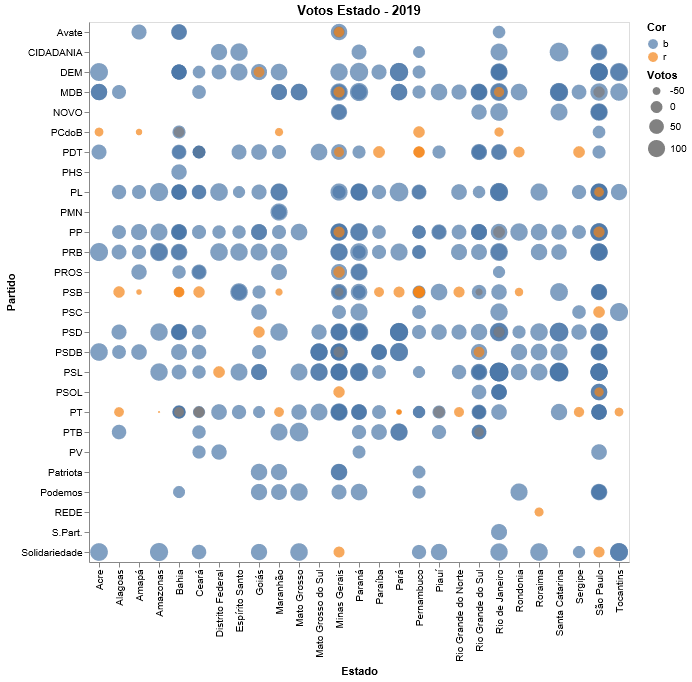

In [110]:
alt.Chart(df).mark_circle().encode(x='Estado:O',y='Partido:O',size='Votos:Q',color='Cor:N',tooltip=['Nome','Partido','Estado']).properties(title='Votos Estado - 2019')

In [170]:
df2['Voto']=0
for i in range(len(df2)):
    if df2['Votos'].iloc[i]<0:
        df2['Voto'].iloc[i]='separado'
    else:
        df2['Voto'].iloc[i]='junto'

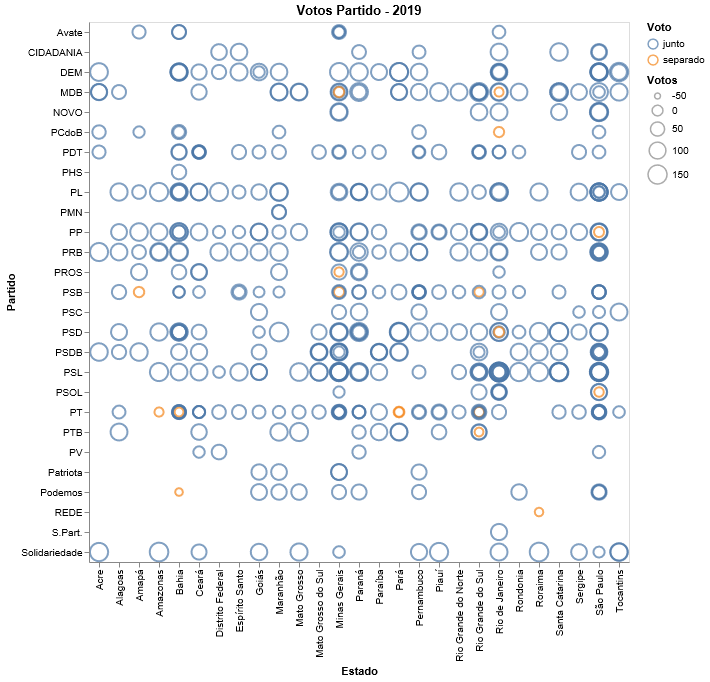

In [174]:
chart_part.save('chart_part_votos.html')
chart_part

In [173]:
chart_part=alt.Chart(df2).mark_point().encode(x='Estado:O',y='Partido:O',size='Votos:Q',color='Voto:N',tooltip=['Nome','Partido','Estado']).properties(title='Votos Partido - 2019')

In [158]:
#alt.Chart(df).mark_point().encode(alt.Y('Id:Q',scale=alt.Scale(zero=False)),x='Partido:O',size='Votos:Q',color='Cor:N',facet='Estado',tooltip=['Nome','Partido','Estado']).properties(columns=5,width=400,height=50,title='Votos Estado - 2019')

In [167]:
ch_est=alt.Chart(df).mark_point().encode(x='Estado:O',y='Partido:O',size='Votos:Q',color='Voto:N',tooltip=['Nome','Partido','Estado']).properties(title='Votos Estado - 2019')

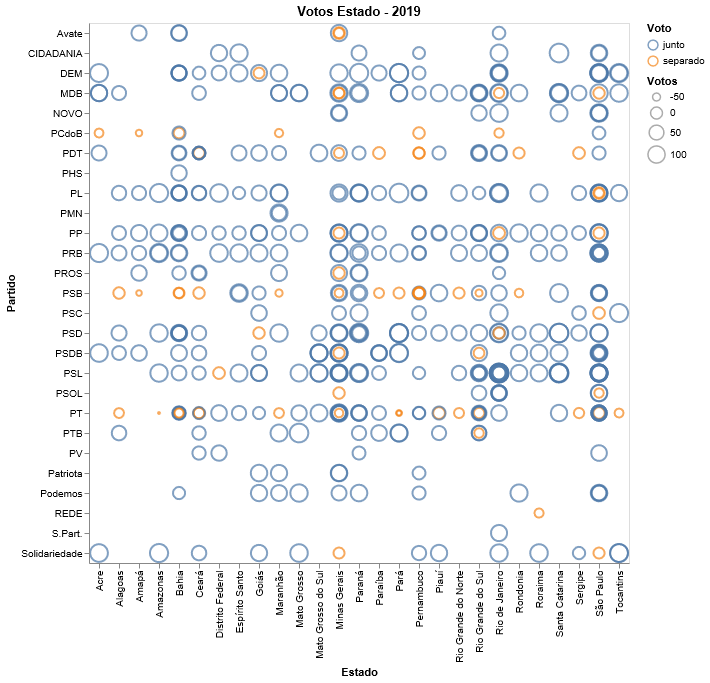

In [168]:
ch_est.save('chart_estado_votos.html')
ch_est